In [ ]:
from pathlib import Path
import numpy as np
import os, shutil
import matplotlib.pyplot as plt

from PIL import Image

from tqdm.auto import tqdm

import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
import torch.optim as optim

from torchvision.models import resnet50, ResNet50_Weights

In [ ]:
import urllib.request
import tarfile
import os

url = "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938130-1629953152/screw.tar.xz"
filename = "screw.tar.xz"

# Download the file
local_filename, headers = urllib.request.urlretrieve(url, filename)

# Check if the file exists before extracting
if os.path.exists(local_filename):
    with tarfile.open(local_filename) as f:
        f.extractall('.')
    print("Extraction complete.")
else:
    print(f"Download failed: {local_filename} does not exist.")

Extraction complete.


In [ ]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

train_image_path = Path('/content/screw/train')

good_dataset = ImageFolder(root=train_image_path, transform=transform)
train_dataset, test_dataset = torch.utils.data.random_split(good_dataset, [0.8, 0.2])

# Set the batch size
BS = 16

# Create data loaders for training and testing datasets
train_loader = DataLoader(train_dataset, batch_size=BS, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BS, shuffle=True)

In [ ]:
'''resnet_feature_extractor 
this function extracts features from a pretrained ResNet model.
features types are: 1. layer2[-1] 2. layer3[-1]
then it merges the features into a single tensor.
'''
class resnet_feature_extractor(torch.nn.Module):
    def __init__(self):
        """This class extracts the feature maps from a pretrained Resnet model."""
        super(resnet_feature_extractor, self).__init__()
        self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

        self.model.eval()
        for param in self.model.parameters():
            param.requires_grad = False



        # Hook to extract feature maps
        def hook(module, input, output) -> None:
            """This hook saves the extracted feature map on self.featured."""
            self.features.append(output)

        self.model.layer2[-1].register_forward_hook(hook)
        self.model.layer3[-1].register_forward_hook(hook)

    def forward(self, input):

        self.features = []
        with torch.no_grad():
            _ = self.model(input)

        self.avg = torch.nn.AvgPool2d(3, stride=1)
        fmap_size = self.features[0].shape[-2]         # Feature map sizes h, w
        self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

        resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]
        patch = torch.cat(resized_maps, 1)            # Merge the resized feature maps

        return patch

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 159MB/s]


Feature map 1 shape: torch.Size([1, 512, 28, 28])
Feature map 2 shape: torch.Size([1, 1024, 14, 14])
Combined feature shape: torch.Size([1, 1536, 28, 28])


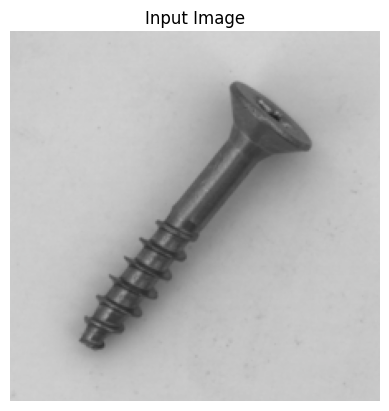

In [ ]:
''''''
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# === Define transform with RGB + Normalization ===
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ResNet50 normalization
                         std=[0.229, 0.224, 0.225])
])

# === Load image and convert to RGB ===
image = Image.open('/content/screw/test/manipulated_front/000.png').convert('RGB')
input_tensor = transform(image).unsqueeze(0)  # shape: [1, 3, 224, 224]

# === Use the feature extractor ===
backbone = resnet_feature_extractor()  # Use your corrected class name
feature = backbone(input_tensor)

# === Print shapes of extracted feature maps ===
print("Feature map 1 shape:", backbone.features[0].shape)
print("Feature map 2 shape:", backbone.features[1].shape)
print("Combined feature shape:", feature.shape)

# === Display input image ===
# (unnormalize for visualization)
unnorm = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
)
img_to_show = unnorm(input_tensor.squeeze()).clamp(0, 1)

plt.imshow(img_to_show.permute(1, 2, 0))
plt.title("Input Image")
plt.axis('off')
plt.show()

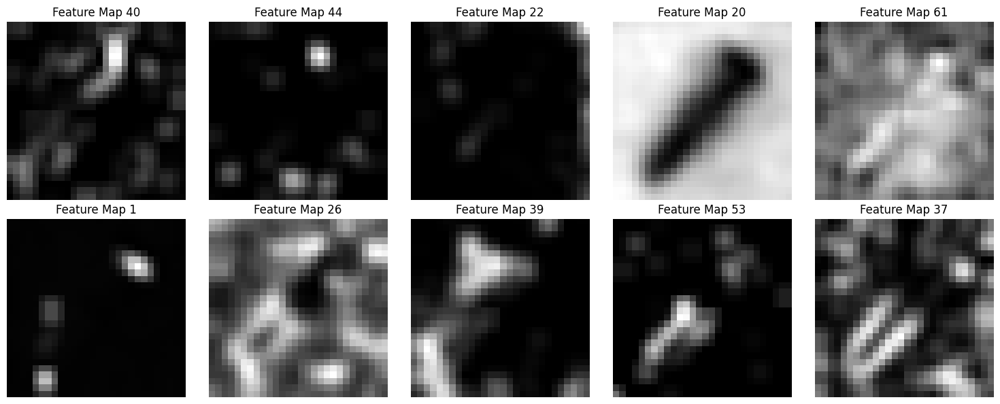

In [ ]:
# Select 10 random indices for feature maps
indices = torch.randperm(64)[:10]

# Plot the selected feature maps
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, idx in enumerate(indices):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(feature[0,idx].detach().cpu(), cmap='gray')
    axes[row, col].set_title(f'Feature Map {idx}')
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import torch.nn as nn
'''class FeatCAE is an autoencoder that learns a compressed representation of the input features.
this autoencoder consists of an encoder and a decoder.
and it is designed to reconstruct the input features from the compressed representation.
this helps in learning a more compact and informative representation of the features.
using this autoencoder, we can effectively reduce the dimensionality of the feature space while preserving important information.
which will aid in downstream tasks such as classification or anomaly detection.'''
class FeatCAE(nn.Module):
    """Autoencoder."""

    def __init__(self, in_channels=1000, latent_dim=50, is_bn=True):
        super(FeatCAE, self).__init__()

        layers = []
        layers += [nn.Conv2d(in_channels, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, latent_dim, kernel_size=1, stride=1, padding=0)]

        self.encoder = nn.Sequential(*layers)

        # if 1x1 conv to reconstruct the rgb values, we try to learn a linear combination
        # of the features for rgb
        layers = []
        layers += [nn.Conv2d(latent_dim, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, in_channels, kernel_size=1, stride=1, padding=0)]
        # layers += [nn.ReLU()]

        self.decoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:
model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
backbone.cuda()
# Define loss function and optimizer
criterion = torch.nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
torch.save(model.state_dict(), 'autoencoder_with_resnet_deep_features.pth')


In [ ]:
ckpoints = torch.load('autoencoder_with_resnet_deep_features.pth',map_location=torch.device('cpu'))
model.load_state_dict(ckpoints)

model.eval()

FeatCAE(
  (encoder): Sequential(
    (0): Conv2d(1536, 868, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(868, 200, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(200, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  (decoder): Sequential(
    (0): Conv2d(100, 200, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(200, 868, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(868, 1536, kernel_size=(1, 1), stride=(1, 1))
  )
)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch [1/100], Loss: 0.0735, Validation Loss: 0.0762
Epoch [6/100], Loss: 0.0415, Validation Loss: 0.0416
Epoch [11/100], Loss: 0.0369, Validation Loss: 0.0329
Epoch [16/100], Loss: 0.0307, Validation Loss: 0.0292
Epoch [21/100], Loss: 0.0269, Validation Loss: 0.0256
Epoch [26/100], Loss: 0.0239, Validation Loss: 0.0237
Epoch [31/100], Loss: 0.0212, Validation Loss: 0.0217
Epoch [36/100], Loss: 0.0206, Validation Loss: 0.0213
Epoch [41/100], Loss: 0.0200, Validation Loss: 0.0208
Epoch [46/100], Loss: 0.0202, Validation Loss: 0.0207
Epoch [51/100], Loss: 0.0190, Validation Loss: 0.0196
Epoch [56/100], Loss: 0.0174, Validation Loss: 0.0182
Epoch [61/100], Loss: 0.0179, Validation Loss: 0.0175
Epoch [66/100], Loss: 0.0173, Validation Loss: 0.0178
Epoch [71/100], Loss: 0.0167, Validation Loss: 0.0169
Epoch [76/100], Loss: 0.0162, Validation Loss: 0.0164
Epoch [81/100], Loss: 0.0162, Validation Loss: 0.0169
Epoch [86/100], Loss: 0.0150, Validation Loss: 0.0158
Epoch [91/100], Loss: 0.0159, 

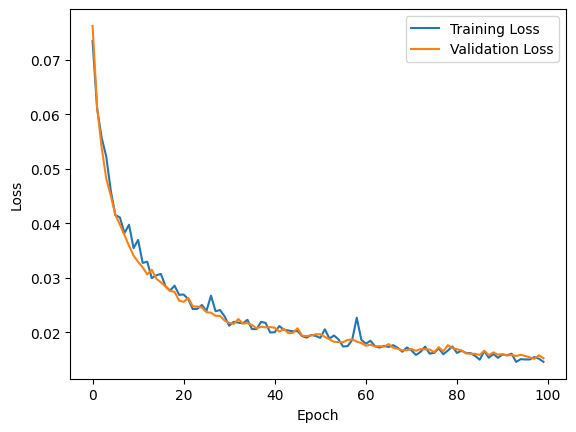

In [ ]:
# Define a list to store training loss and validation loss
Loss = []
Validation_Loss = []


num_epochs = 100
for epoch in tqdm(range(num_epochs)):
    model.train()
    for data,_ in train_loader:
        with torch.no_grad():
            features = backbone(data.cuda())
        # Forward pass
        output = model(features)
        # Compute the loss
        loss = criterion(output, features)
        # Backpropagation and optimization step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    Loss.append(loss.item())

    # Calculate validation loss
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        val_loss_sum = 0.0
        num_batches = 0
        for data, _ in test_loader:
            features = backbone(data.cuda())
            output = model(features)
            val_loss = criterion(output, features)
            val_loss_sum += val_loss.item()
            num_batches += 1
        val_loss_avg = val_loss_sum / num_batches
        Validation_Loss.append(val_loss_avg)

    if epoch % 5 == 0:
        print('Epoch [{}/{}], Loss: {:.4f}, Validation Loss: {:.4f}'.format(epoch + 1, num_epochs, loss.item(), val_loss_avg))

plt.plot(Loss, label='Training Loss')
plt.plot(Validation_Loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
torch.save(model.state_dict(), 'autoencoder_with_resnet_deep_features.pth')

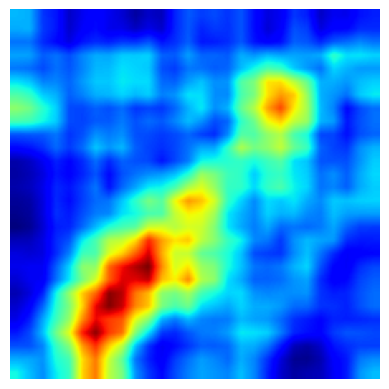

In [ ]:
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Make sure 'transform' is defined to convert to tensor and normalize for 3 channels
# Example:
# transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
# ])

image = Image.open(r'/content/screw/test/manipulated_front/000.png').convert("RGB")  # 🔧 Ensure 3-channel image
image = transform(image).unsqueeze(0).cuda()

with torch.no_grad():
    features = backbone(image)
    recon = model(features)

# Calculate reconstruction error
recon_error = ((features - recon) ** 2).mean(axis=1).unsqueeze(0)

# Upsample the error map to input image size
segm_map = torch.nn.functional.interpolate(
    recon_error,
    size=(224, 224),
    mode='bilinear'
)

# Plot the anomaly heatmap
plt.imshow(segm_map.squeeze().cpu().numpy(), cmap='jet')
plt.axis('off')
plt.show()

In [ ]:
def decision_function(segm_map):

    mean_top_10_values = []

    for map in segm_map:
        # Flatten the tensor
        flattened_tensor = map.reshape(-1)

        # Sort the flattened tensor along the feature dimension (descending order)
        sorted_tensor, _ = torch.sort(flattened_tensor,descending=True)

        # Take the top 10 values along the feature dimension
        mean_top_10_value = sorted_tensor[:10].mean()

        mean_top_10_values.append(mean_top_10_value)

    return torch.stack(mean_top_10_values)

In [ ]:
model.eval()

RECON_ERROR=[]
for data,_ in train_loader:

    with torch.no_grad():
        features = backbone(data.cuda()).squeeze()
        # Forward pass
        recon = model(features)
    # Compute the loss
    segm_map =  ((features-recon)**2).mean(axis=(1))[:,3:-3,3:-3]
    anomaly_score = decision_function(segm_map)
    # anomaly_score = segm_map.mean(axis=(1,2))

    RECON_ERROR.append(anomaly_score)

RECON_ERROR = torch.cat(RECON_ERROR).cpu().numpy()

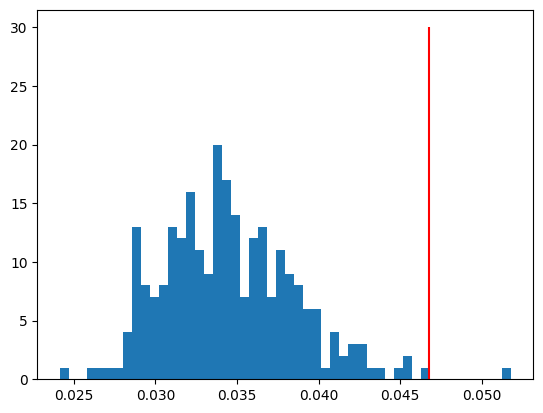

In [ ]:
best_threshold = np.mean(RECON_ERROR) + 3 * np.std(RECON_ERROR)

heat_map_max, heat_map_min = np.max(RECON_ERROR), np.min(RECON_ERROR)

plt.hist(RECON_ERROR,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

In [ ]:
import numpy as np
from PIL import Image
from pathlib import Path

y_true = []
y_pred = []
y_score = []

model.eval()
backbone.eval()

test_path = Path('/content/screw/test')

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]

    # ✅ Make sure image is in RGB
    image = Image.open(path).convert('RGB')
    test_image = transform(image).unsqueeze(0).cuda()

    with torch.no_grad():
        features = backbone(test_image)
        recon = model(features)

    # Calculate segmentation map
    segm_map = ((features - recon) ** 2).mean(axis=(1))[:, 3:-3, 3:-3]

    # Apply decision function
    y_score_image = decision_function(segm_map=segm_map)  # output: [tensor([score])]
    y_pred_image = 1 * (y_score_image >= best_threshold)
    y_true_image = 0 if fault_type == 'good' else 1

    # ✅ Convert tensor -> scalar using .item()
    y_true.append(y_true_image)
    y_pred.append(y_pred_image.item())
    y_score.append(y_score_image.item())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

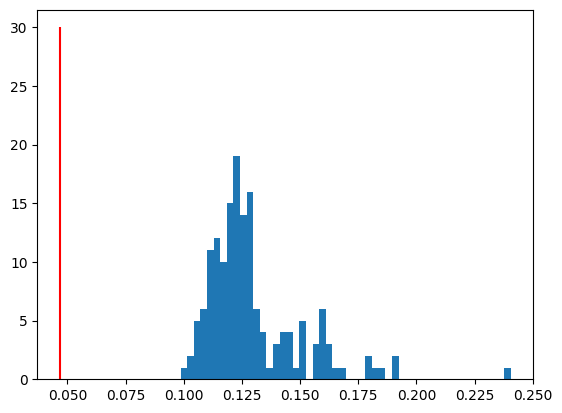

In [ ]:
plt.hist(y_score,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

AUC-ROC Score: 0.8563230170116828


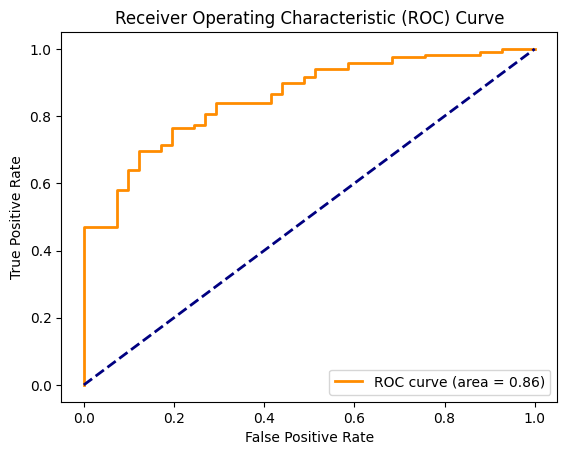

Best threshold = 0.11419504880905151


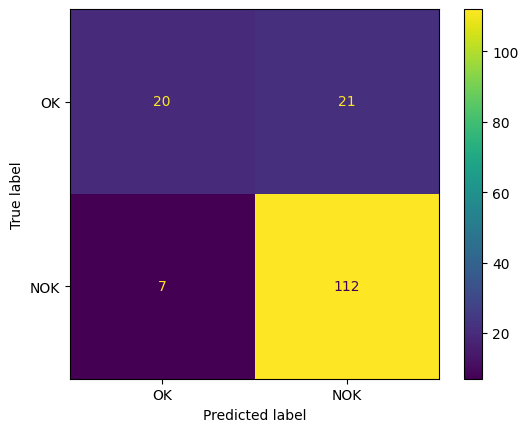

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, f1_score
import seaborn as sns

# Example placeholders (Replace with your actual arrays)
# y_true = np.array([...])
# y_score = np.array([...])

# Safety check to avoid empty arrays
if len(y_true) == 0 or len(y_score) == 0:
    print("Error: y_true or y_score is empty. Cannot compute AUC-ROC.")
else:
    # Calculate AUC-ROC score
    auc_roc_score = roc_auc_score(y_true, y_score)
    print("AUC-ROC Score:", auc_roc_score)

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(y_true, y_score)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc_score)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Calculate F1 scores across thresholds
    f1_scores = [f1_score(y_true, y_score >= threshold) for threshold in thresholds]

    # Select the best threshold based on F1 score
    best_threshold = thresholds[np.argmax(f1_scores)]
    print(f'Best threshold = {best_threshold}')

    # Generate confusion matrix
    cm = confusion_matrix(y_true, (y_score >= best_threshold).astype(int))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['OK', 'NOK'])
    disp.plot()
    plt.show()

In [28]:
import cv2, time
from IPython.display import clear_output

model.eval()
backbone.eval()

test_path = Path('/content/screw/test')

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]

    image = Image.open(path).convert('RGB')  # ✅ Fix: ensure 3 channels
    test_image = transform(image).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))
    y_score_image = decision_function(segm_map=segm_map)
    y_pred_image = 1 * (y_score_image >= best_threshold)
    class_label = ['OK', 'NOK']

    if fault_type in ['thread']:
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(test_image.squeeze().permute(1, 2, 0).cpu().numpy())
        plt.title(f'fault type: {fault_type}')

        plt.subplot(1, 3, 2)
        heat_map = segm_map.squeeze().cpu().numpy()
        heat_map = cv2.resize(heat_map, (128, 128))
        plt.imshow(heat_map, cmap='jet', vmin=heat_map_min, vmax=heat_map_max * 10)
        plt.title(f'Anomaly score: {y_score_image[0].cpu().numpy() / best_threshold:0.4f} || {class_label[y_pred_image]}')

        plt.subplot(1, 3, 3)
        plt.imshow((heat_map > best_threshold * 10), cmap='gray')
        plt.title('segmentation map')

        plt.show()

        # time.sleep(0.05)
        # clear_output(wait=True)

        # break


Total images found: 160

Processing: 008.png | Fault Type: thread_side
Anomaly Score: 0.1143
Heatmap stats -> min: 0.0516, max: 0.1243


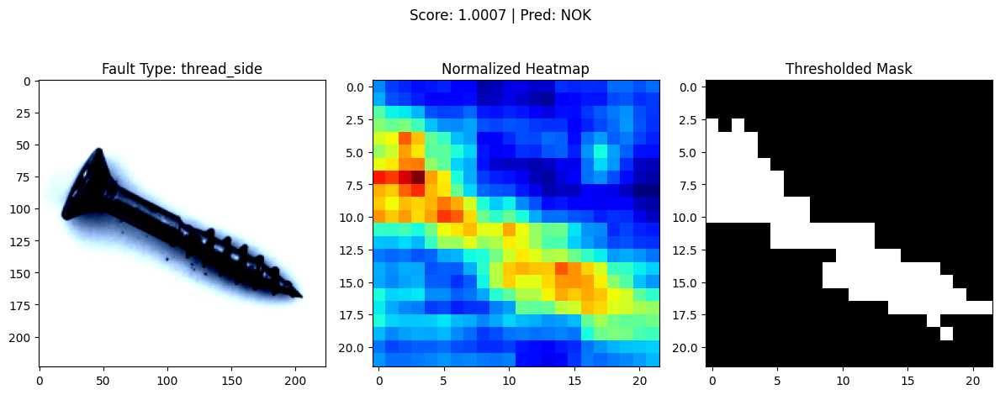


Processing: 004.png | Fault Type: thread_side
Anomaly Score: 0.1264
Heatmap stats -> min: 0.0480, max: 0.1335


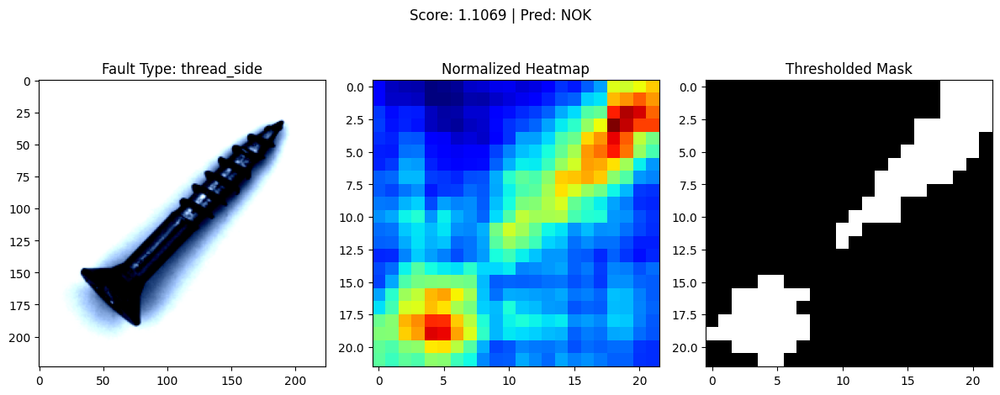


Processing: 014.png | Fault Type: thread_side
Anomaly Score: 0.1442
Heatmap stats -> min: 0.0584, max: 0.1552


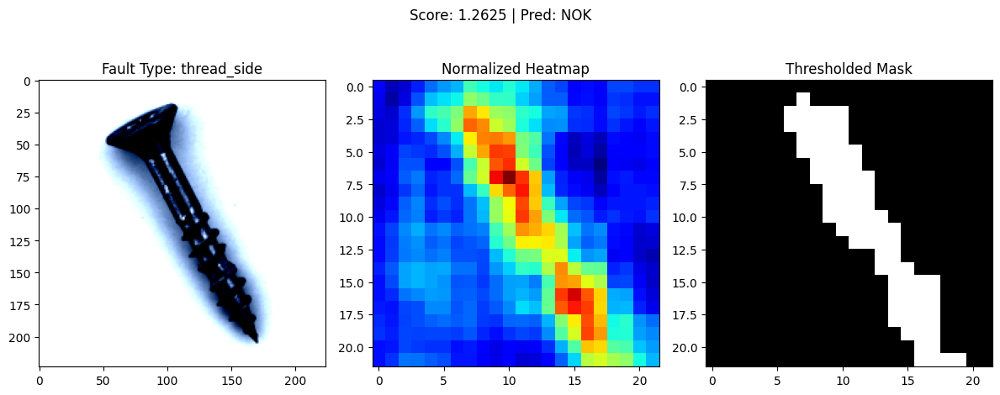


Processing: 016.png | Fault Type: thread_side
Anomaly Score: 0.1144
Heatmap stats -> min: 0.0538, max: 0.1217


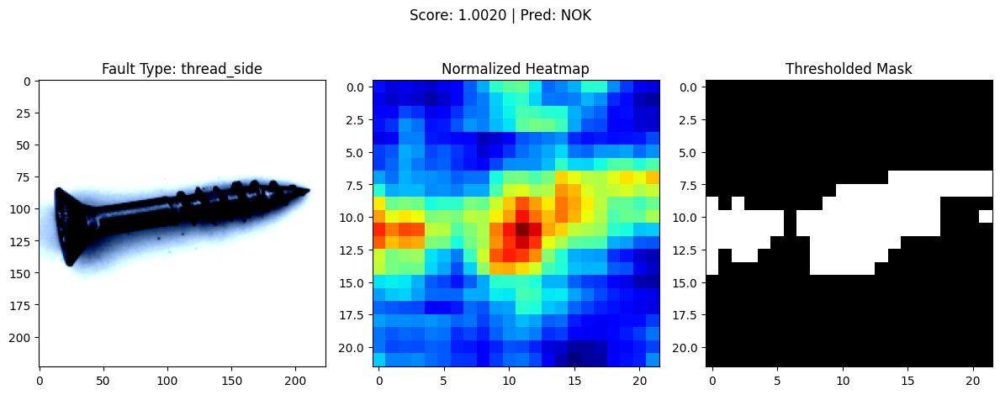


Processing: 013.png | Fault Type: thread_side
Anomaly Score: 0.1272
Heatmap stats -> min: 0.0530, max: 0.1315


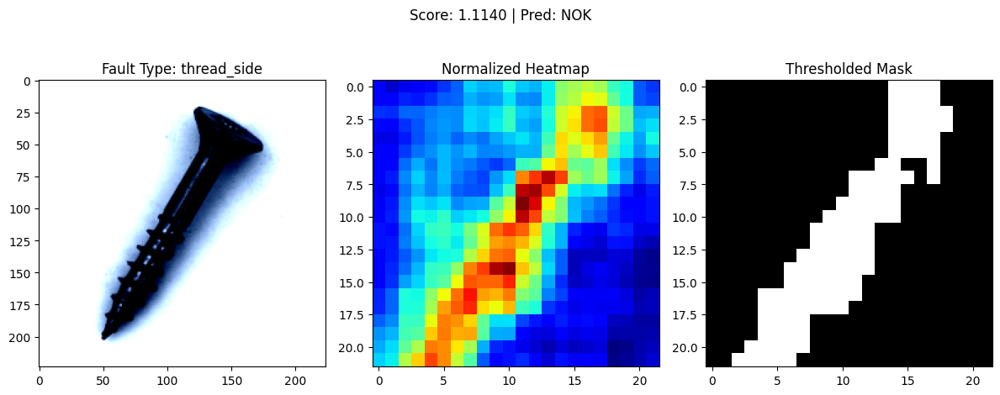


Processing: 007.png | Fault Type: thread_side
Anomaly Score: 0.1314
Heatmap stats -> min: 0.0535, max: 0.1387


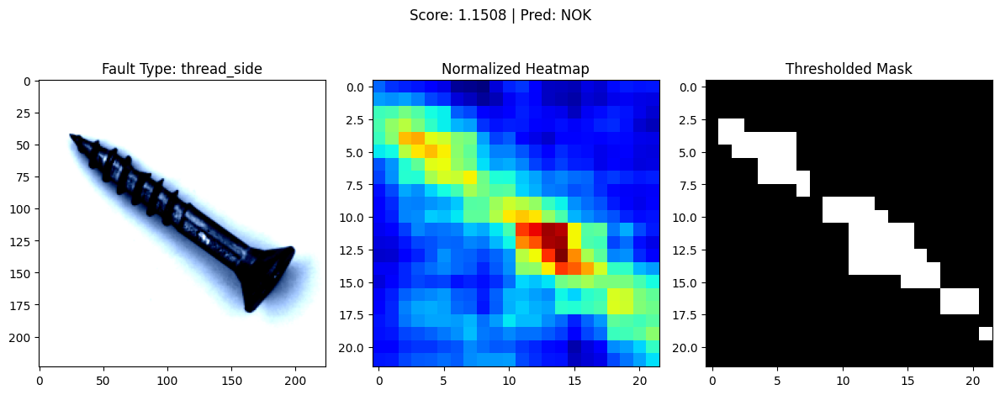


Processing: 011.png | Fault Type: thread_side
Anomaly Score: 0.1217
Heatmap stats -> min: 0.0583, max: 0.1334


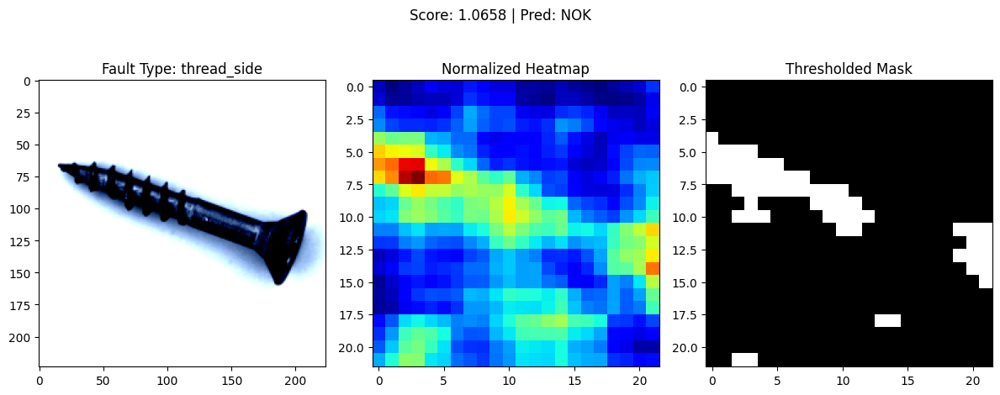


Processing: 022.png | Fault Type: thread_side
Anomaly Score: 0.1275
Heatmap stats -> min: 0.0492, max: 0.1326


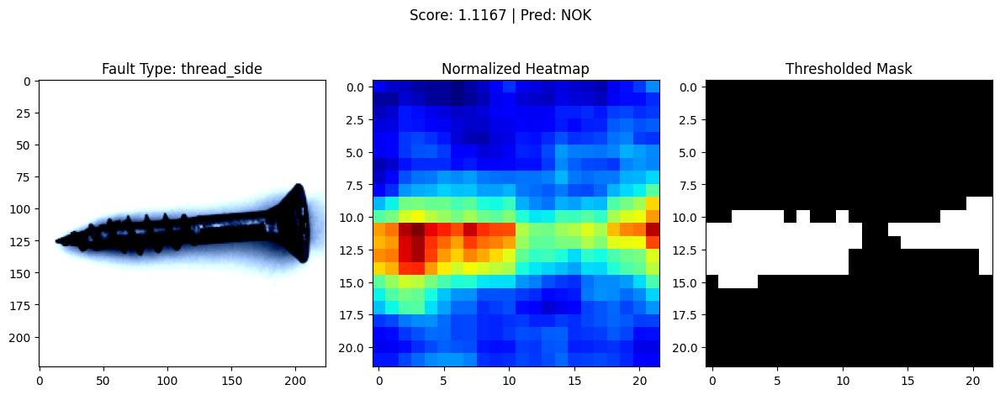


Processing: 021.png | Fault Type: thread_side
Anomaly Score: 0.1192
Heatmap stats -> min: 0.0542, max: 0.1276


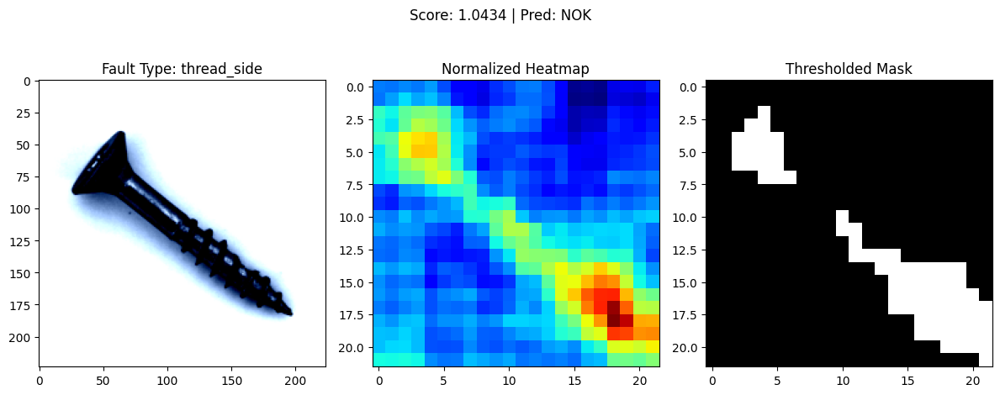


Processing: 010.png | Fault Type: thread_side
Anomaly Score: 0.1230
Heatmap stats -> min: 0.0493, max: 0.1329


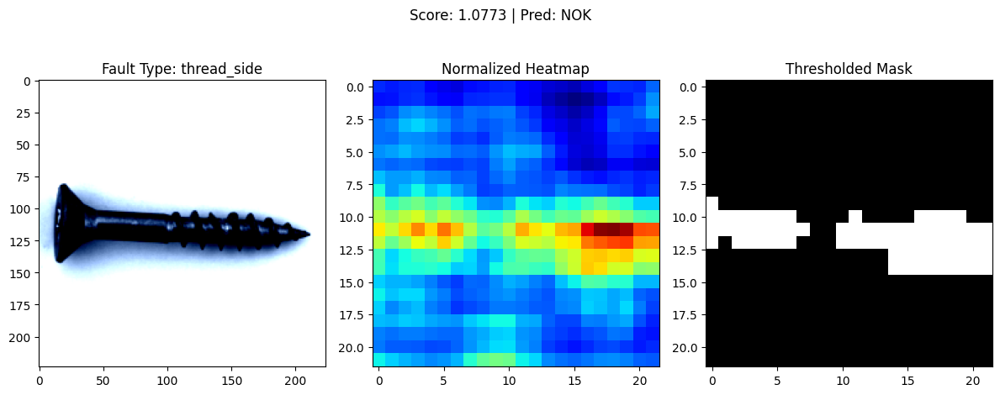


Processing: 002.png | Fault Type: thread_side
Anomaly Score: 0.1310
Heatmap stats -> min: 0.0500, max: 0.1389


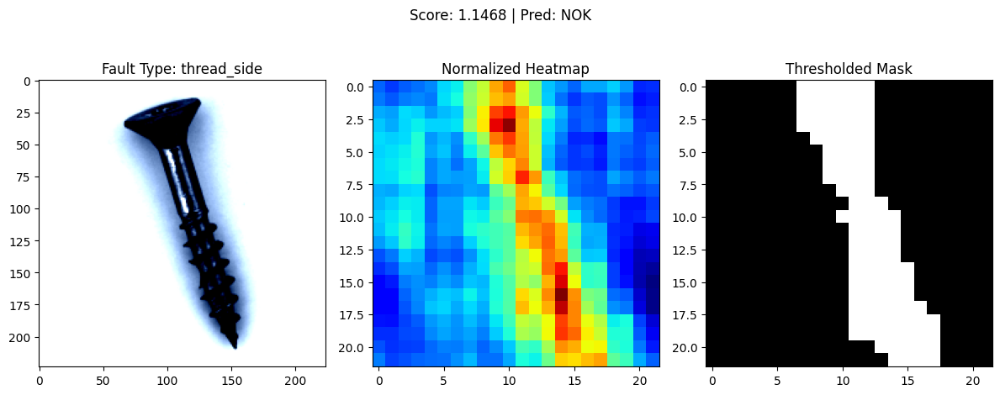


Processing: 018.png | Fault Type: thread_side
Anomaly Score: 0.1308
Heatmap stats -> min: 0.0571, max: 0.1342


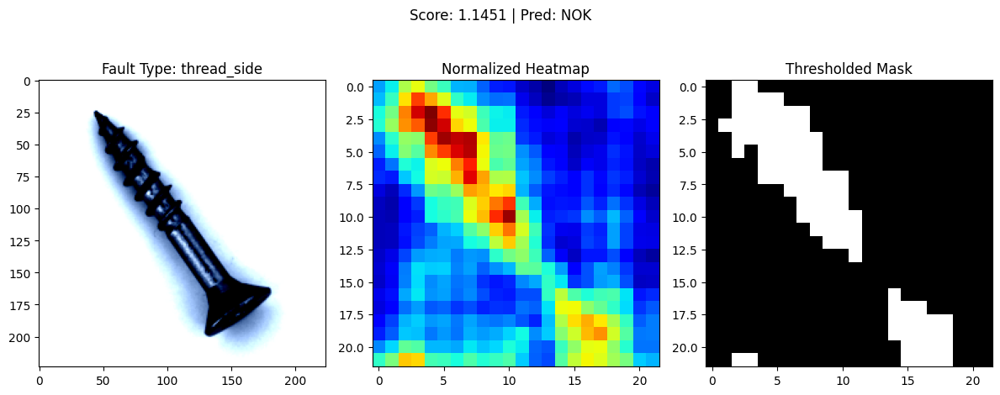


Processing: 001.png | Fault Type: thread_side
Anomaly Score: 0.1119
Heatmap stats -> min: 0.0515, max: 0.1191


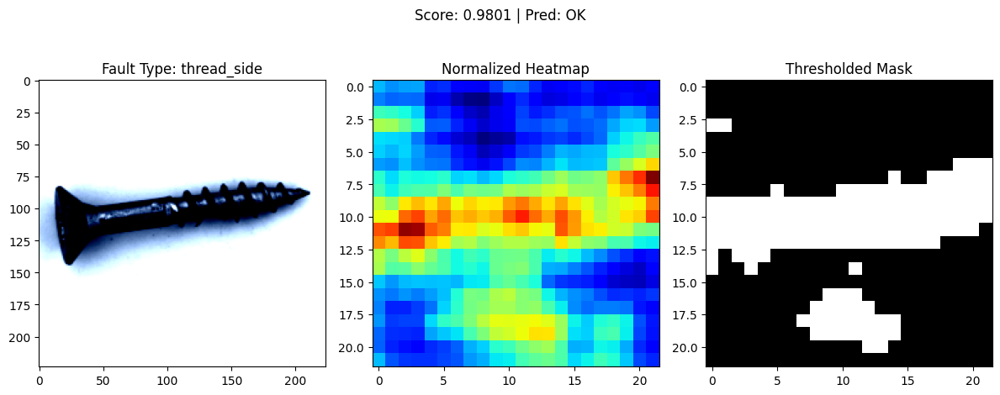


Processing: 009.png | Fault Type: thread_side
Anomaly Score: 0.1201
Heatmap stats -> min: 0.0540, max: 0.1286


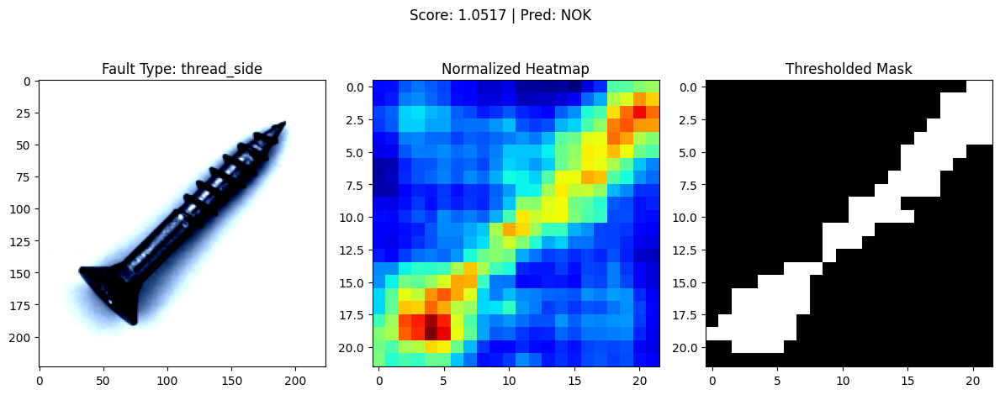


Processing: 003.png | Fault Type: thread_side
Anomaly Score: 0.1219
Heatmap stats -> min: 0.0557, max: 0.1281


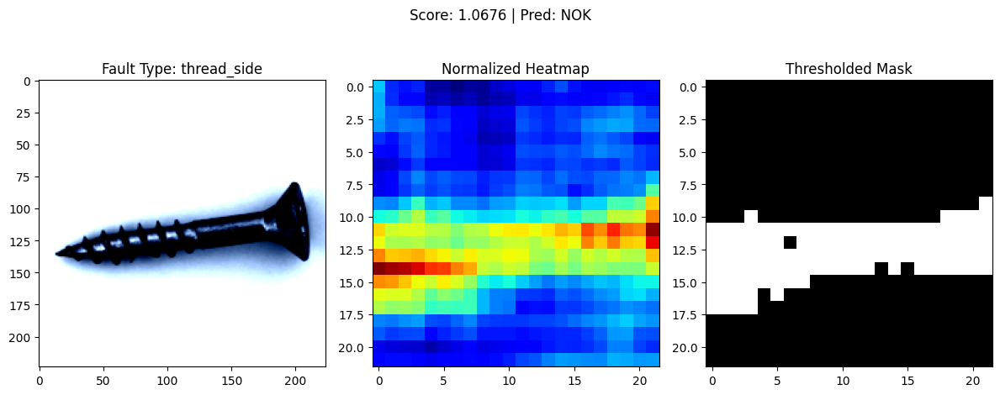


Processing: 019.png | Fault Type: thread_side
Anomaly Score: 0.1287
Heatmap stats -> min: 0.0518, max: 0.1444


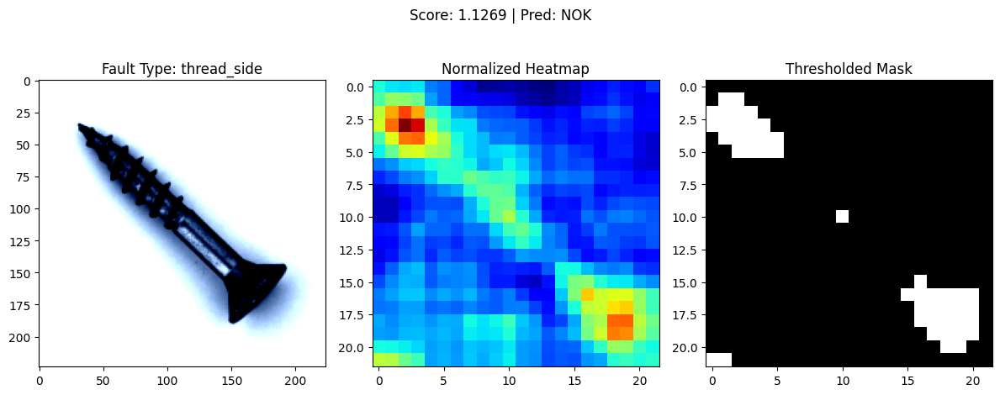


Processing: 000.png | Fault Type: thread_side
Anomaly Score: 0.1217
Heatmap stats -> min: 0.0580, max: 0.1249


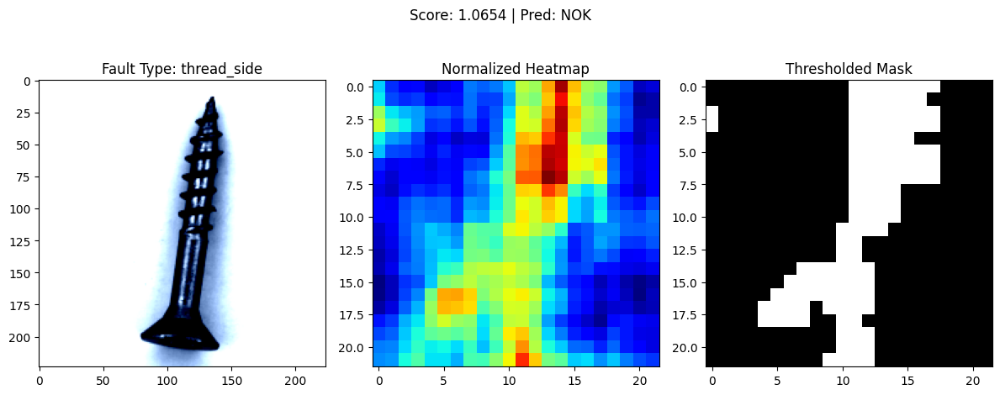


Processing: 015.png | Fault Type: thread_side
Anomaly Score: 0.1045
Heatmap stats -> min: 0.0490, max: 0.1113


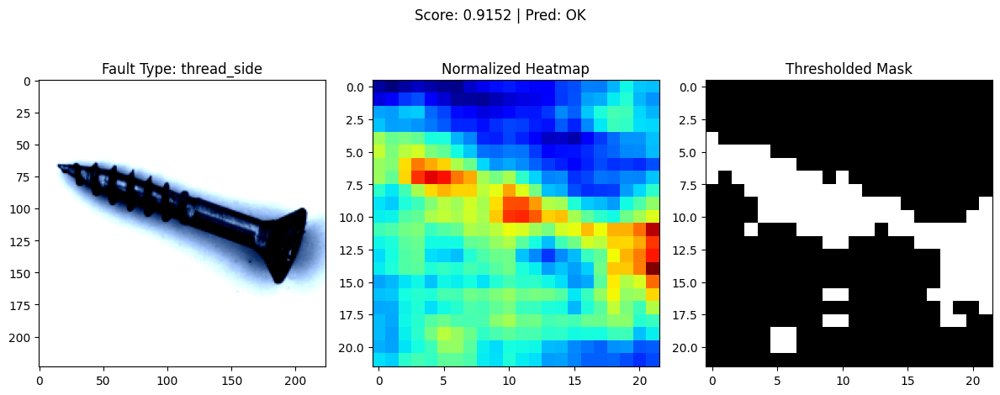


Processing: 005.png | Fault Type: thread_side
Anomaly Score: 0.1236
Heatmap stats -> min: 0.0566, max: 0.1309


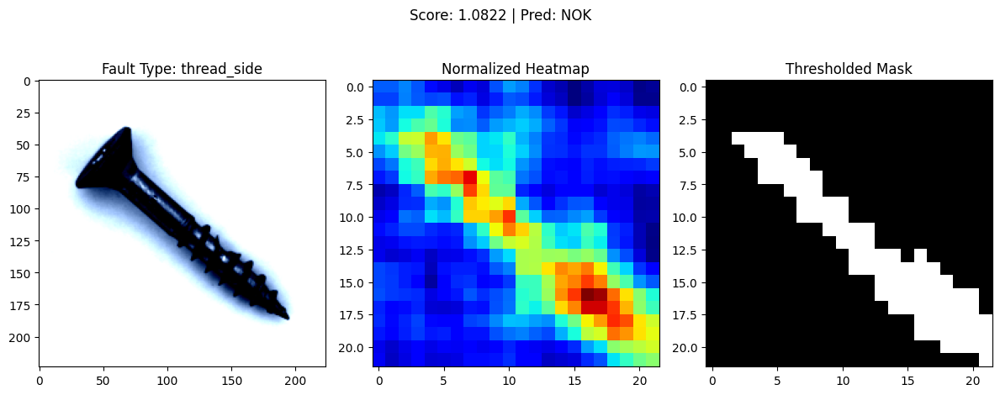


Processing: 006.png | Fault Type: thread_side
Anomaly Score: 0.1206
Heatmap stats -> min: 0.0528, max: 0.1307


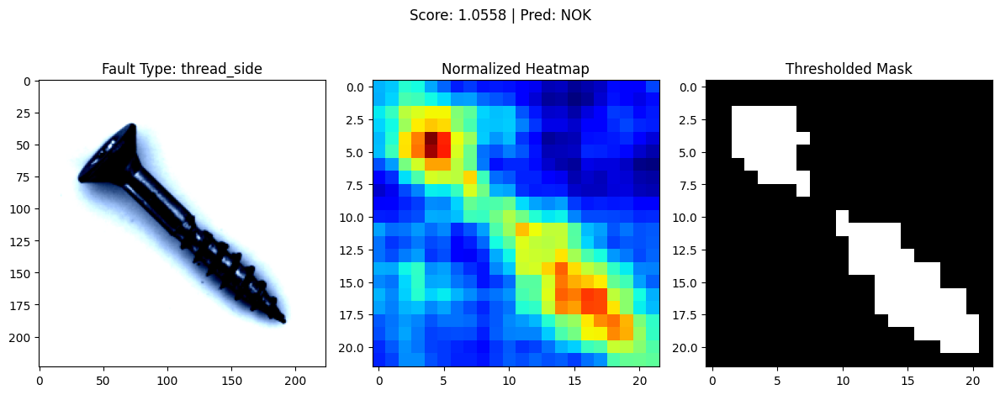


Processing: 017.png | Fault Type: thread_side
Anomaly Score: 0.1631
Heatmap stats -> min: 0.0546, max: 0.1846


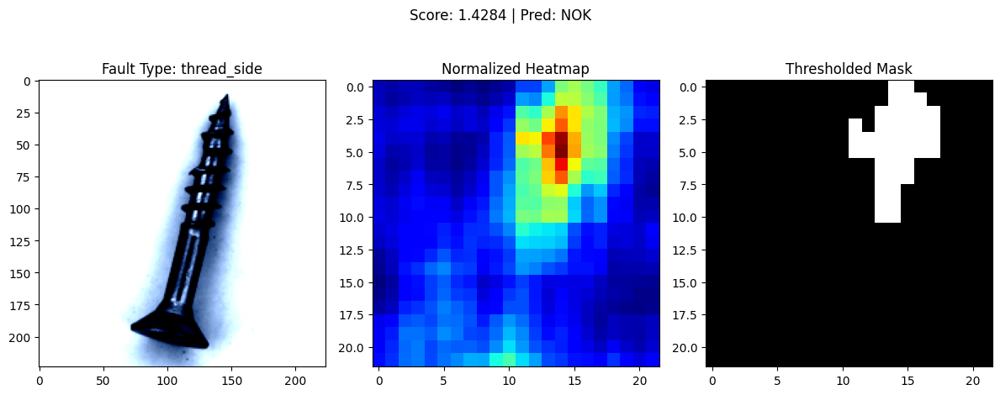


Processing: 020.png | Fault Type: thread_side
Anomaly Score: 0.1270
Heatmap stats -> min: 0.0508, max: 0.1333


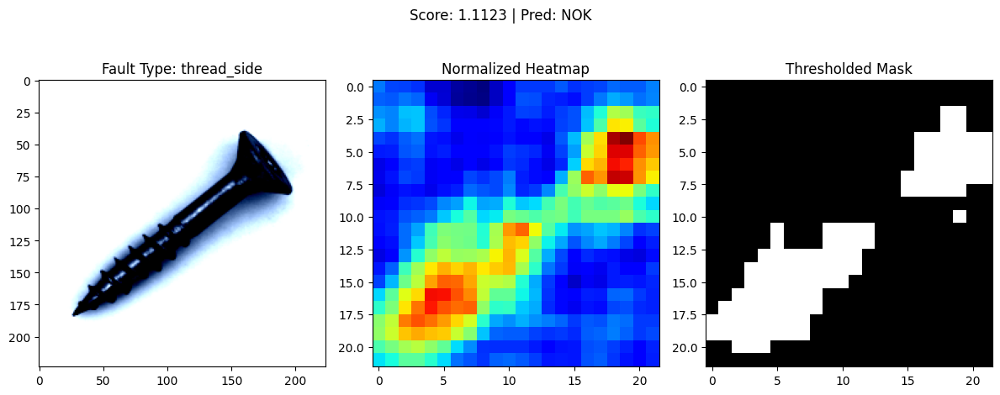


Processing: 012.png | Fault Type: thread_side
Anomaly Score: 0.1105
Heatmap stats -> min: 0.0523, max: 0.1191


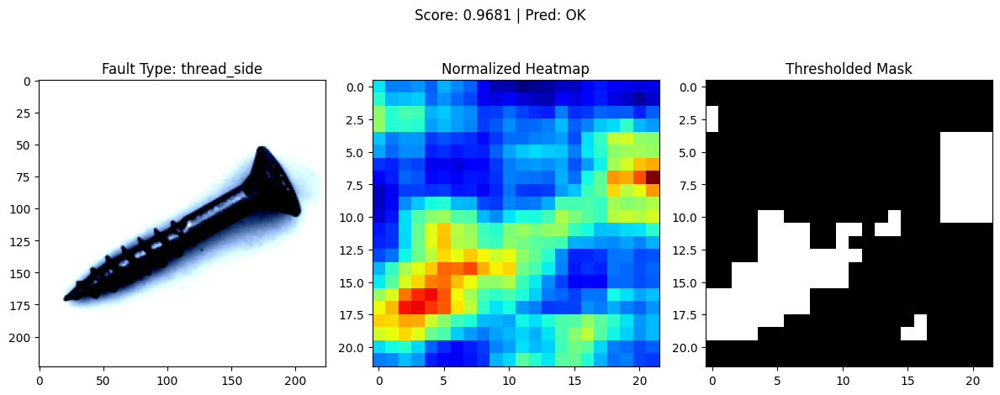


Processing: 008.png | Fault Type: manipulated_front
Anomaly Score: 0.1390
Heatmap stats -> min: 0.0591, max: 0.1642


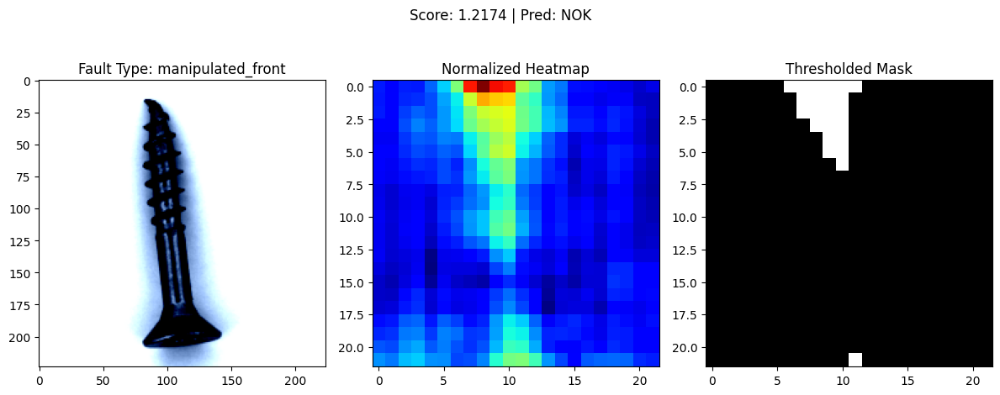


Processing: 004.png | Fault Type: manipulated_front
Anomaly Score: 0.1425
Heatmap stats -> min: 0.0501, max: 0.1600


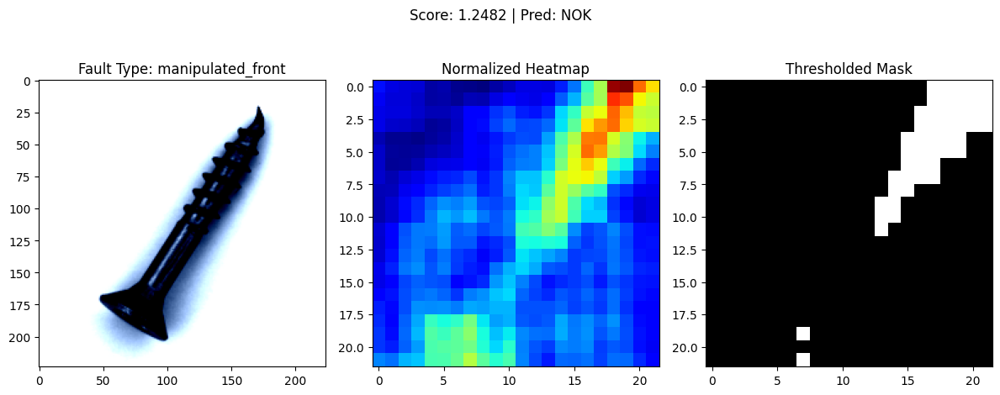


Processing: 014.png | Fault Type: manipulated_front
Anomaly Score: 0.1291
Heatmap stats -> min: 0.0565, max: 0.1400


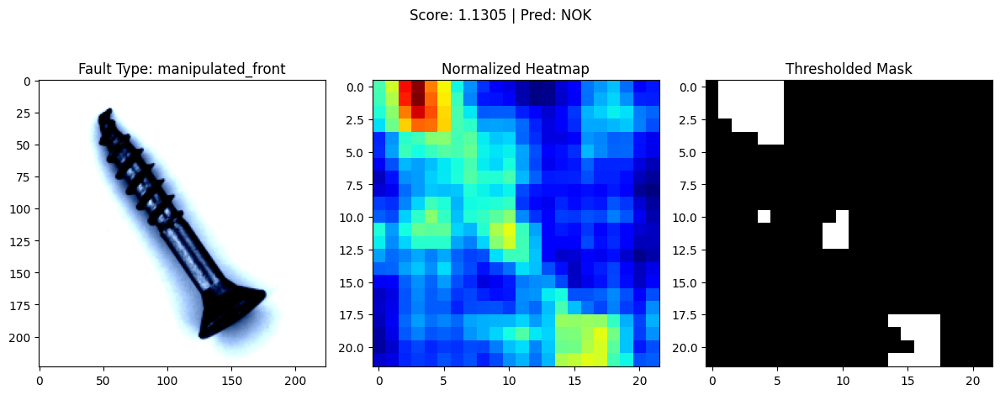


Processing: 016.png | Fault Type: manipulated_front
Anomaly Score: 0.1451
Heatmap stats -> min: 0.0575, max: 0.1697


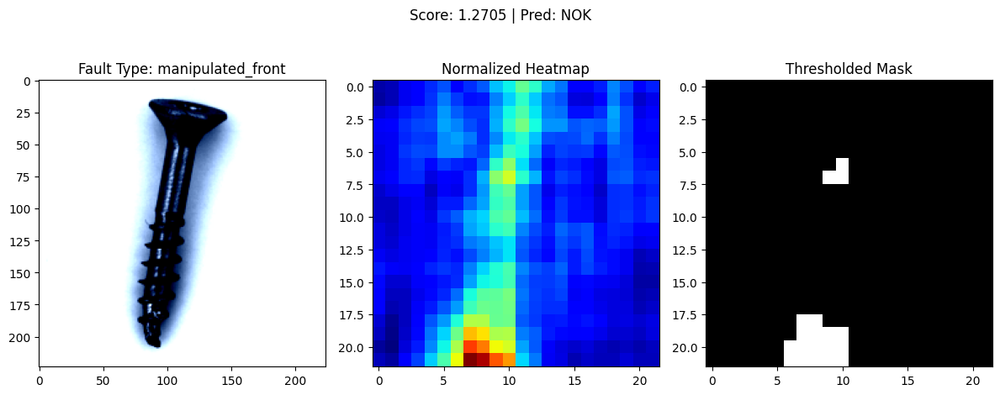


Processing: 013.png | Fault Type: manipulated_front
Anomaly Score: 0.1318
Heatmap stats -> min: 0.0538, max: 0.1410


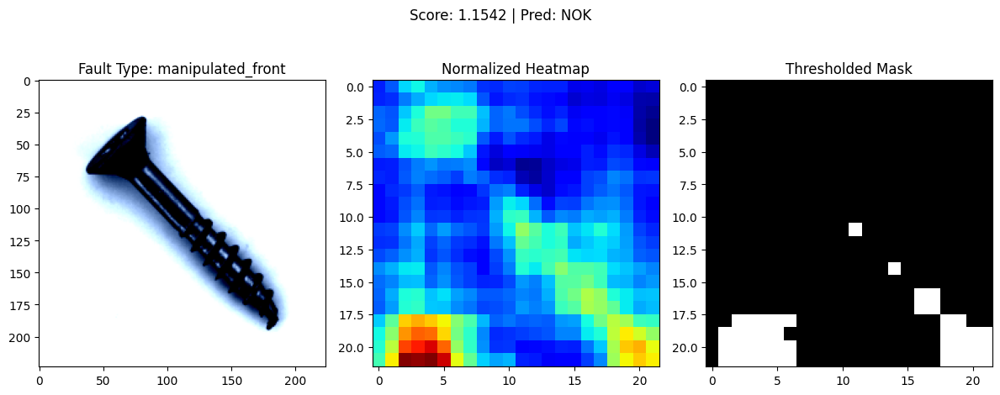


Processing: 007.png | Fault Type: manipulated_front
Anomaly Score: 0.1274
Heatmap stats -> min: 0.0544, max: 0.1410


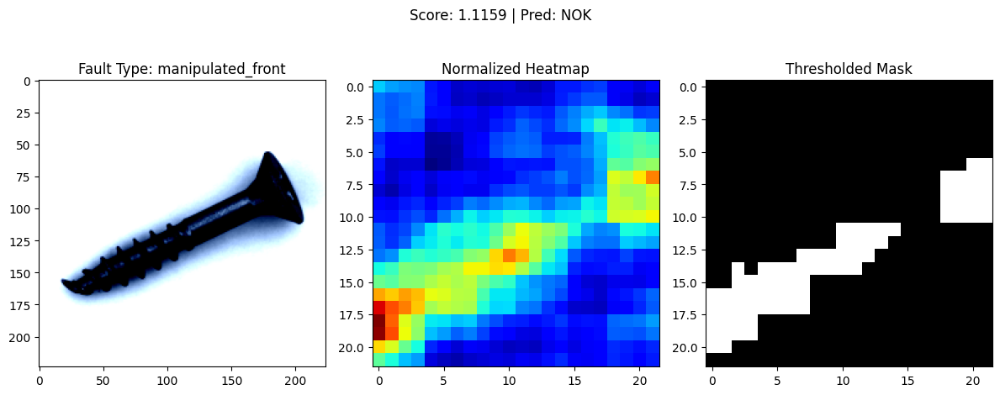


Processing: 011.png | Fault Type: manipulated_front
Anomaly Score: 0.1101
Heatmap stats -> min: 0.0528, max: 0.1215


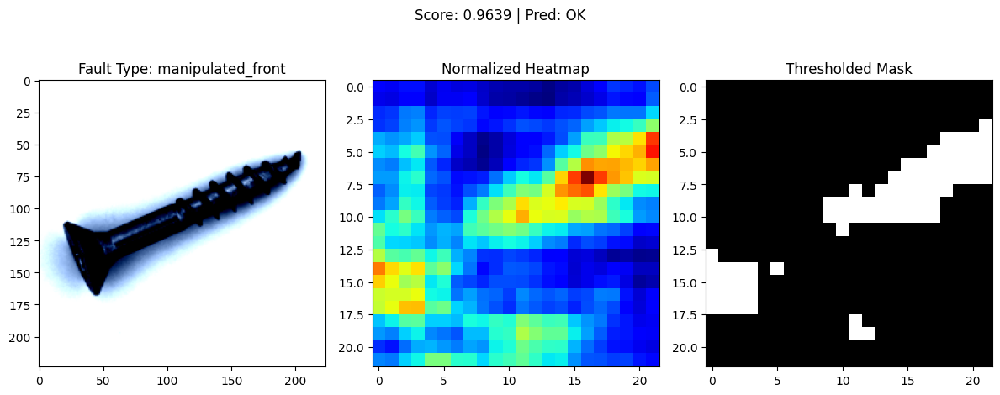


Processing: 022.png | Fault Type: manipulated_front
Anomaly Score: 0.1193
Heatmap stats -> min: 0.0496, max: 0.1246


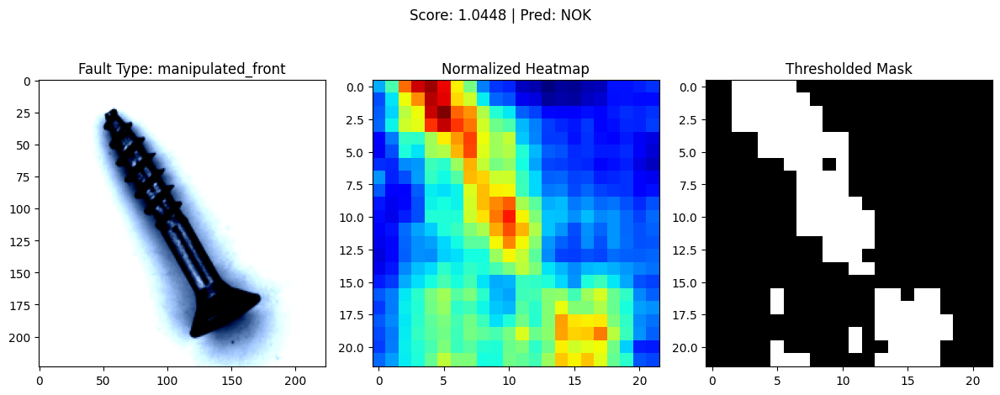


Processing: 021.png | Fault Type: manipulated_front
Anomaly Score: 0.1234
Heatmap stats -> min: 0.0522, max: 0.1279


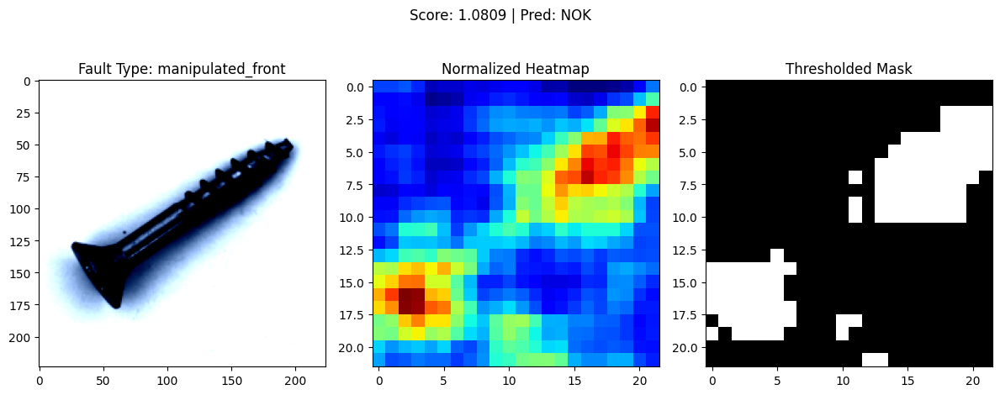


Processing: 010.png | Fault Type: manipulated_front
Anomaly Score: 0.1095
Heatmap stats -> min: 0.0600, max: 0.1171


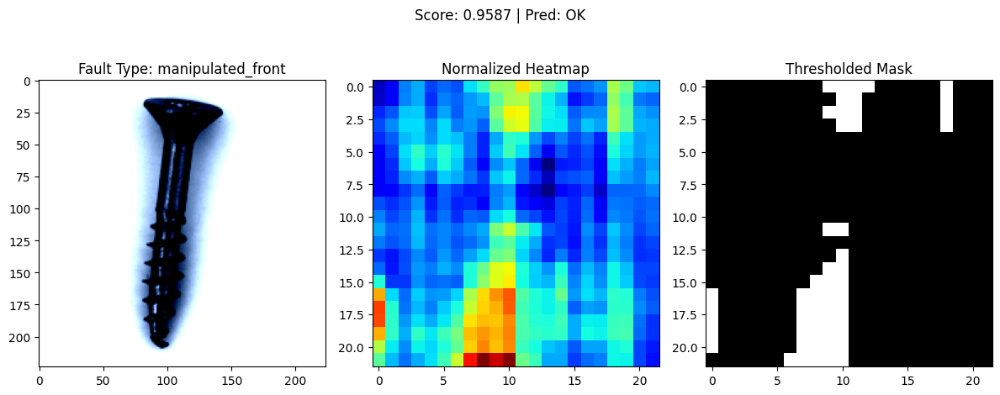


Processing: 002.png | Fault Type: manipulated_front
Anomaly Score: 0.1242
Heatmap stats -> min: 0.0532, max: 0.1306


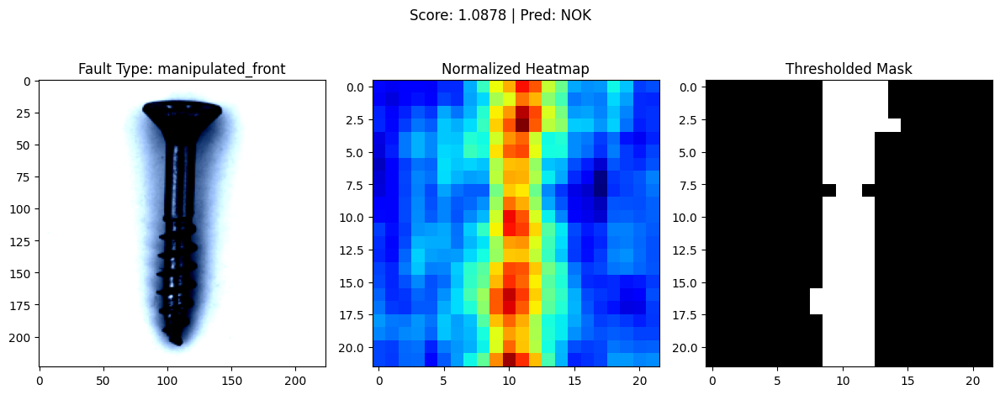


Processing: 018.png | Fault Type: manipulated_front
Anomaly Score: 0.1226
Heatmap stats -> min: 0.0552, max: 0.1371


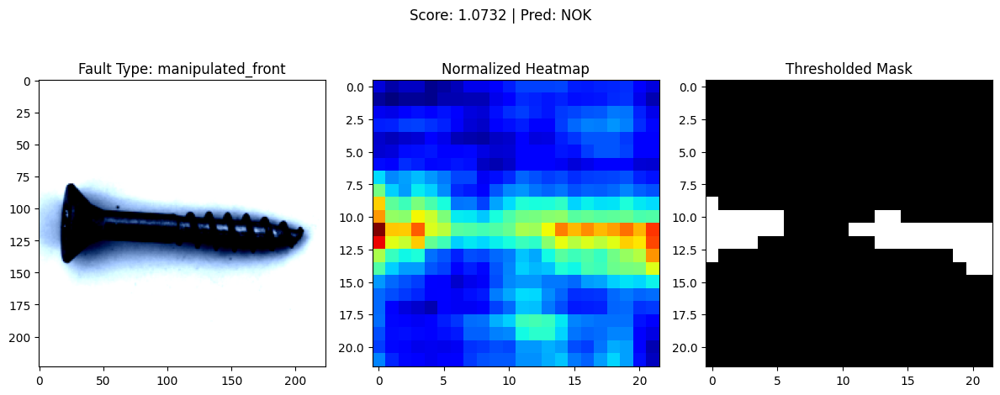


Processing: 001.png | Fault Type: manipulated_front
Anomaly Score: 0.1214
Heatmap stats -> min: 0.0536, max: 0.1334


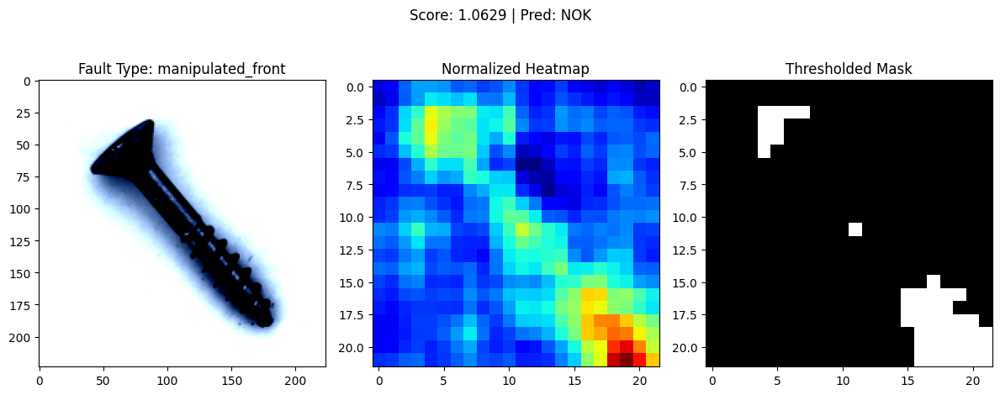


Processing: 023.png | Fault Type: manipulated_front
Anomaly Score: 0.1188
Heatmap stats -> min: 0.0524, max: 0.1291


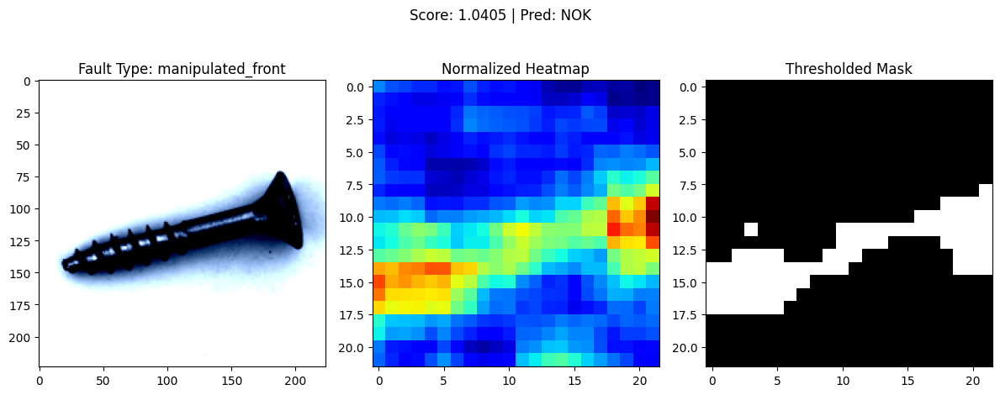


Processing: 009.png | Fault Type: manipulated_front
Anomaly Score: 0.1274
Heatmap stats -> min: 0.0590, max: 0.1342


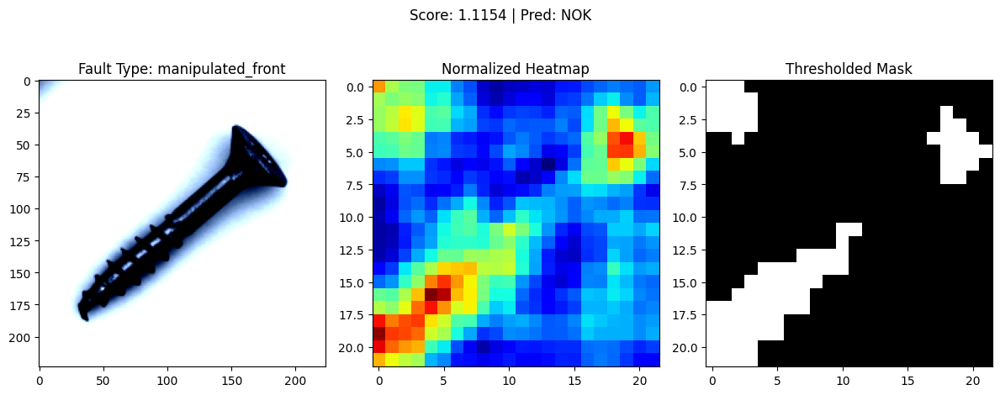


Processing: 003.png | Fault Type: manipulated_front
Anomaly Score: 0.1235
Heatmap stats -> min: 0.0551, max: 0.1415


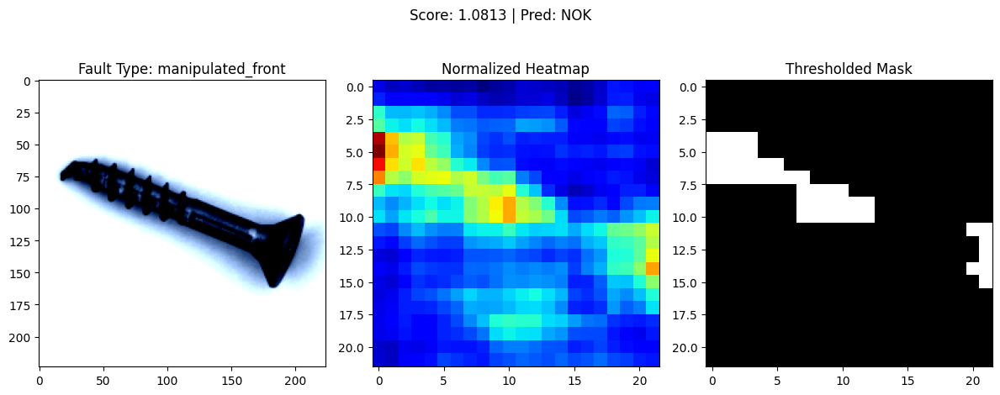


Processing: 019.png | Fault Type: manipulated_front
Anomaly Score: 0.1256
Heatmap stats -> min: 0.0540, max: 0.1381


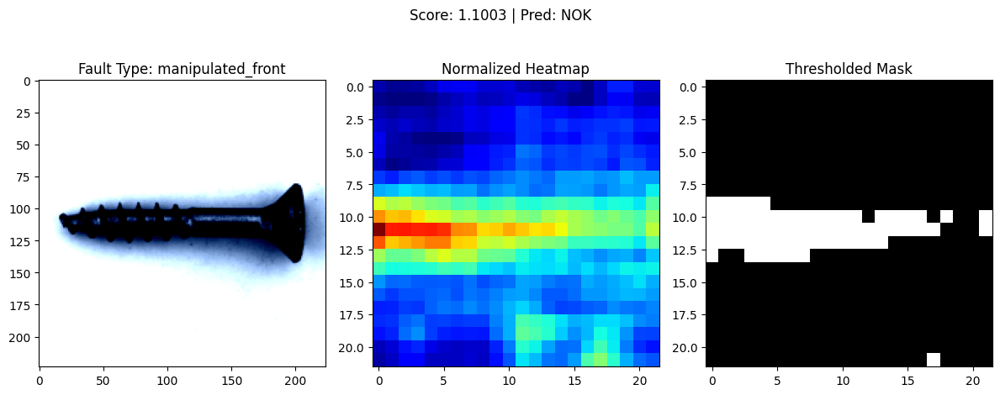


Processing: 000.png | Fault Type: manipulated_front
Anomaly Score: 0.1256
Heatmap stats -> min: 0.0594, max: 0.1291


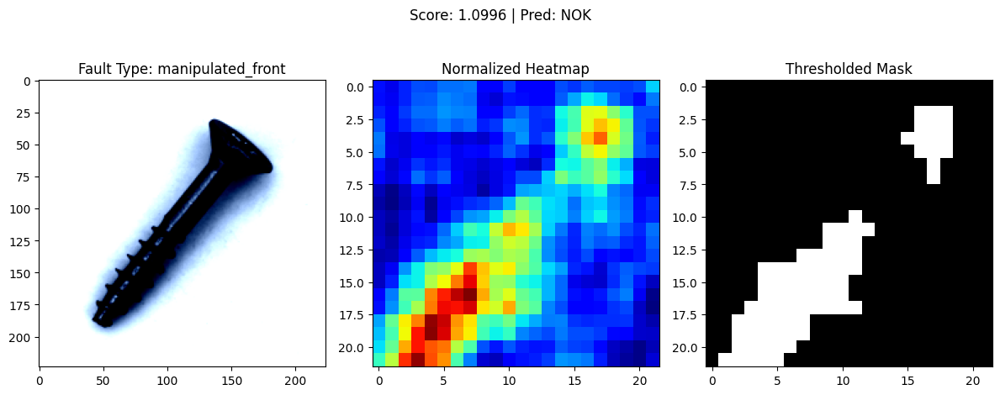


Processing: 015.png | Fault Type: manipulated_front
Anomaly Score: 0.1209
Heatmap stats -> min: 0.0548, max: 0.1325


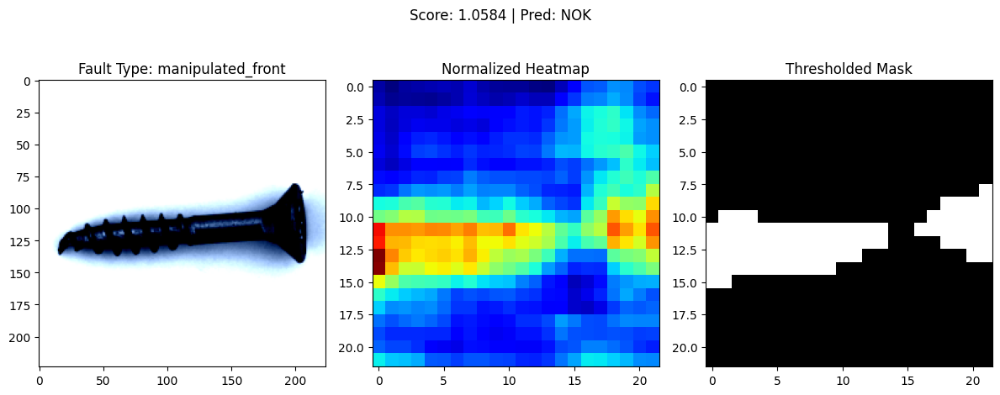


Processing: 005.png | Fault Type: manipulated_front
Anomaly Score: 0.1204
Heatmap stats -> min: 0.0539, max: 0.1349


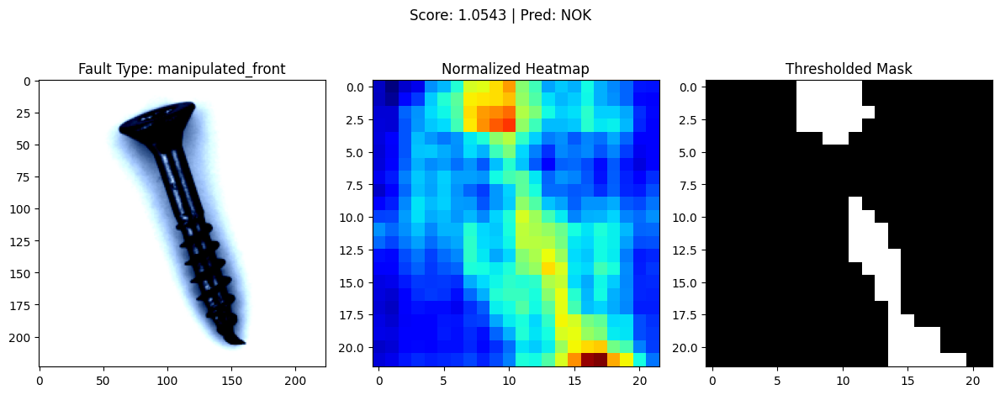


Processing: 006.png | Fault Type: manipulated_front
Anomaly Score: 0.1241
Heatmap stats -> min: 0.0529, max: 0.1274


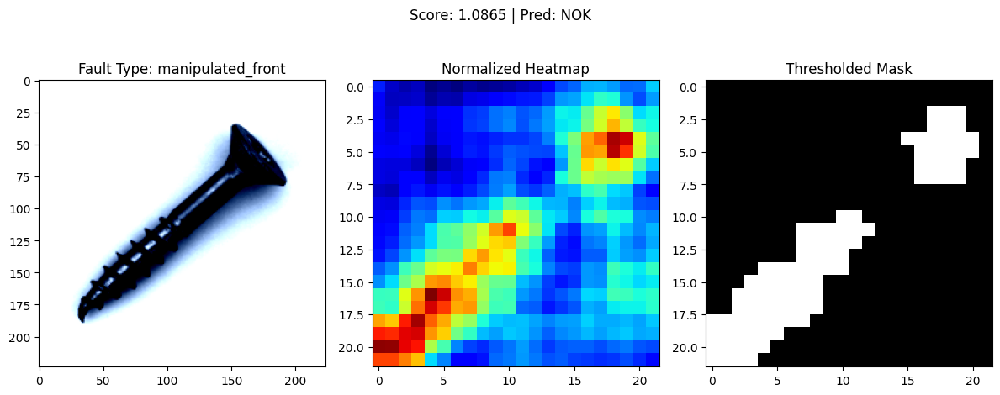


Processing: 017.png | Fault Type: manipulated_front
Anomaly Score: 0.1051
Heatmap stats -> min: 0.0513, max: 0.1107


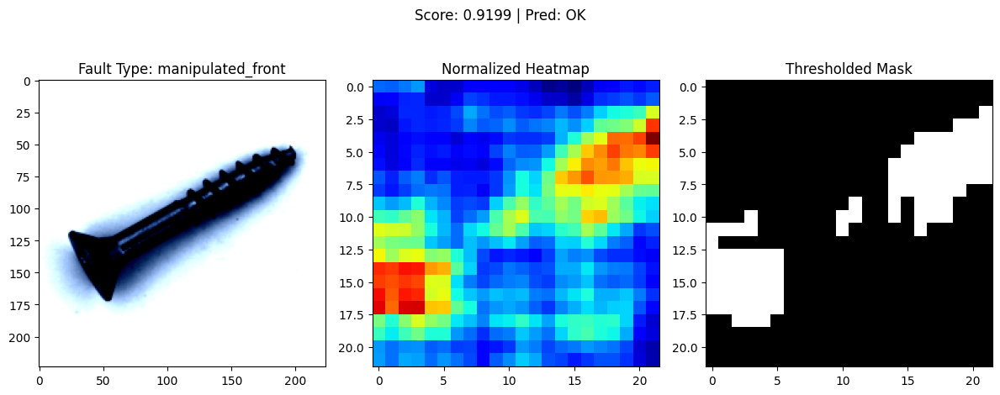


Processing: 020.png | Fault Type: manipulated_front
Anomaly Score: 0.1202
Heatmap stats -> min: 0.0527, max: 0.1335


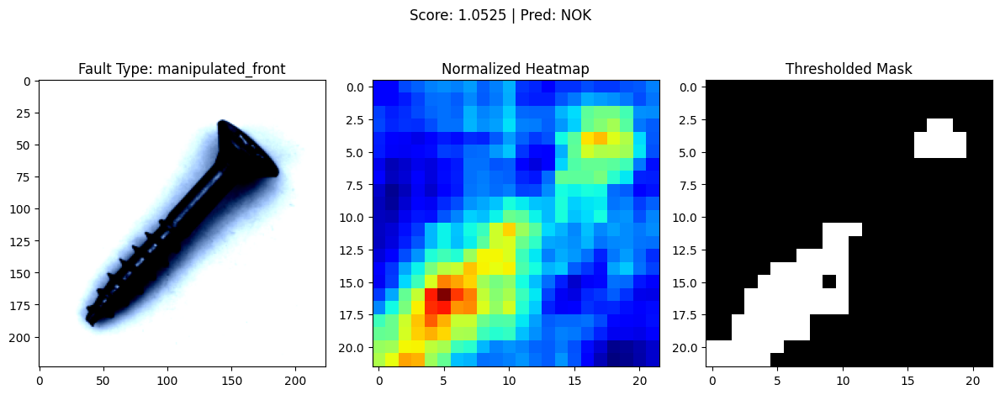


Processing: 012.png | Fault Type: manipulated_front
Anomaly Score: 0.1101
Heatmap stats -> min: 0.0585, max: 0.1187


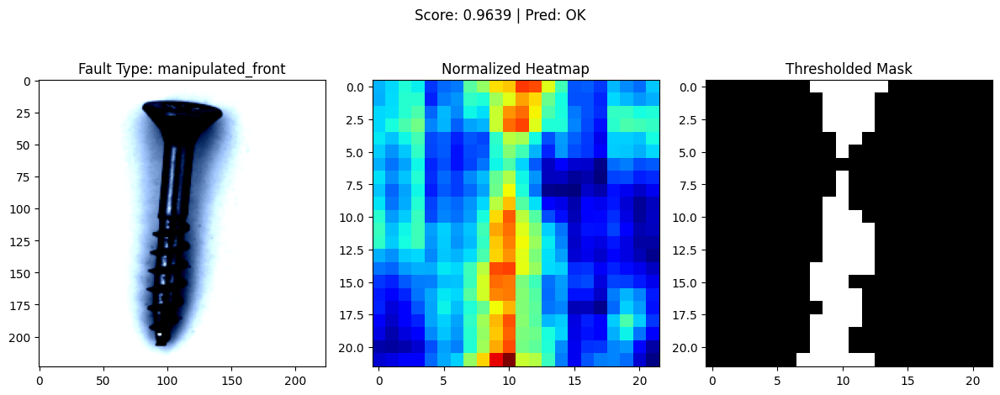


Processing: 008.png | Fault Type: scratch_head
Anomaly Score: 0.1165
Heatmap stats -> min: 0.0521, max: 0.1248


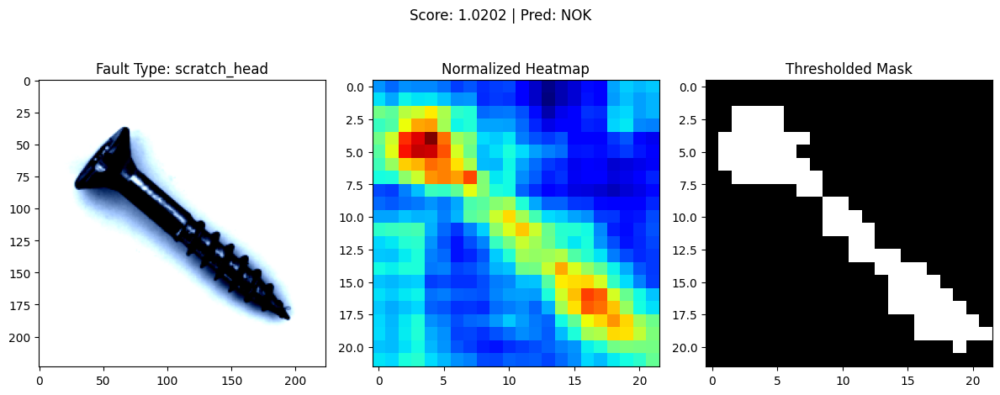


Processing: 004.png | Fault Type: scratch_head
Anomaly Score: 0.1256
Heatmap stats -> min: 0.0531, max: 0.1286


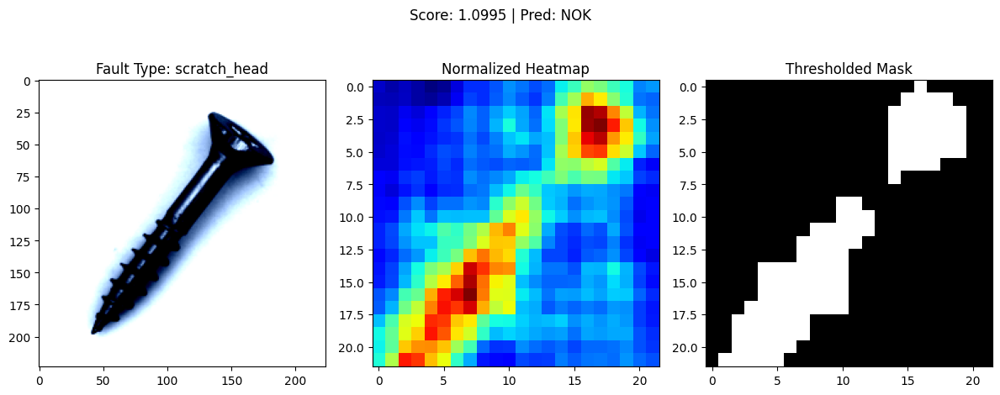


Processing: 014.png | Fault Type: scratch_head
Anomaly Score: 0.1264
Heatmap stats -> min: 0.0553, max: 0.1374


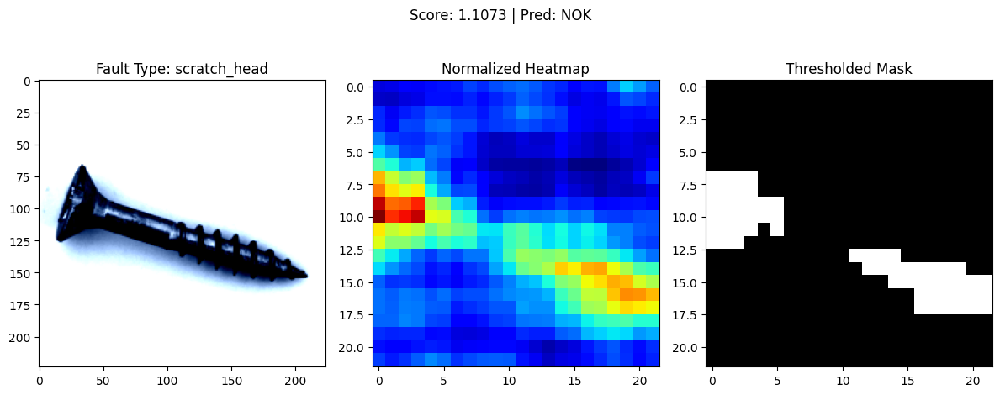


Processing: 016.png | Fault Type: scratch_head
Anomaly Score: 0.1187
Heatmap stats -> min: 0.0509, max: 0.1418


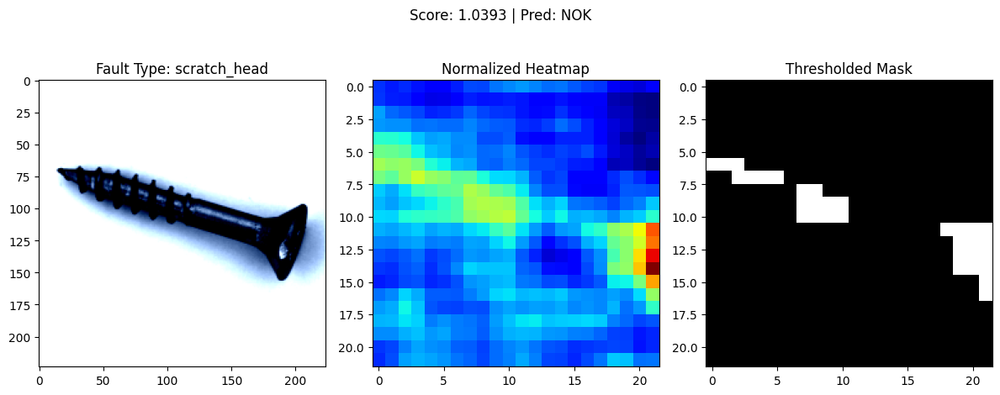


Processing: 013.png | Fault Type: scratch_head
Anomaly Score: 0.1443
Heatmap stats -> min: 0.0565, max: 0.1508


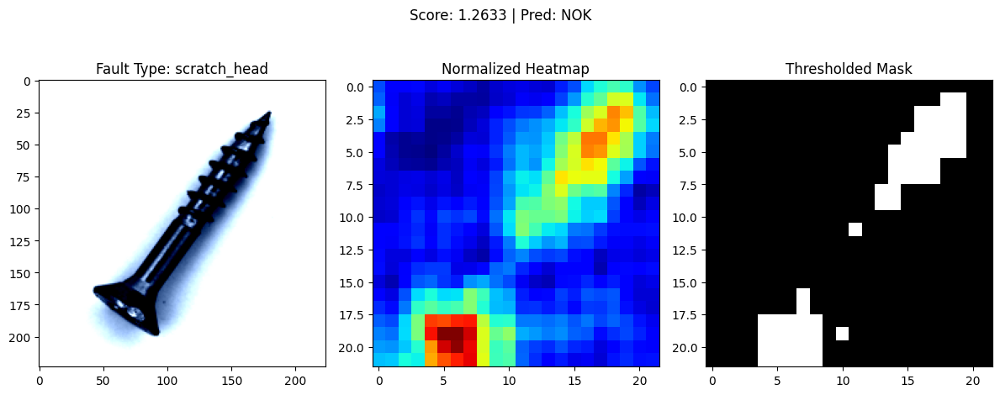


Processing: 007.png | Fault Type: scratch_head
Anomaly Score: 0.1301
Heatmap stats -> min: 0.0526, max: 0.1403


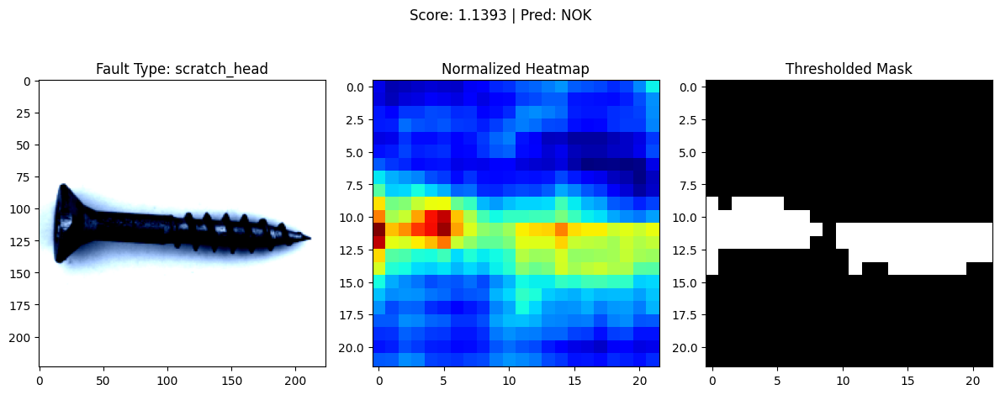


Processing: 011.png | Fault Type: scratch_head
Anomaly Score: 0.1591
Heatmap stats -> min: 0.0511, max: 0.1952


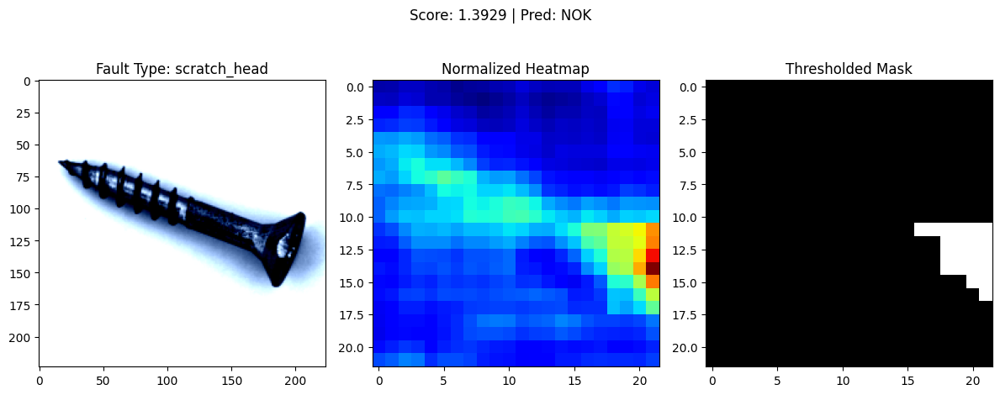


Processing: 022.png | Fault Type: scratch_head
Anomaly Score: 0.1229
Heatmap stats -> min: 0.0532, max: 0.1299


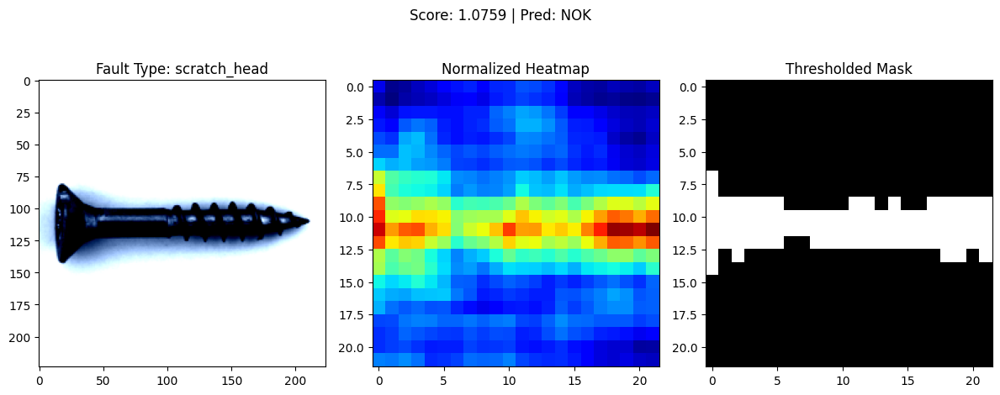


Processing: 021.png | Fault Type: scratch_head
Anomaly Score: 0.1167
Heatmap stats -> min: 0.0550, max: 0.1263


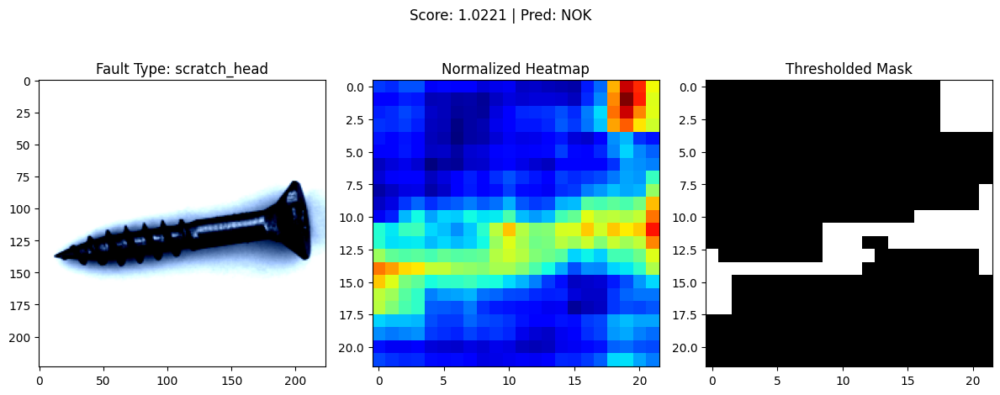


Processing: 010.png | Fault Type: scratch_head
Anomaly Score: 0.1292
Heatmap stats -> min: 0.0527, max: 0.1346


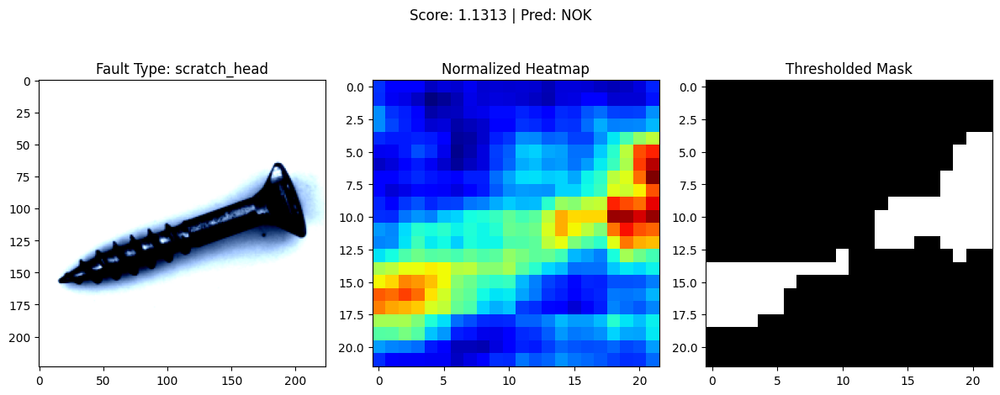


Processing: 002.png | Fault Type: scratch_head
Anomaly Score: 0.1251
Heatmap stats -> min: 0.0522, max: 0.1405


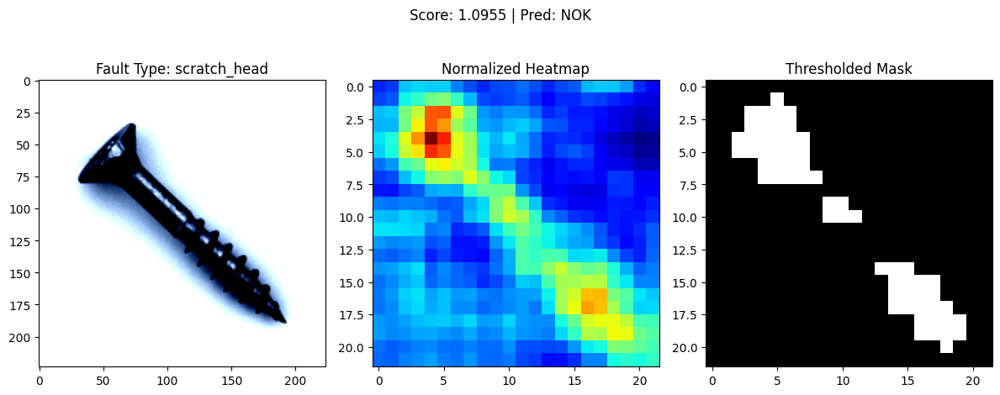


Processing: 018.png | Fault Type: scratch_head
Anomaly Score: 0.1165
Heatmap stats -> min: 0.0541, max: 0.1284


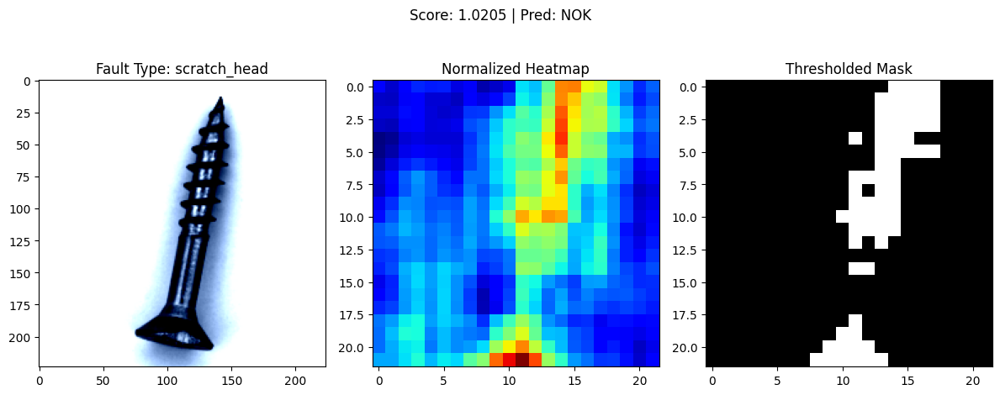


Processing: 001.png | Fault Type: scratch_head
Anomaly Score: 0.1246
Heatmap stats -> min: 0.0476, max: 0.1410


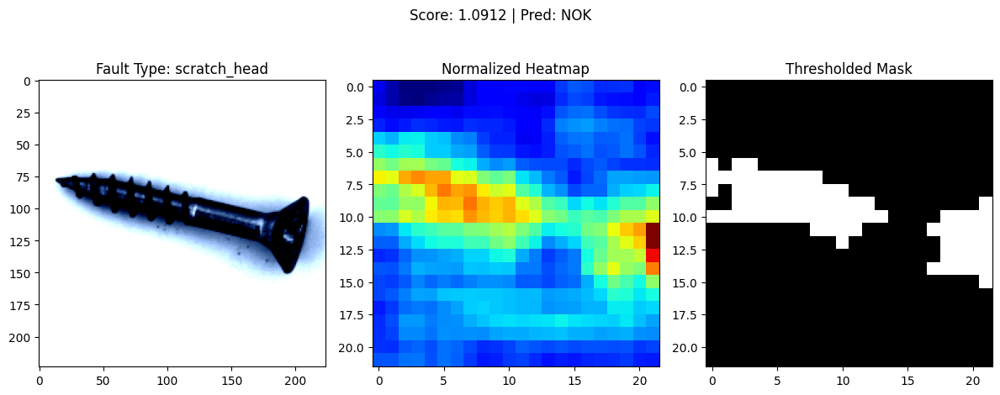


Processing: 023.png | Fault Type: scratch_head
Anomaly Score: 0.1358
Heatmap stats -> min: 0.0537, max: 0.1403


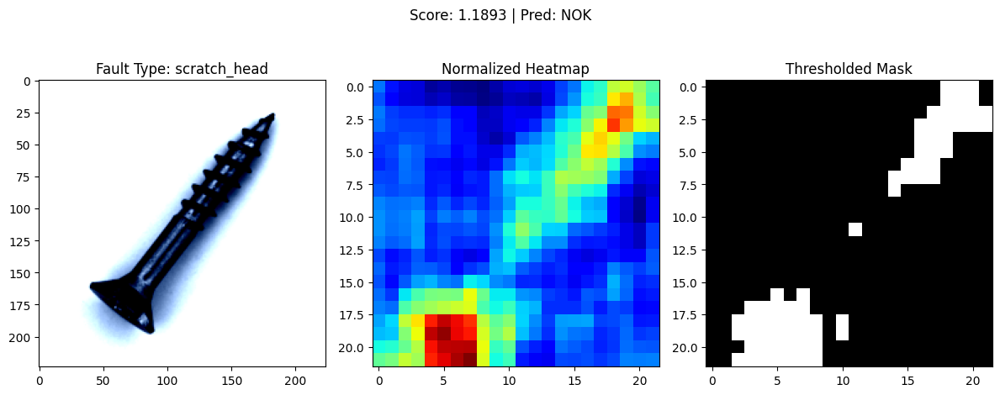


Processing: 009.png | Fault Type: scratch_head
Anomaly Score: 0.1162
Heatmap stats -> min: 0.0482, max: 0.1319


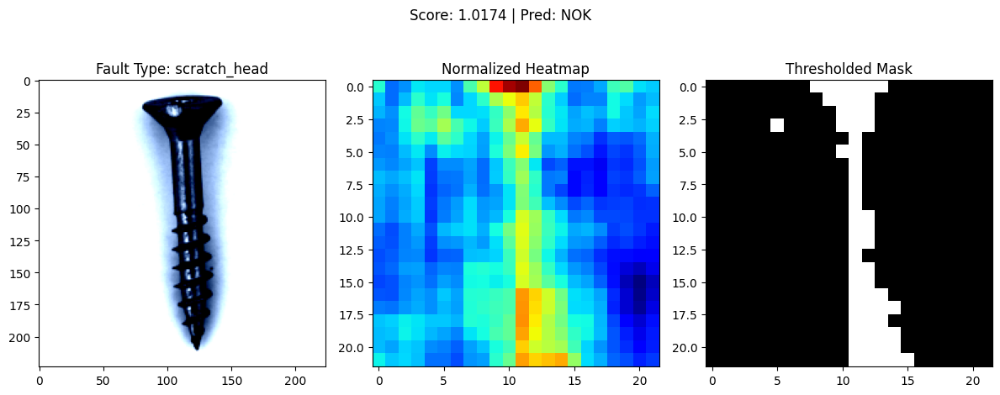


Processing: 003.png | Fault Type: scratch_head
Anomaly Score: 0.1262
Heatmap stats -> min: 0.0505, max: 0.1361


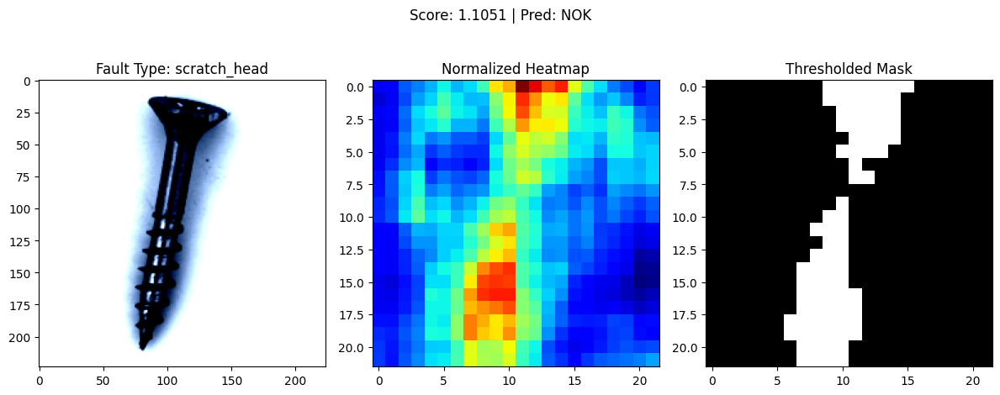


Processing: 019.png | Fault Type: scratch_head
Anomaly Score: 0.1501
Heatmap stats -> min: 0.0507, max: 0.1593


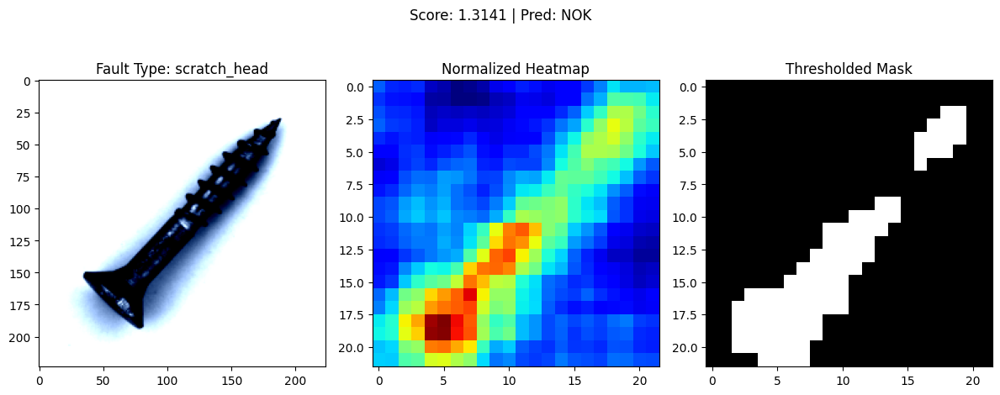


Processing: 000.png | Fault Type: scratch_head
Anomaly Score: 0.1264
Heatmap stats -> min: 0.0560, max: 0.1392


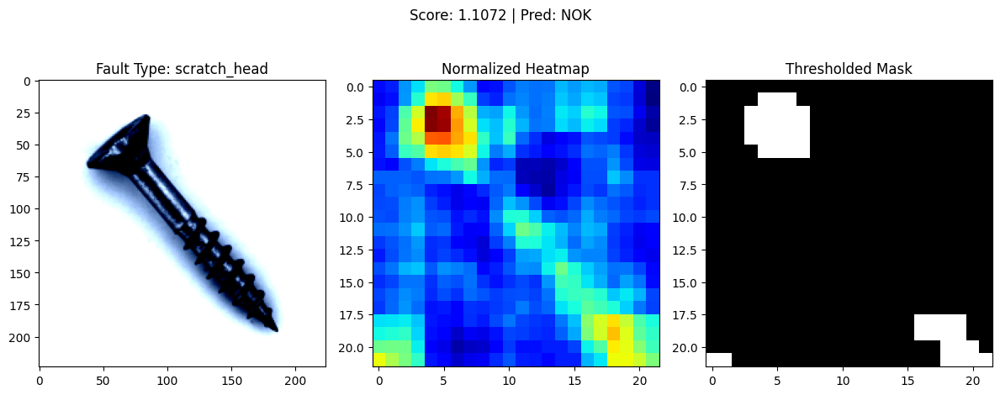


Processing: 015.png | Fault Type: scratch_head
Anomaly Score: 0.1582
Heatmap stats -> min: 0.0570, max: 0.1658


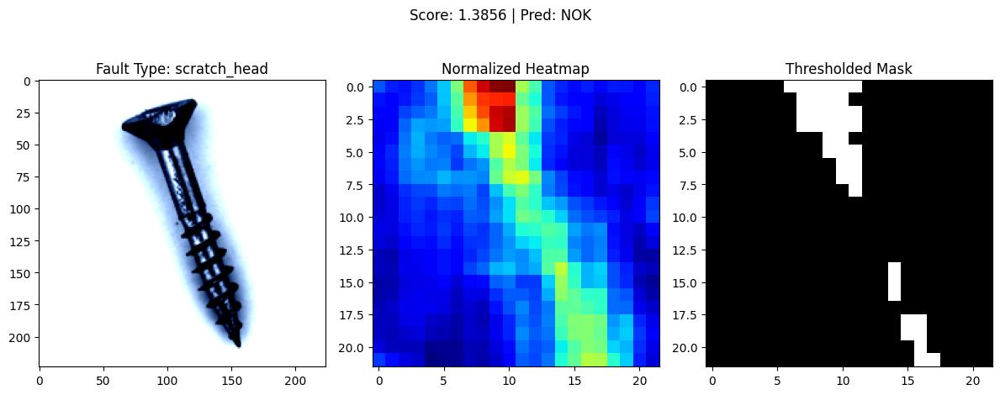


Processing: 005.png | Fault Type: scratch_head
Anomaly Score: 0.1145
Heatmap stats -> min: 0.0480, max: 0.1306


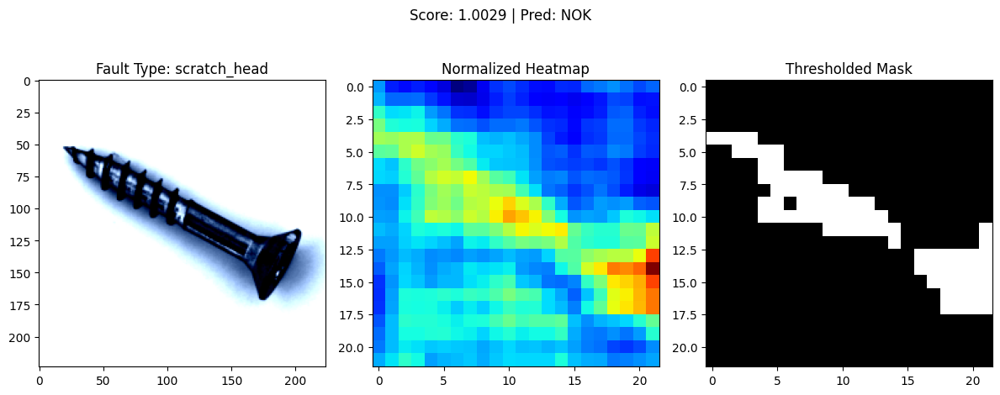


Processing: 006.png | Fault Type: scratch_head
Anomaly Score: 0.1230
Heatmap stats -> min: 0.0531, max: 0.1270


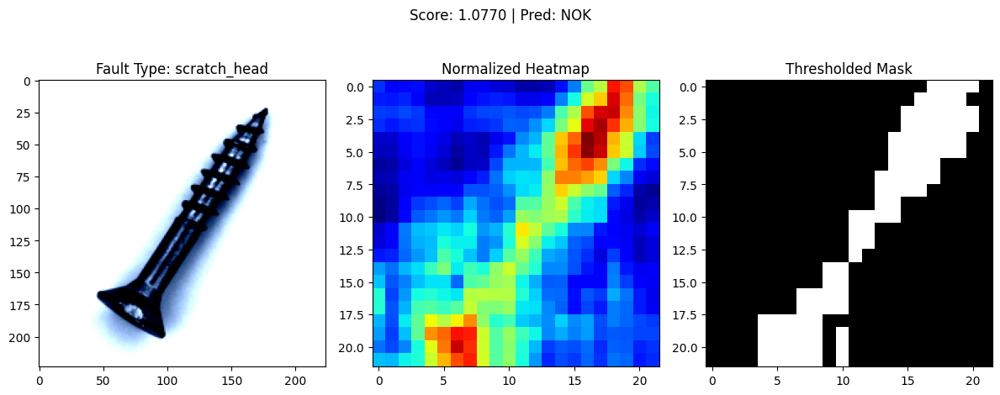


Processing: 017.png | Fault Type: scratch_head
Anomaly Score: 0.1220
Heatmap stats -> min: 0.0519, max: 0.1337


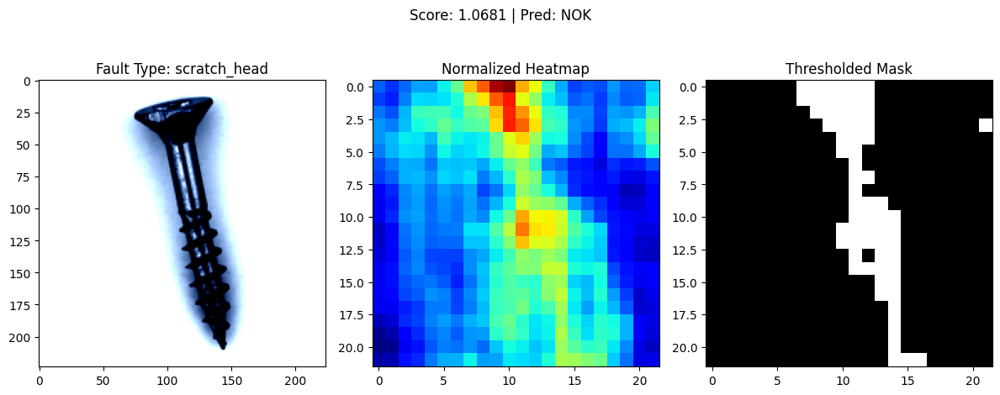


Processing: 020.png | Fault Type: scratch_head
Anomaly Score: 0.1293
Heatmap stats -> min: 0.0489, max: 0.1433


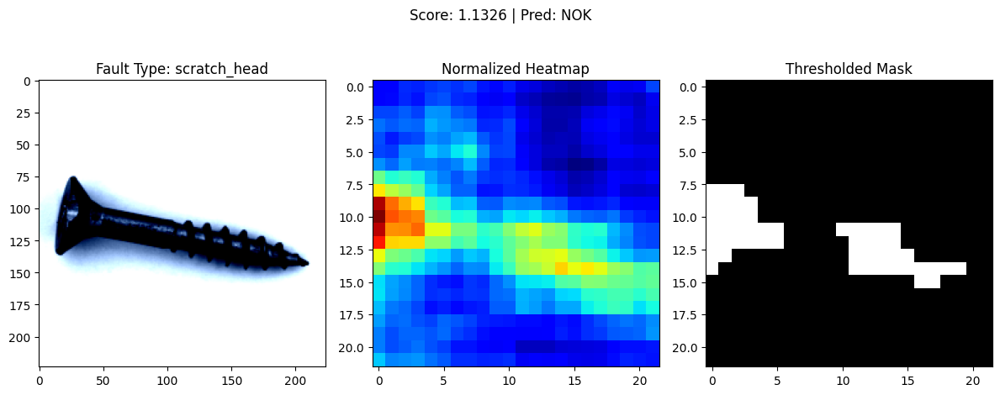


Processing: 012.png | Fault Type: scratch_head
Anomaly Score: 0.1389
Heatmap stats -> min: 0.0540, max: 0.1505


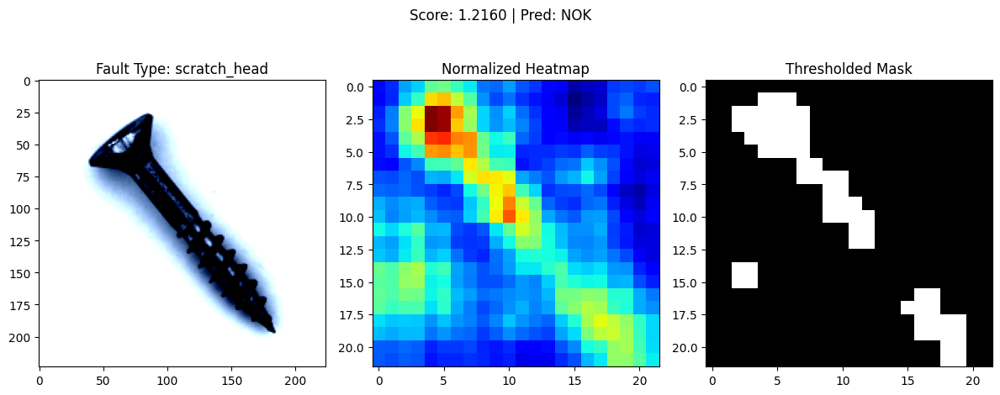


Processing: 029.png | Fault Type: good
Anomaly Score: 0.1099
Heatmap stats -> min: 0.0499, max: 0.1144


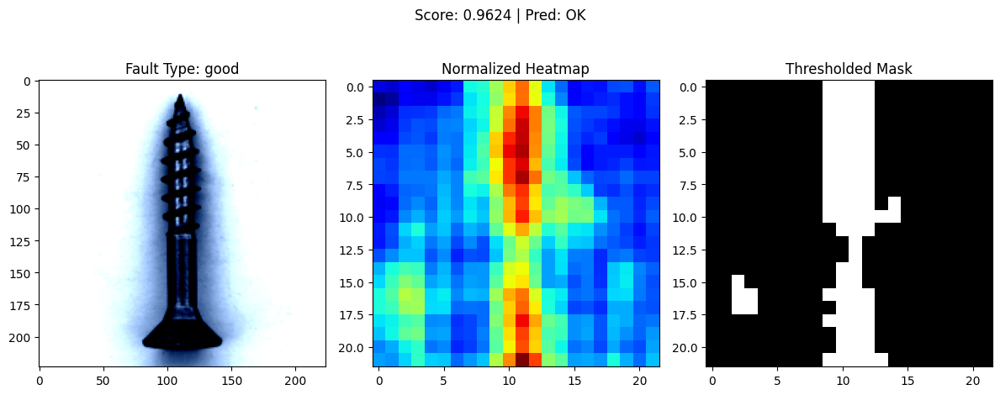


Processing: 008.png | Fault Type: good
Anomaly Score: 0.1147
Heatmap stats -> min: 0.0507, max: 0.1210


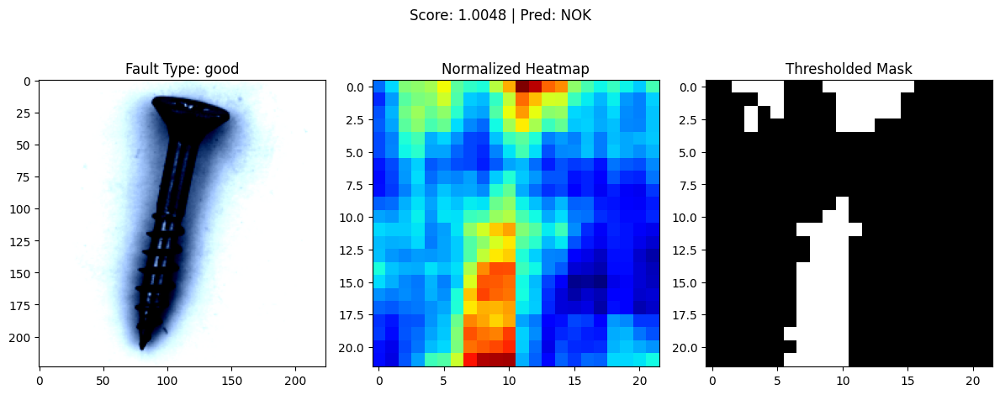


Processing: 004.png | Fault Type: good
Anomaly Score: 0.1041
Heatmap stats -> min: 0.0535, max: 0.1097


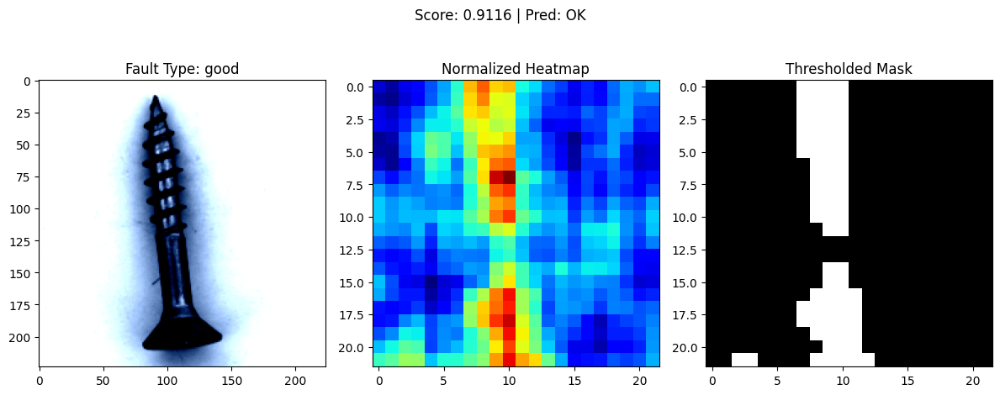


Processing: 014.png | Fault Type: good
Anomaly Score: 0.1280
Heatmap stats -> min: 0.0539, max: 0.1404


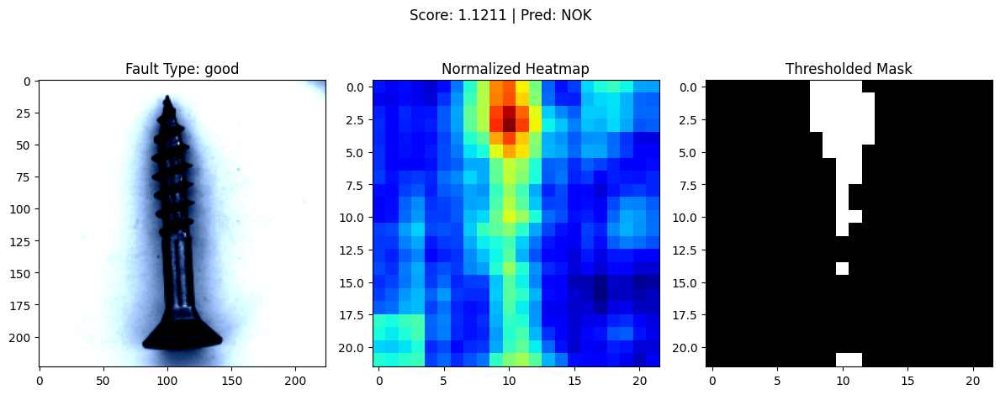


Processing: 016.png | Fault Type: good
Anomaly Score: 0.1100
Heatmap stats -> min: 0.0509, max: 0.1281


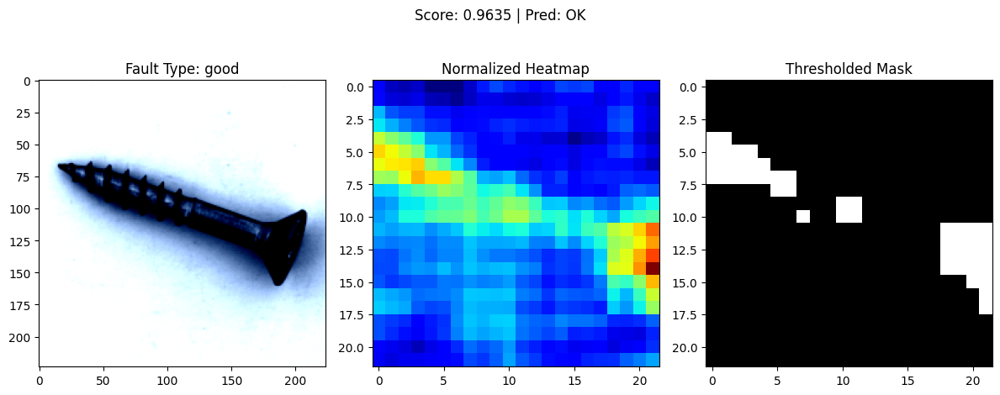


Processing: 028.png | Fault Type: good
Anomaly Score: 0.1133
Heatmap stats -> min: 0.0483, max: 0.1255


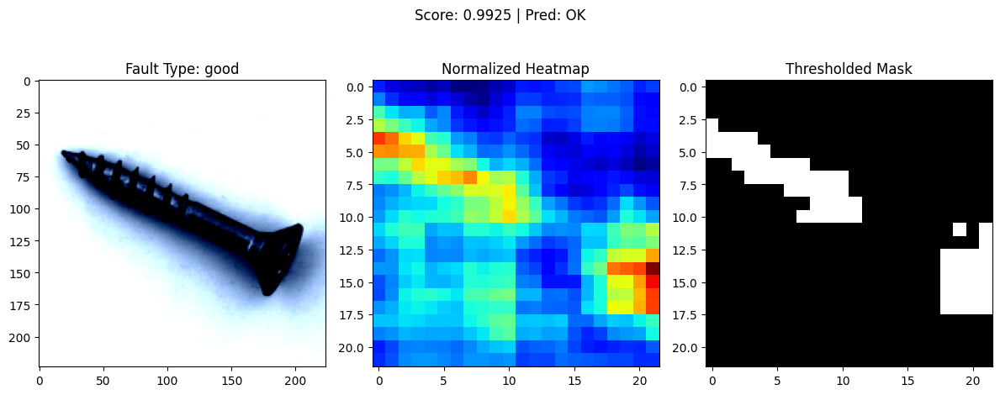


Processing: 013.png | Fault Type: good
Anomaly Score: 0.1208
Heatmap stats -> min: 0.0466, max: 0.1304


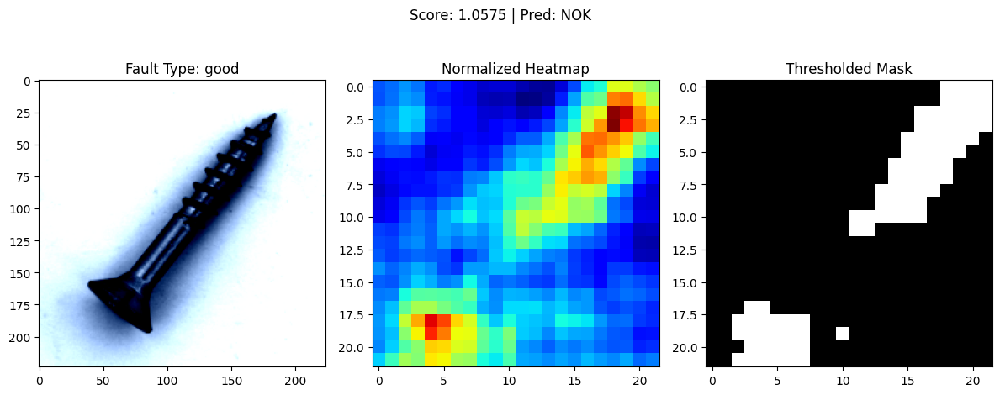


Processing: 007.png | Fault Type: good
Anomaly Score: 0.1144
Heatmap stats -> min: 0.0459, max: 0.1180


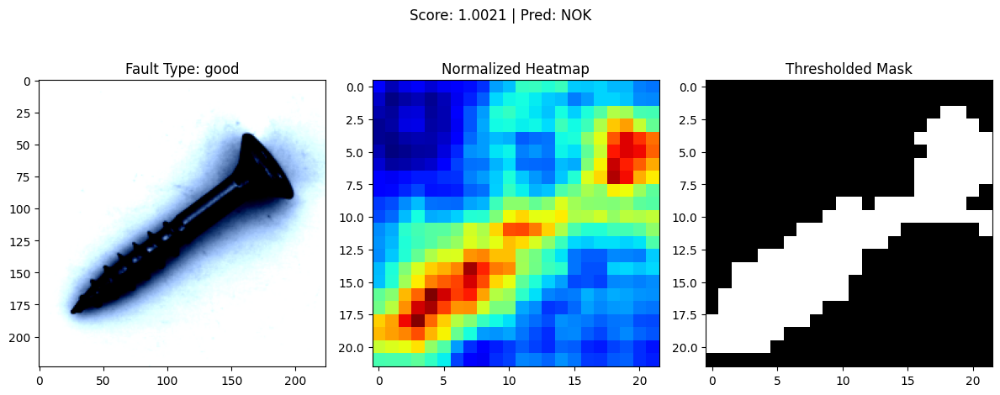


Processing: 011.png | Fault Type: good
Anomaly Score: 0.1130
Heatmap stats -> min: 0.0483, max: 0.1243


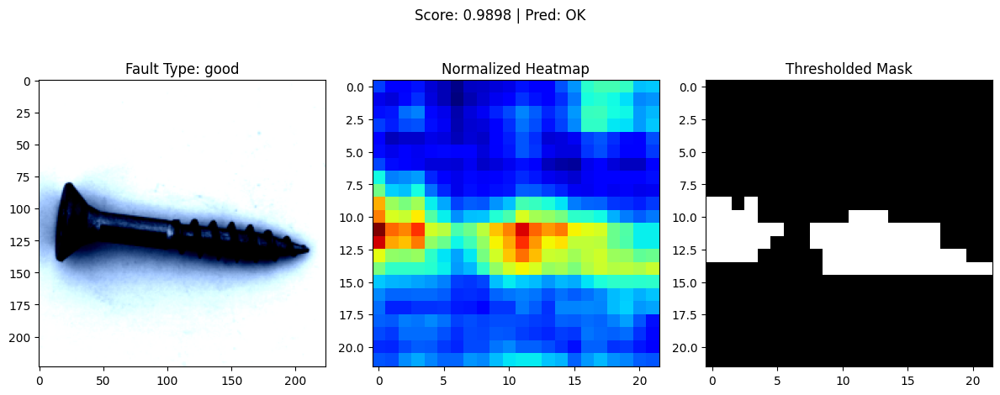


Processing: 036.png | Fault Type: good
Anomaly Score: 0.1084
Heatmap stats -> min: 0.0494, max: 0.1163


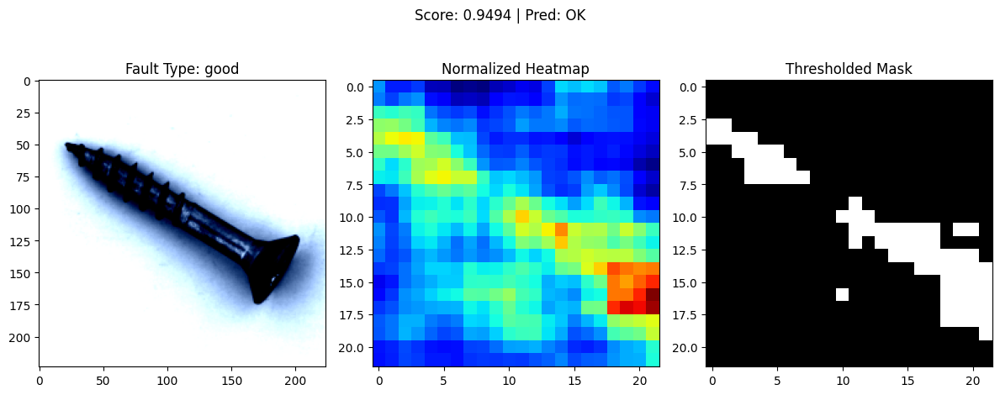


Processing: 022.png | Fault Type: good
Anomaly Score: 0.1104
Heatmap stats -> min: 0.0503, max: 0.1222


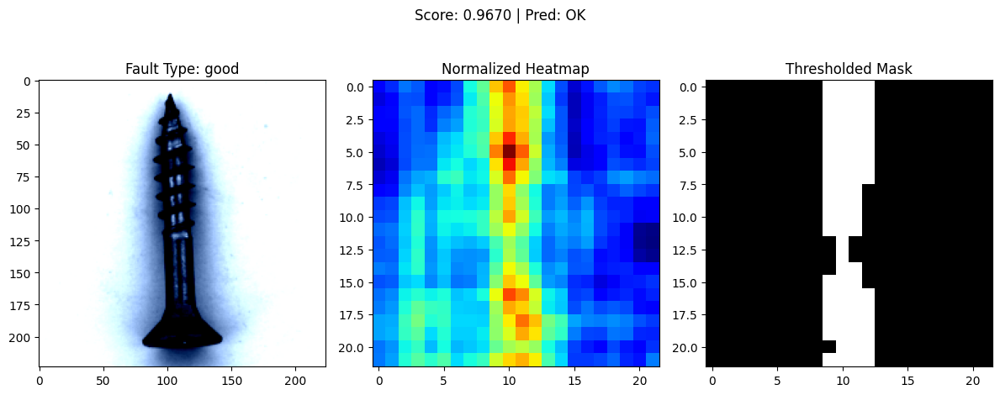


Processing: 032.png | Fault Type: good
Anomaly Score: 0.1179
Heatmap stats -> min: 0.0506, max: 0.1225


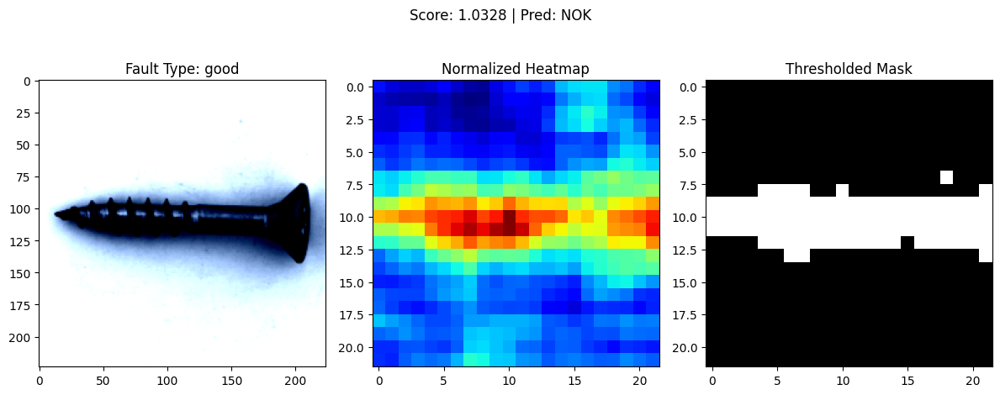


Processing: 021.png | Fault Type: good
Anomaly Score: 0.1082
Heatmap stats -> min: 0.0514, max: 0.1142


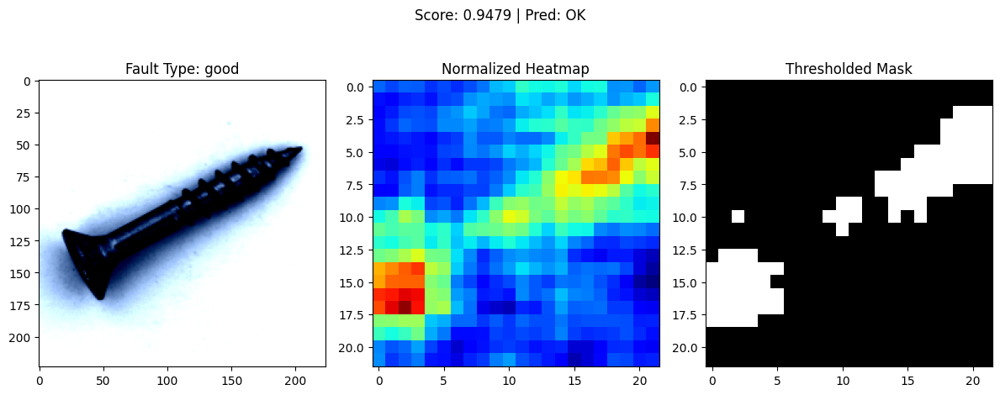


Processing: 010.png | Fault Type: good
Anomaly Score: 0.1164
Heatmap stats -> min: 0.0511, max: 0.1344


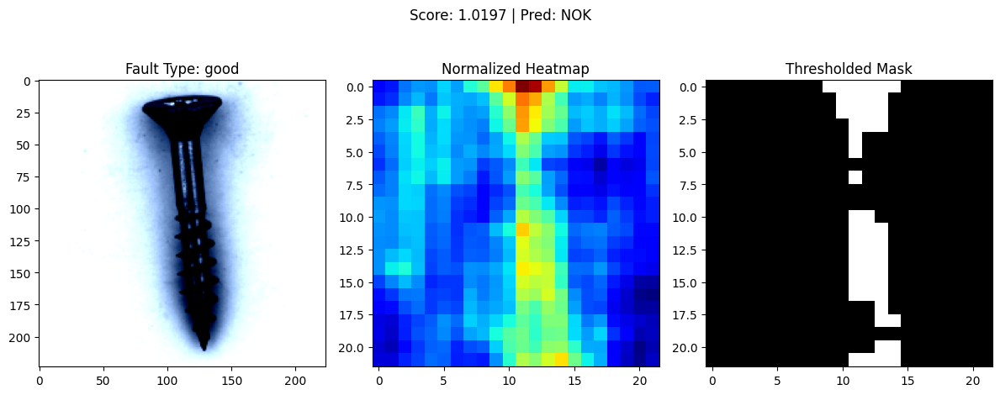


Processing: 002.png | Fault Type: good
Anomaly Score: 0.1186
Heatmap stats -> min: 0.0492, max: 0.1262


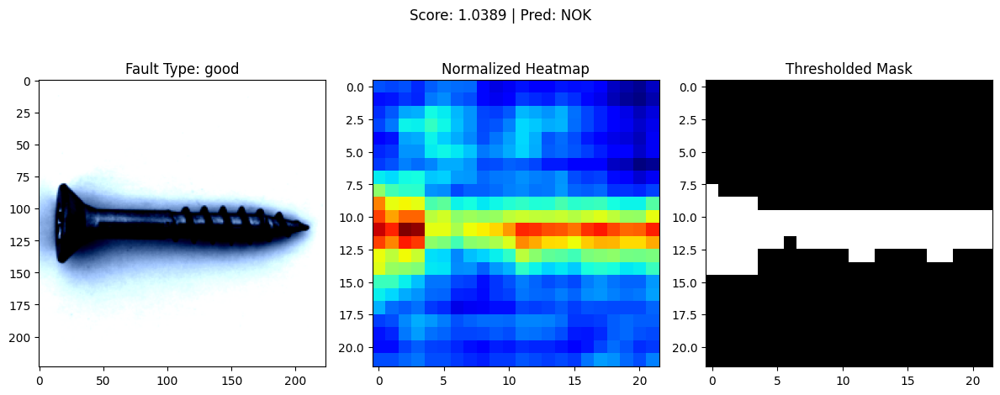


Processing: 018.png | Fault Type: good
Anomaly Score: 0.1182
Heatmap stats -> min: 0.0530, max: 0.1279


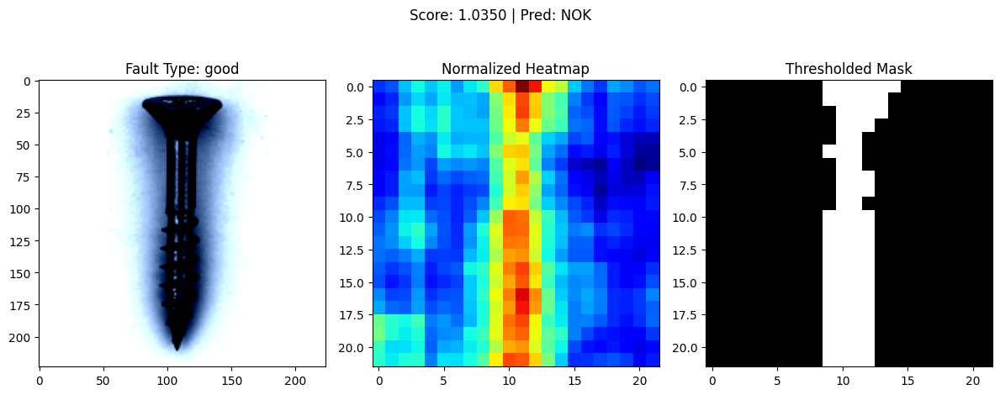


Processing: 031.png | Fault Type: good
Anomaly Score: 0.1170
Heatmap stats -> min: 0.0562, max: 0.1297


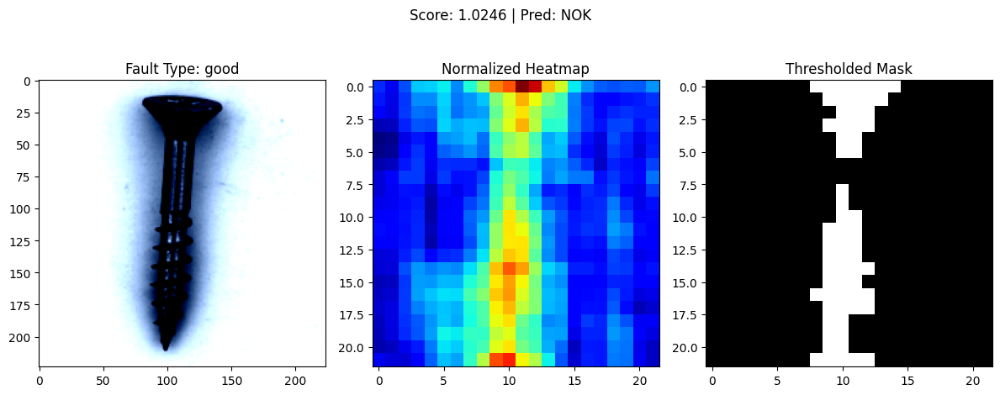


Processing: 001.png | Fault Type: good
Anomaly Score: 0.1198
Heatmap stats -> min: 0.0473, max: 0.1356


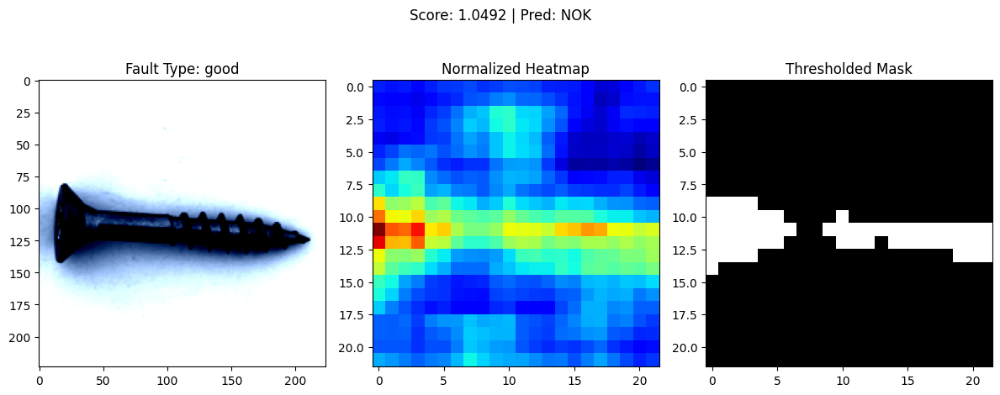


Processing: 034.png | Fault Type: good
Anomaly Score: 0.1073
Heatmap stats -> min: 0.0477, max: 0.1090


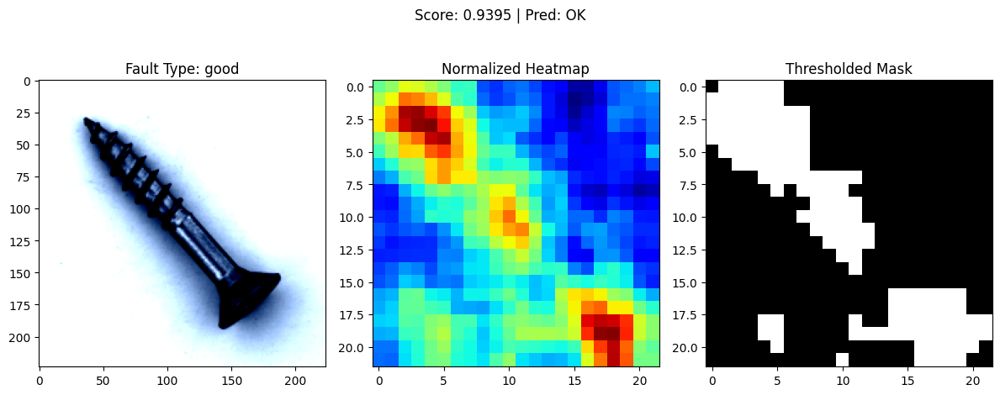


Processing: 023.png | Fault Type: good
Anomaly Score: 0.1226
Heatmap stats -> min: 0.0483, max: 0.1309


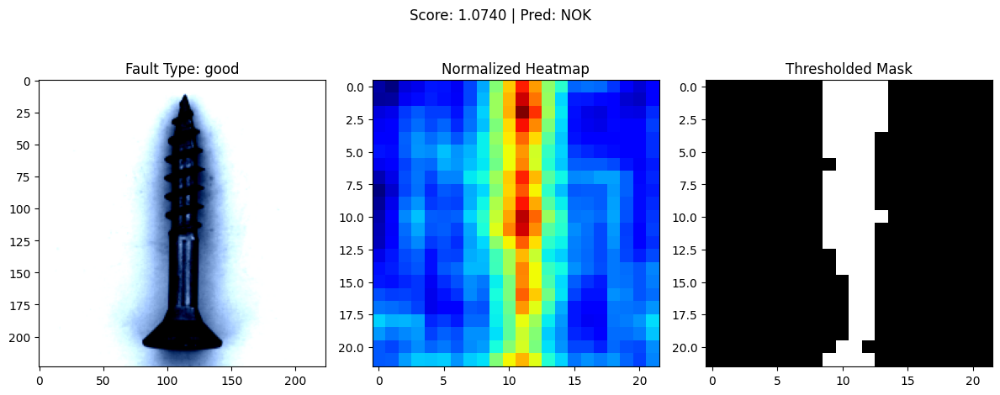


Processing: 009.png | Fault Type: good
Anomaly Score: 0.1105
Heatmap stats -> min: 0.0501, max: 0.1154


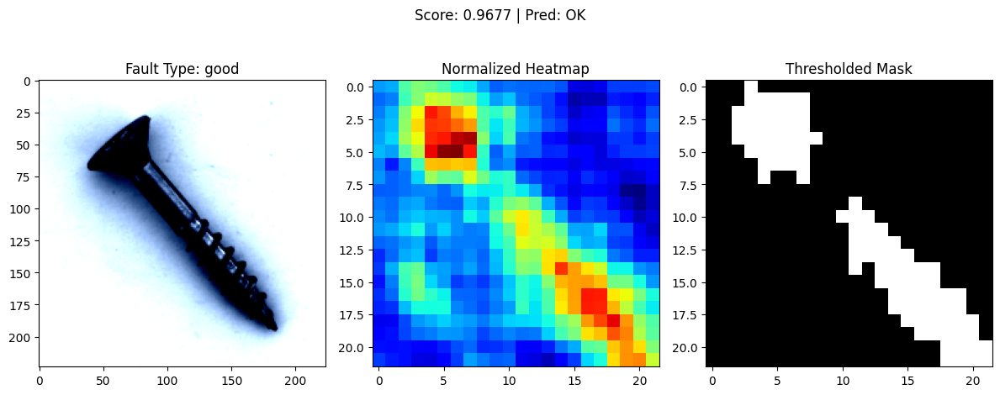


Processing: 003.png | Fault Type: good
Anomaly Score: 0.1220
Heatmap stats -> min: 0.0540, max: 0.1315


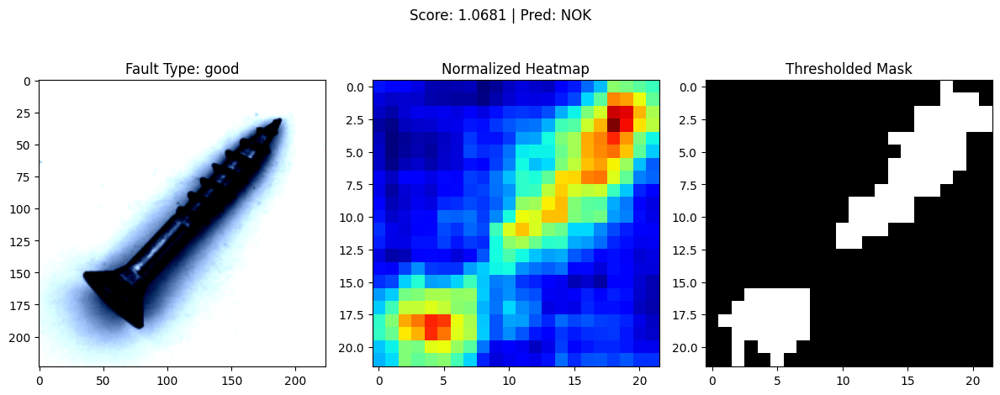


Processing: 019.png | Fault Type: good
Anomaly Score: 0.1208
Heatmap stats -> min: 0.0524, max: 0.1299


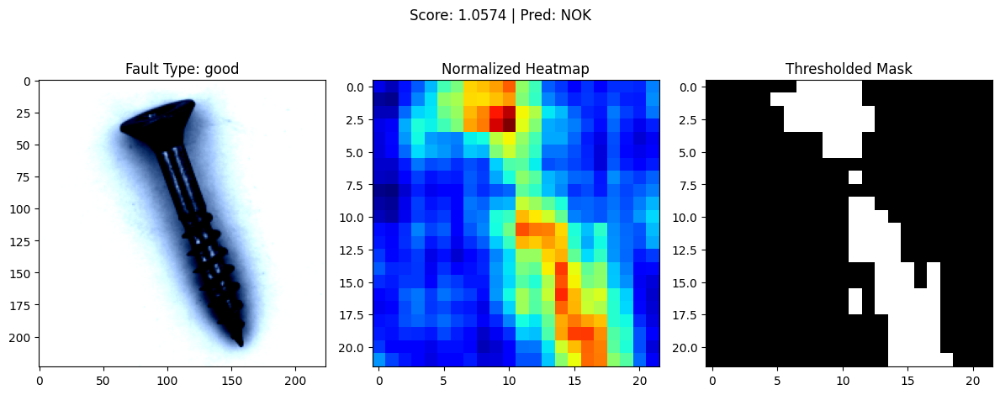


Processing: 040.png | Fault Type: good
Anomaly Score: 0.0986
Heatmap stats -> min: 0.0505, max: 0.1010


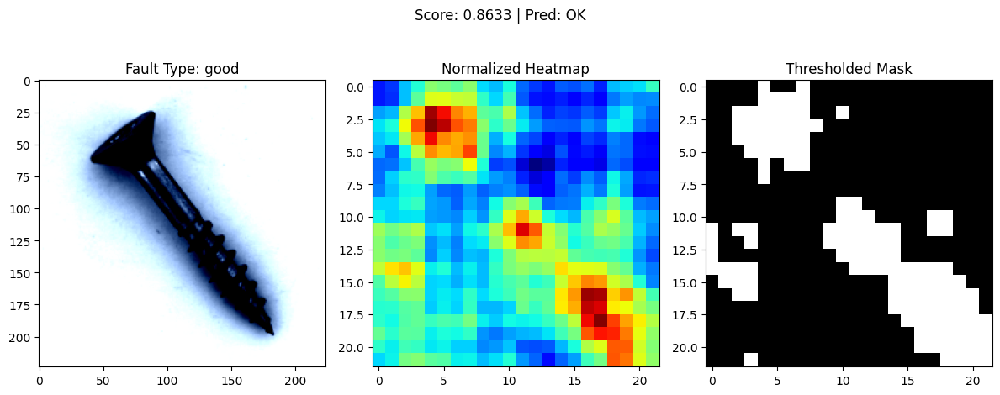


Processing: 000.png | Fault Type: good
Anomaly Score: 0.1050
Heatmap stats -> min: 0.0526, max: 0.1132


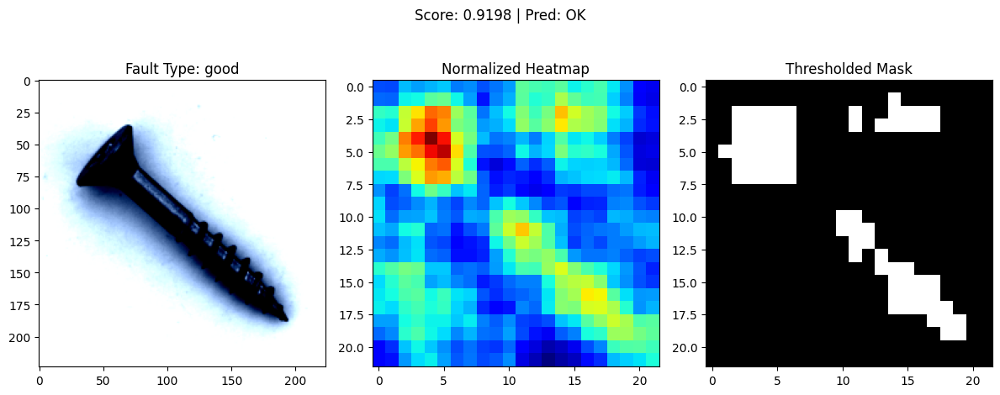


Processing: 037.png | Fault Type: good
Anomaly Score: 0.1101
Heatmap stats -> min: 0.0483, max: 0.1173


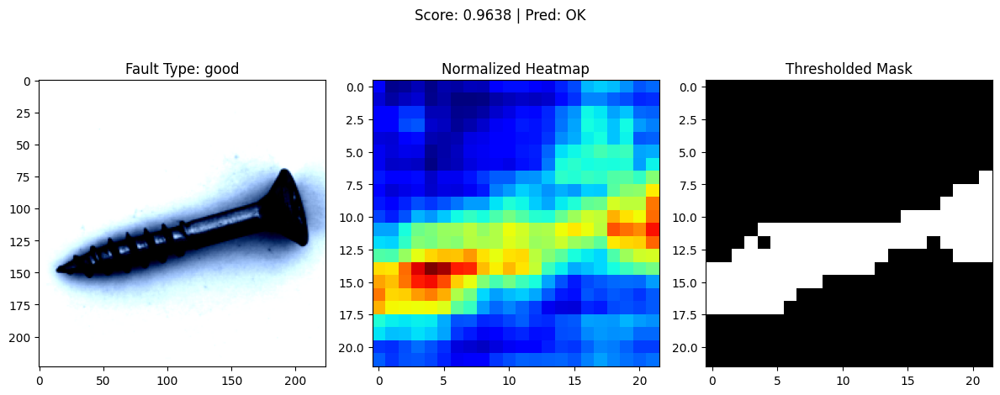


Processing: 025.png | Fault Type: good
Anomaly Score: 0.1078
Heatmap stats -> min: 0.0525, max: 0.1141


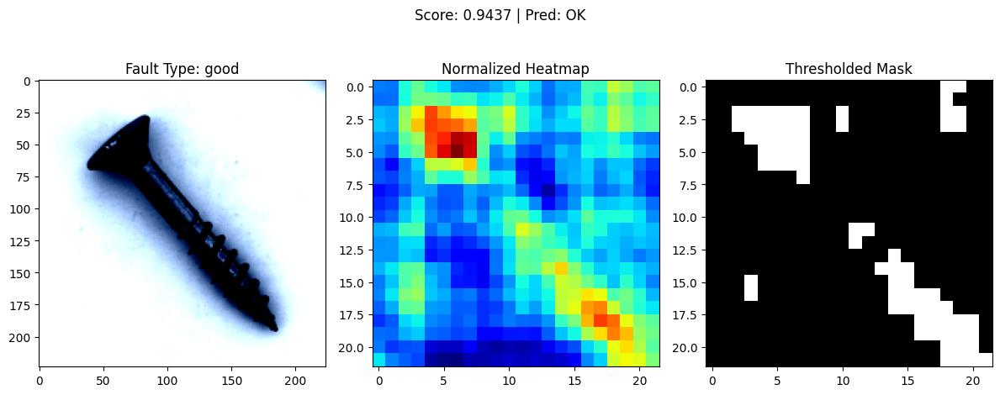


Processing: 015.png | Fault Type: good
Anomaly Score: 0.1256
Heatmap stats -> min: 0.0497, max: 0.1344


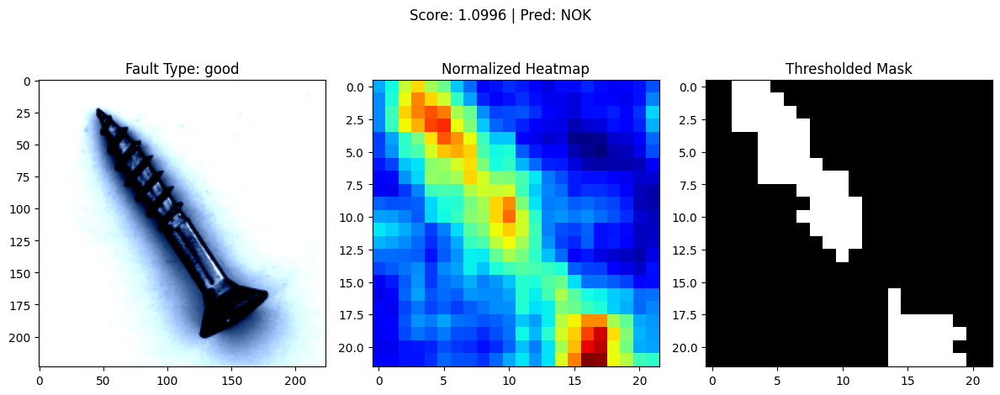


Processing: 033.png | Fault Type: good
Anomaly Score: 0.1103
Heatmap stats -> min: 0.0545, max: 0.1204


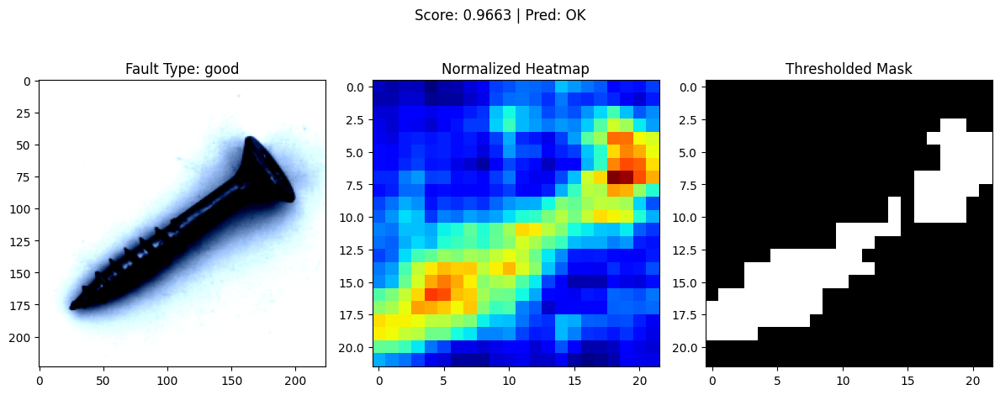


Processing: 035.png | Fault Type: good
Anomaly Score: 0.1205
Heatmap stats -> min: 0.0507, max: 0.1275


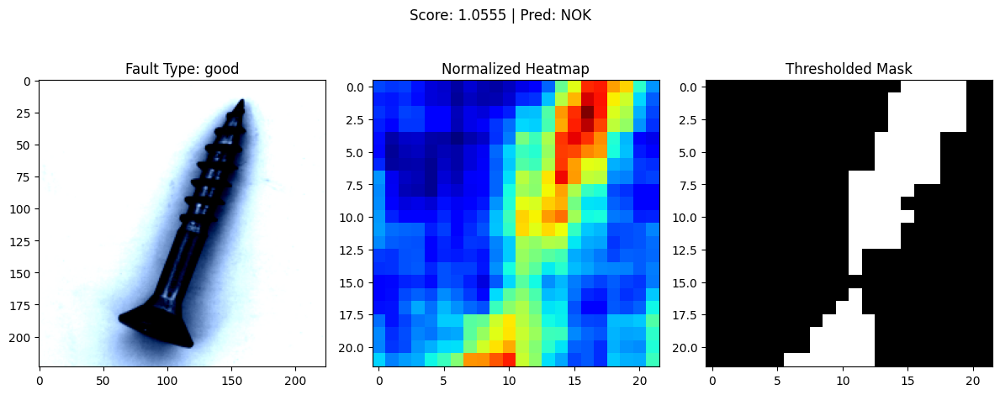


Processing: 005.png | Fault Type: good
Anomaly Score: 0.1120
Heatmap stats -> min: 0.0535, max: 0.1149


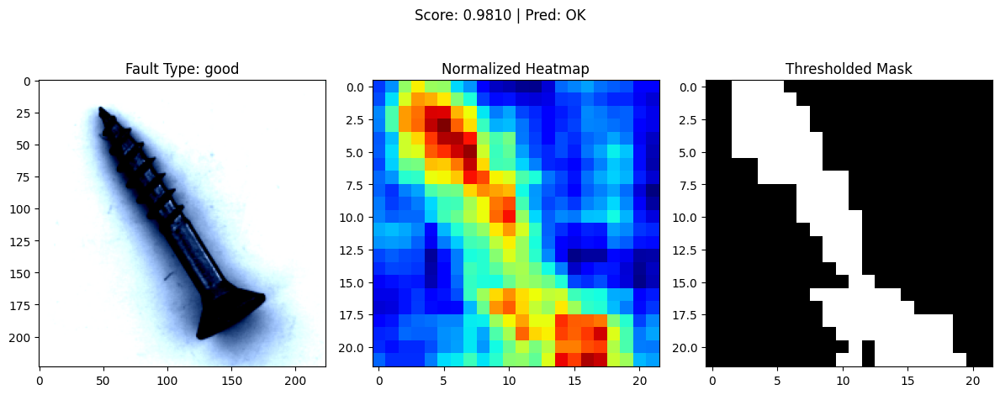


Processing: 030.png | Fault Type: good
Anomaly Score: 0.1239
Heatmap stats -> min: 0.0495, max: 0.1330


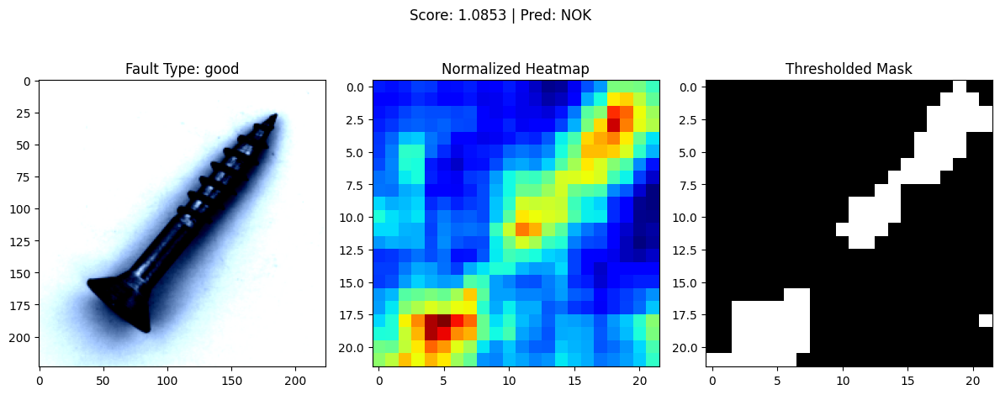


Processing: 038.png | Fault Type: good
Anomaly Score: 0.1286
Heatmap stats -> min: 0.0509, max: 0.1382


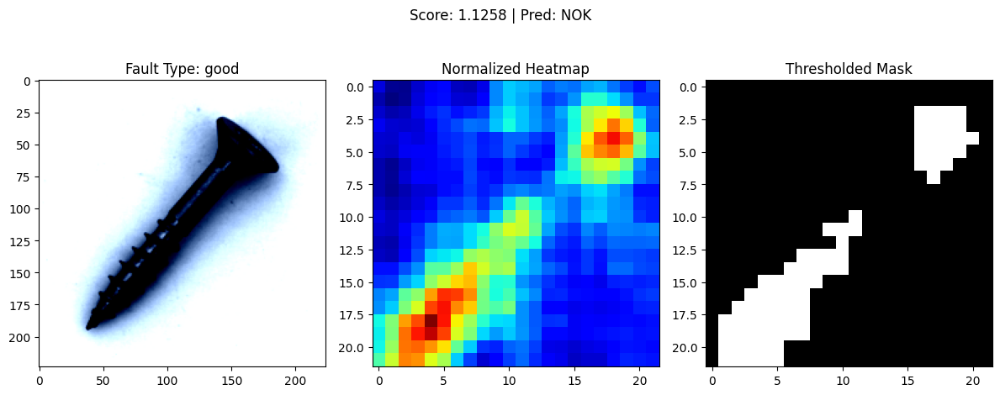


Processing: 027.png | Fault Type: good
Anomaly Score: 0.1103
Heatmap stats -> min: 0.0499, max: 0.1179


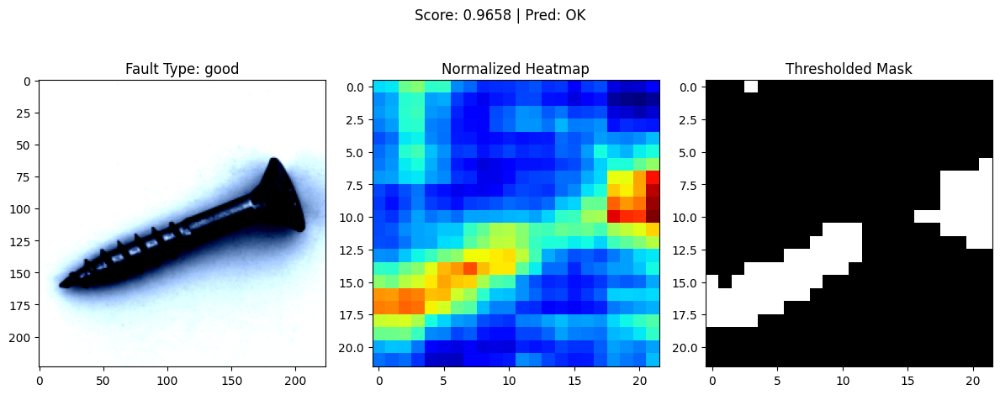


Processing: 006.png | Fault Type: good
Anomaly Score: 0.1152
Heatmap stats -> min: 0.0498, max: 0.1231


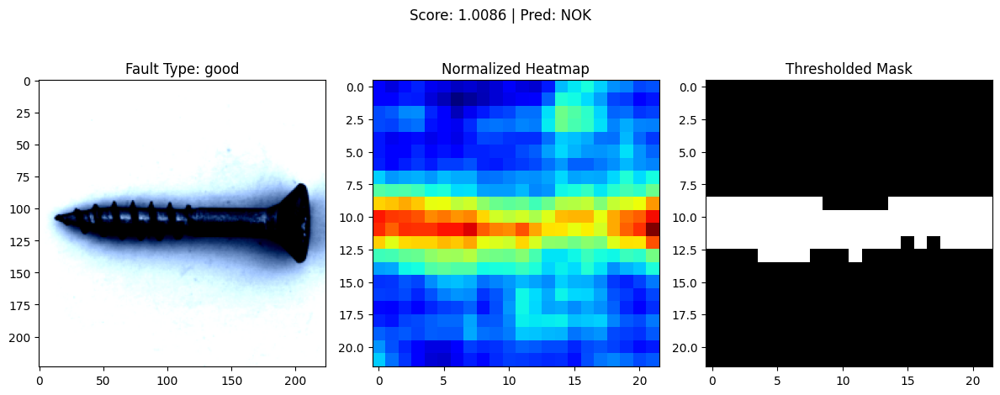


Processing: 039.png | Fault Type: good
Anomaly Score: 0.1065
Heatmap stats -> min: 0.0510, max: 0.1115


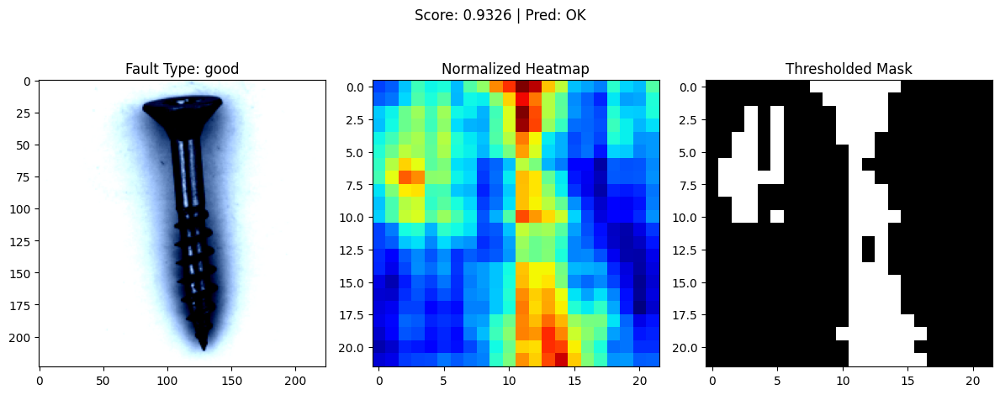


Processing: 017.png | Fault Type: good
Anomaly Score: 0.1178
Heatmap stats -> min: 0.0514, max: 0.1330


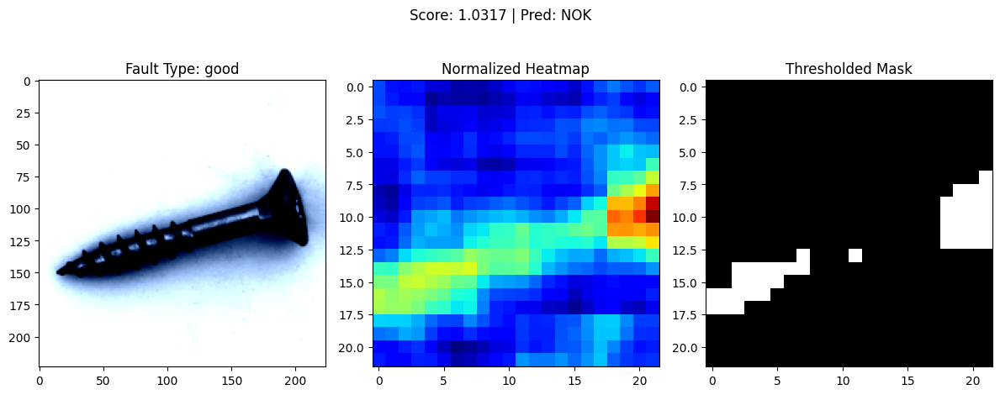


Processing: 024.png | Fault Type: good
Anomaly Score: 0.1280
Heatmap stats -> min: 0.0499, max: 0.1486


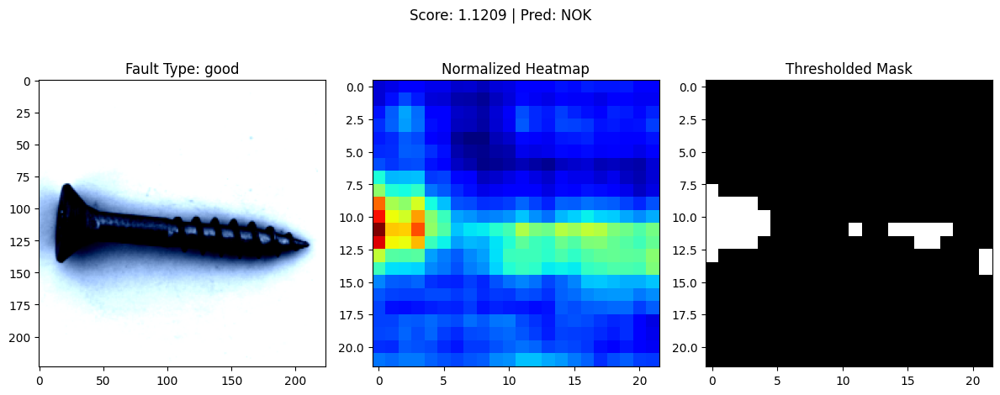


Processing: 020.png | Fault Type: good
Anomaly Score: 0.1038
Heatmap stats -> min: 0.0501, max: 0.1100


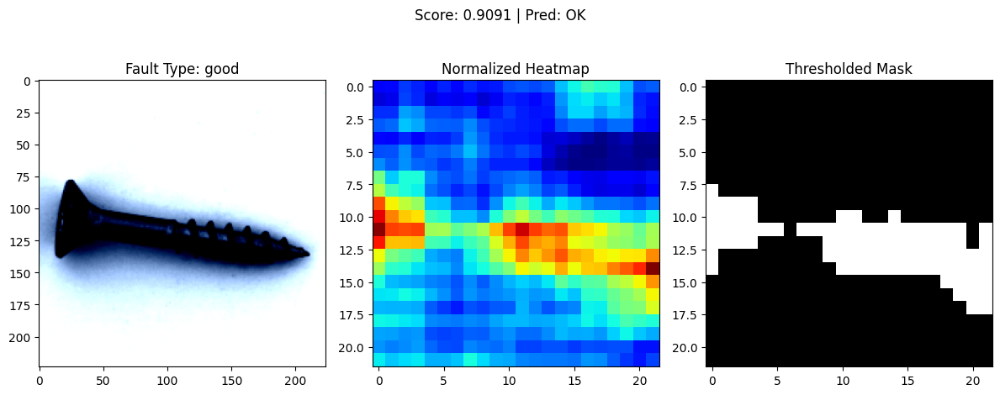


Processing: 012.png | Fault Type: good
Anomaly Score: 0.1227
Heatmap stats -> min: 0.0507, max: 0.1369


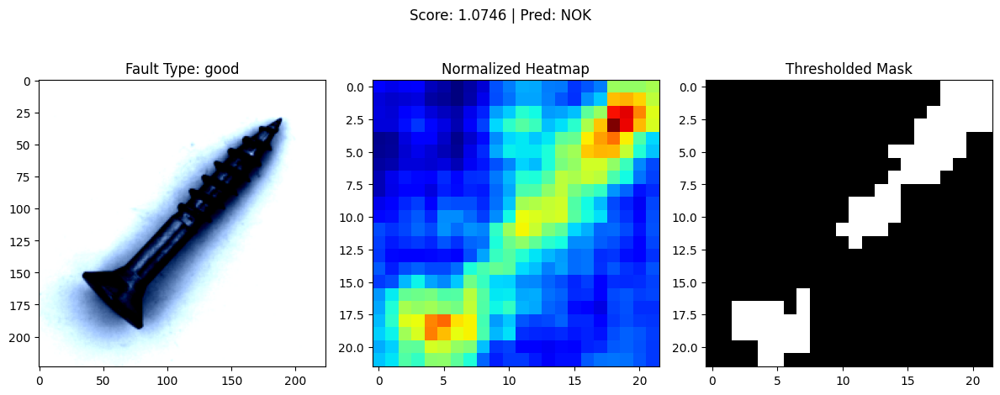


Processing: 026.png | Fault Type: good
Anomaly Score: 0.1048
Heatmap stats -> min: 0.0491, max: 0.1098


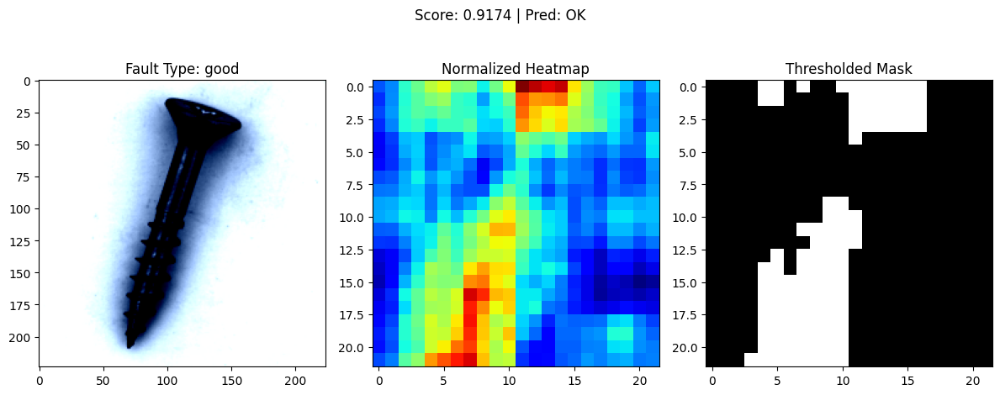


Processing: 008.png | Fault Type: thread_top


Anomaly Score: 0.1267
Heatmap stats -> min: 0.0548, max: 0.1369


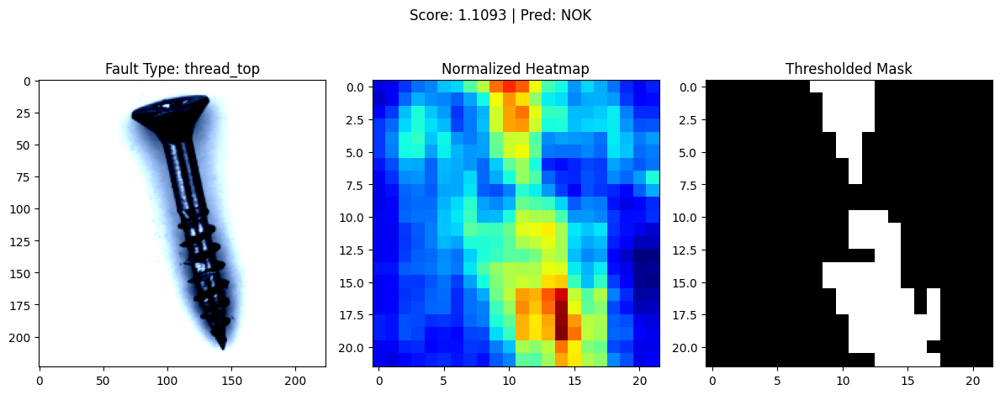


Processing: 004.png | Fault Type: thread_top
Anomaly Score: 0.1294
Heatmap stats -> min: 0.0506, max: 0.1462


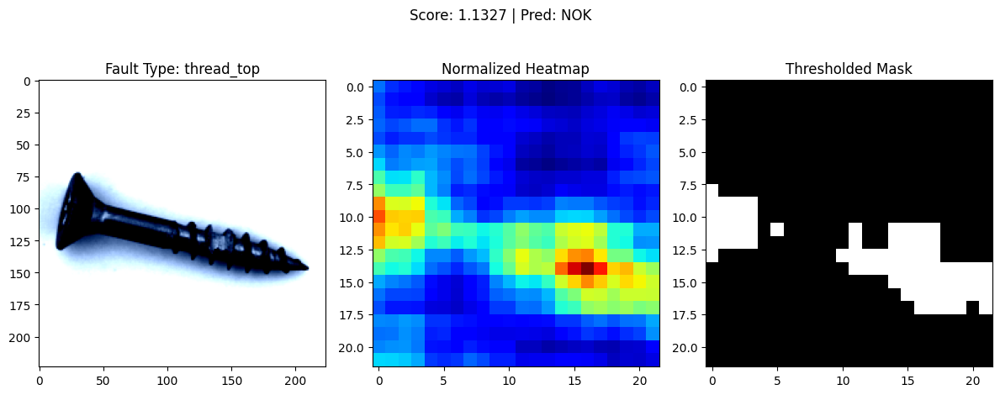


Processing: 014.png | Fault Type: thread_top
Anomaly Score: 0.1231
Heatmap stats -> min: 0.0568, max: 0.1281


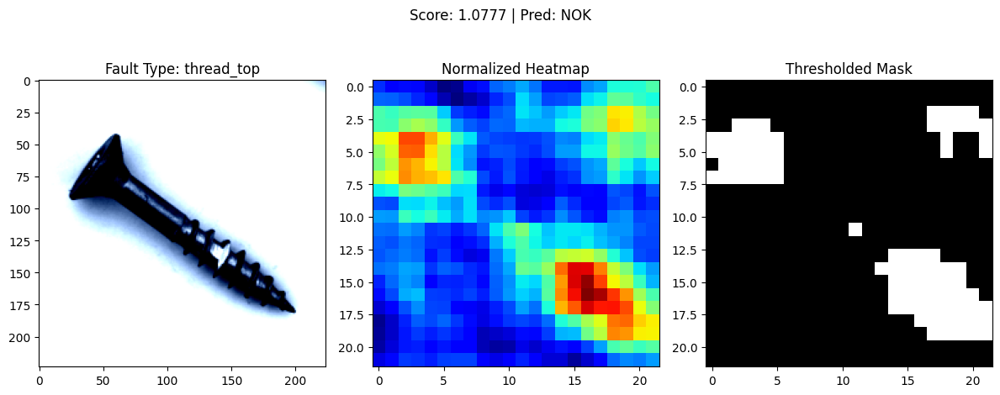


Processing: 016.png | Fault Type: thread_top
Anomaly Score: 0.1558
Heatmap stats -> min: 0.0495, max: 0.1682


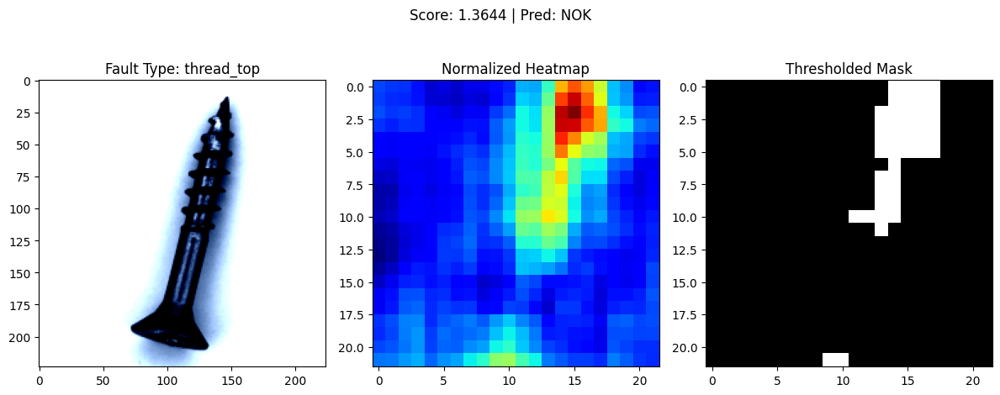


Processing: 013.png | Fault Type: thread_top
Anomaly Score: 0.1476
Heatmap stats -> min: 0.0559, max: 0.1608


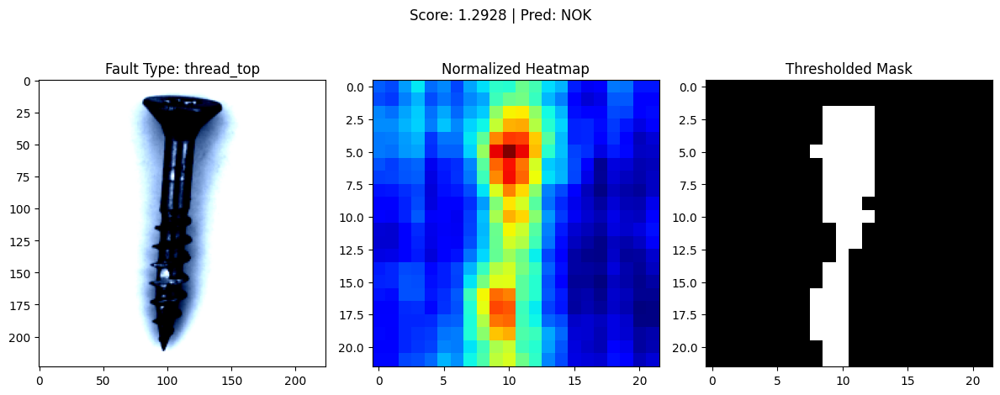


Processing: 007.png | Fault Type: thread_top
Anomaly Score: 0.1666
Heatmap stats -> min: 0.0551, max: 0.1807


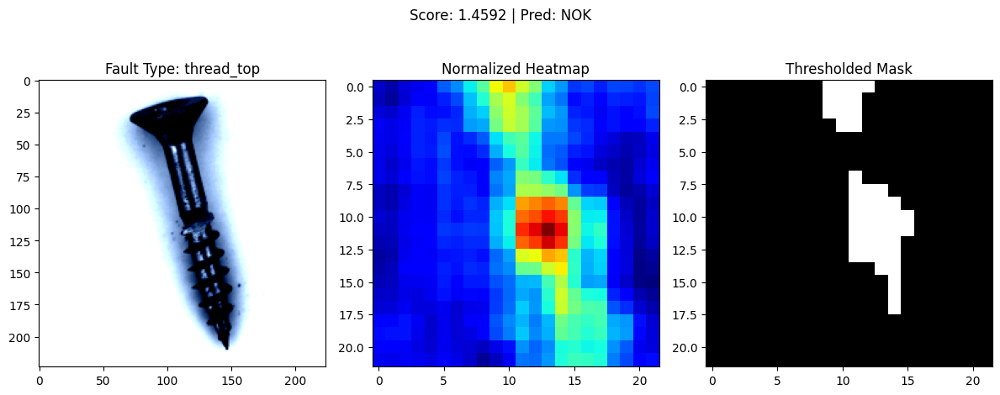


Processing: 011.png | Fault Type: thread_top
Anomaly Score: 0.1638
Heatmap stats -> min: 0.0483, max: 0.1969


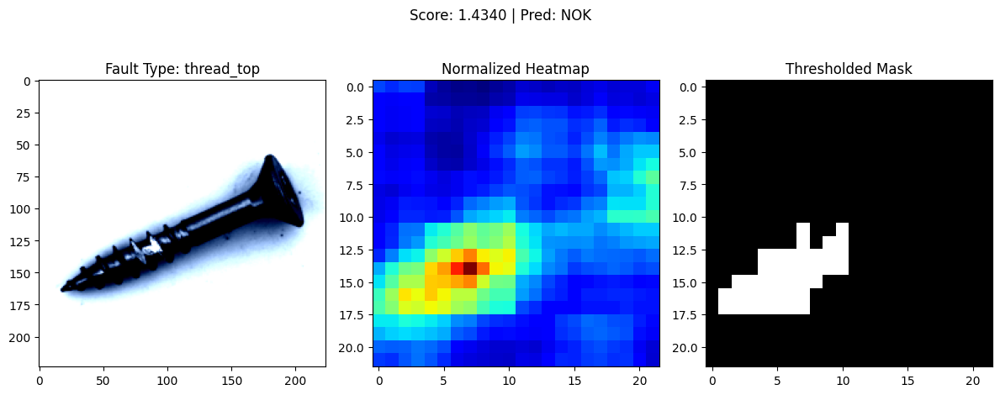


Processing: 022.png | Fault Type: thread_top
Anomaly Score: 0.1689
Heatmap stats -> min: 0.0520, max: 0.1838


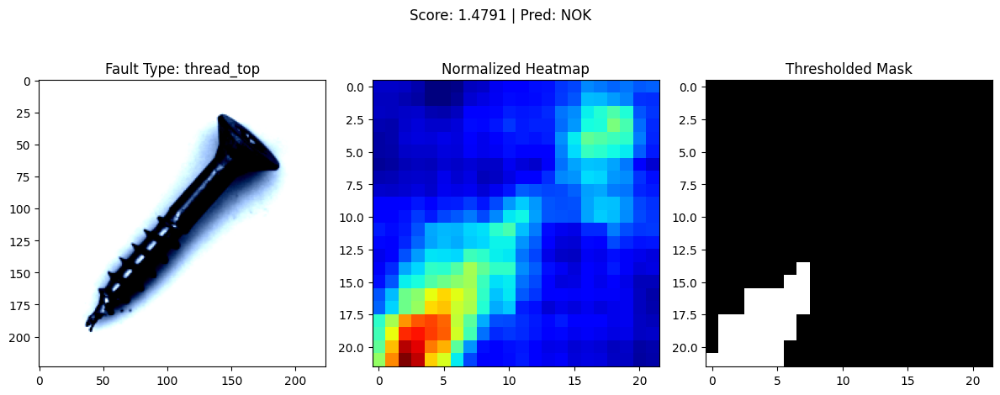


Processing: 021.png | Fault Type: thread_top
Anomaly Score: 0.1355
Heatmap stats -> min: 0.0553, max: 0.1469


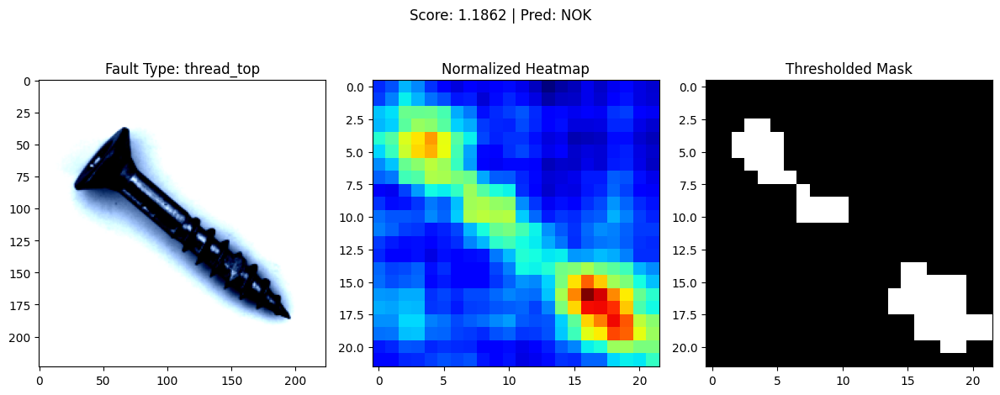


Processing: 010.png | Fault Type: thread_top
Anomaly Score: 0.1520
Heatmap stats -> min: 0.0520, max: 0.1661


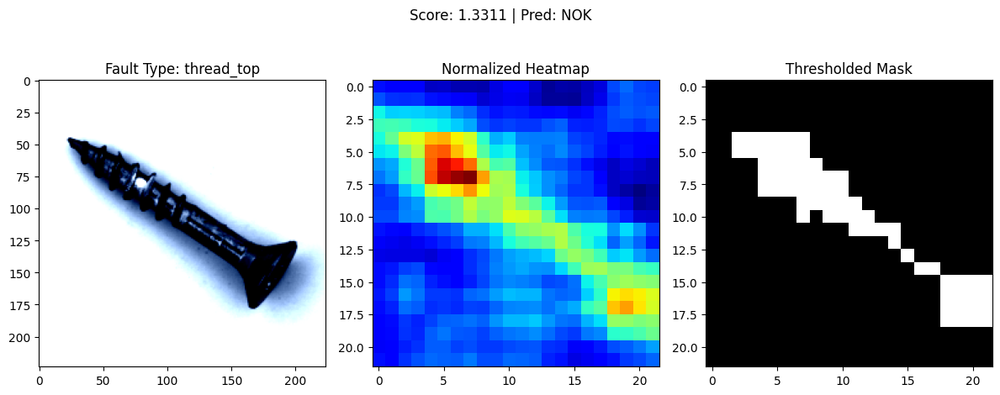


Processing: 002.png | Fault Type: thread_top
Anomaly Score: 0.1338
Heatmap stats -> min: 0.0519, max: 0.1437


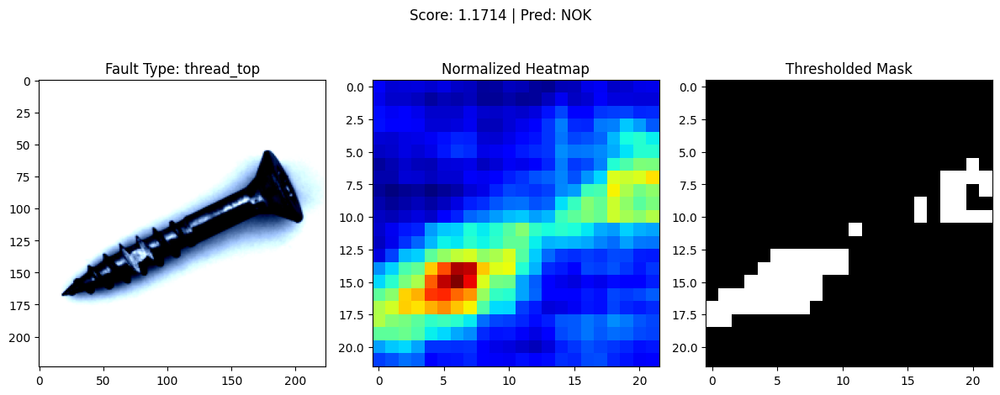


Processing: 018.png | Fault Type: thread_top
Anomaly Score: 0.1297
Heatmap stats -> min: 0.0580, max: 0.1328


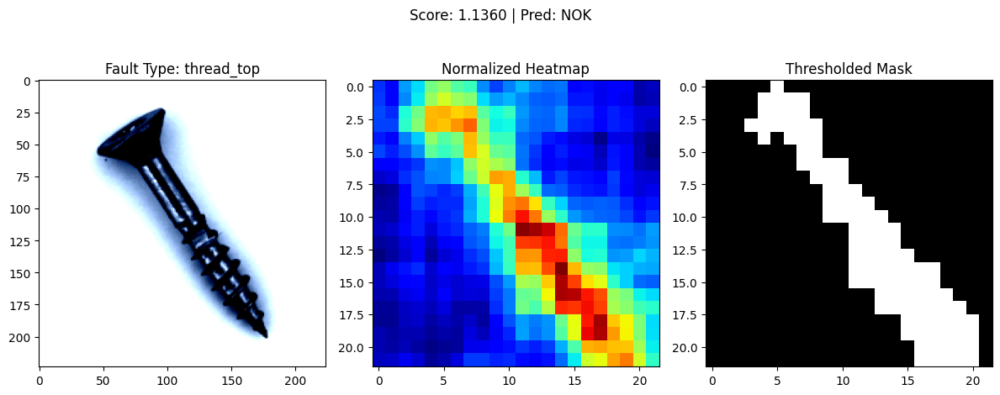


Processing: 001.png | Fault Type: thread_top
Anomaly Score: 0.1513
Heatmap stats -> min: 0.0541, max: 0.1673


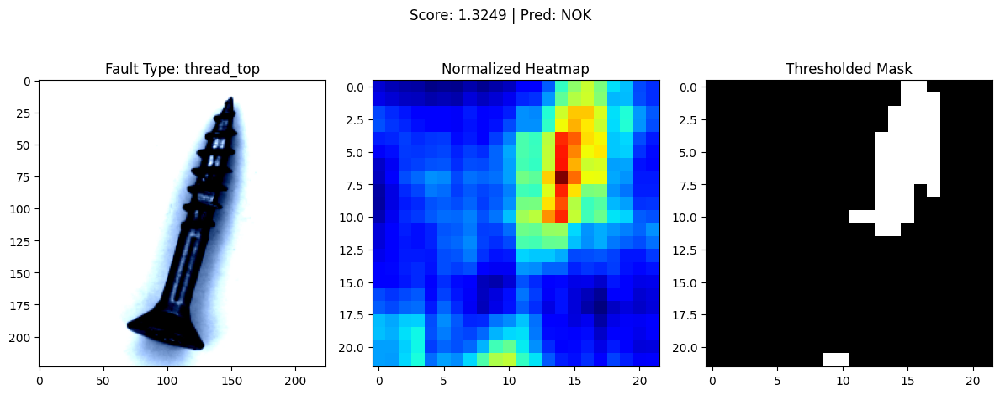


Processing: 009.png | Fault Type: thread_top
Anomaly Score: 0.1218
Heatmap stats -> min: 0.0515, max: 0.1316


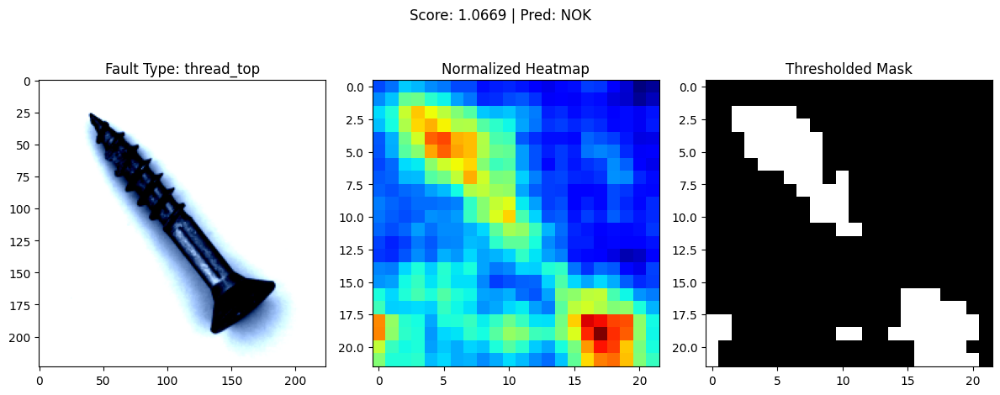


Processing: 003.png | Fault Type: thread_top
Anomaly Score: 0.1202
Heatmap stats -> min: 0.0562, max: 0.1283


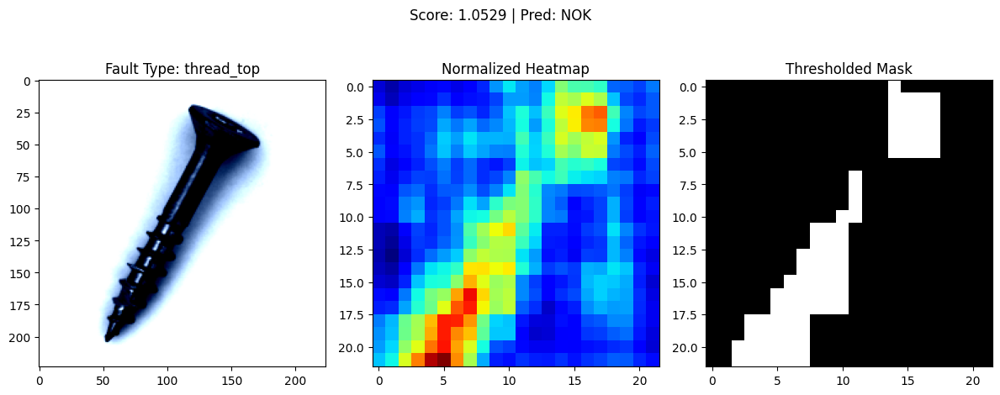


Processing: 019.png | Fault Type: thread_top
Anomaly Score: 0.1455
Heatmap stats -> min: 0.0552, max: 0.1688


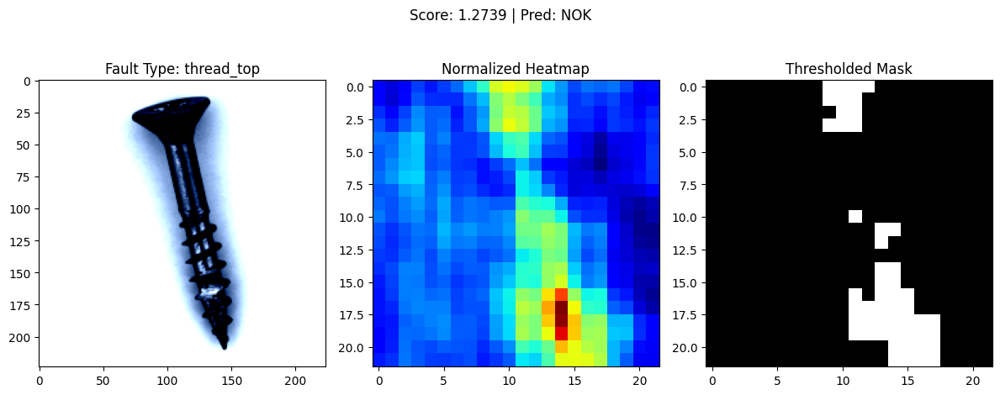


Processing: 000.png | Fault Type: thread_top
Anomaly Score: 0.1516
Heatmap stats -> min: 0.0511, max: 0.1650


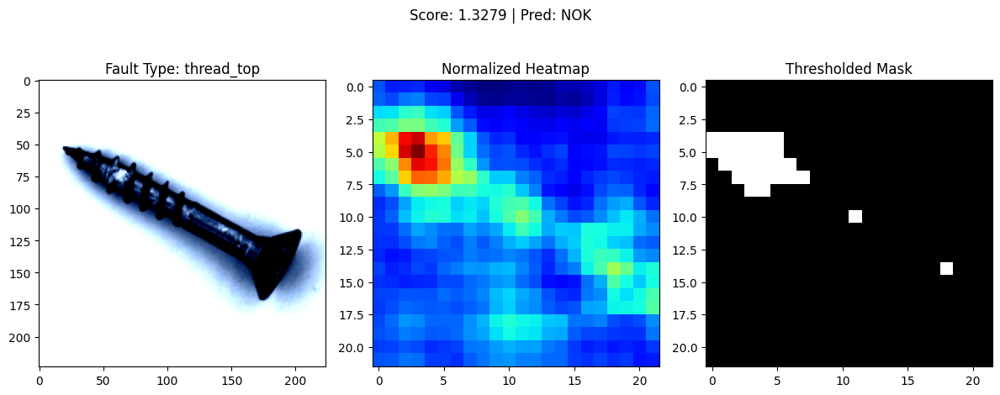


Processing: 015.png | Fault Type: thread_top
Anomaly Score: 0.1279
Heatmap stats -> min: 0.0531, max: 0.1346


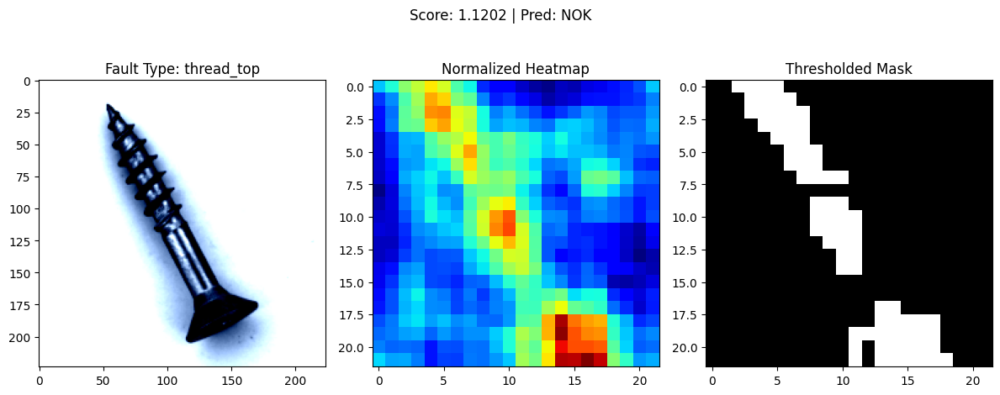


Processing: 005.png | Fault Type: thread_top
Anomaly Score: 0.1339
Heatmap stats -> min: 0.0583, max: 0.1383


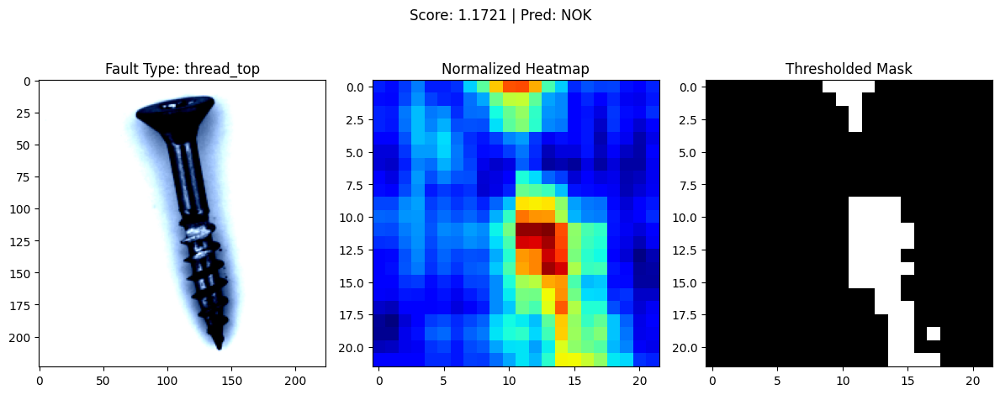


Processing: 006.png | Fault Type: thread_top
Anomaly Score: 0.1345
Heatmap stats -> min: 0.0522, max: 0.1504


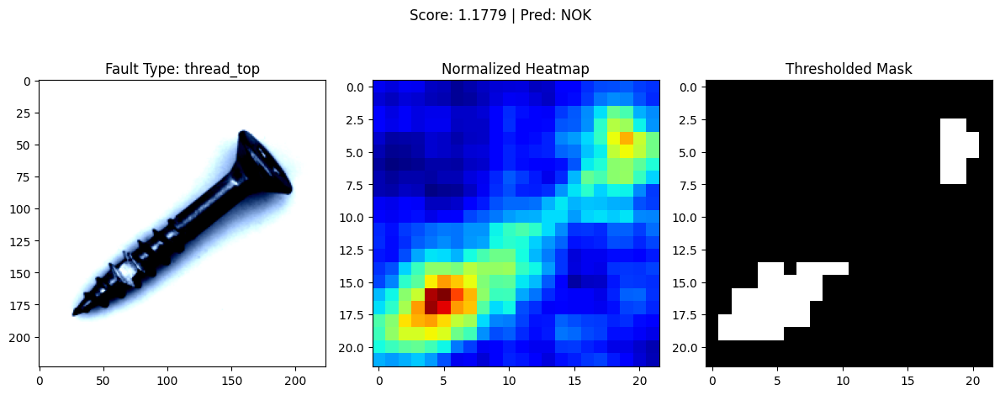


Processing: 017.png | Fault Type: thread_top
Anomaly Score: 0.1142
Heatmap stats -> min: 0.0544, max: 0.1256


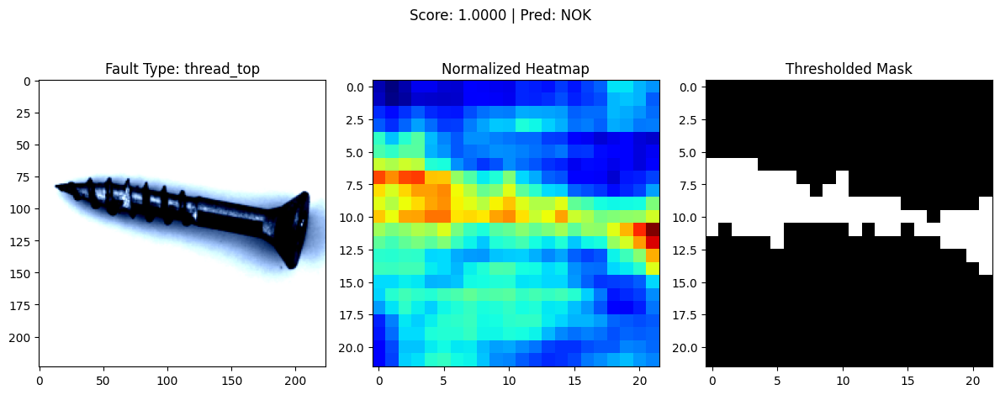


Processing: 020.png | Fault Type: thread_top
Anomaly Score: 0.1606
Heatmap stats -> min: 0.0556, max: 0.1689


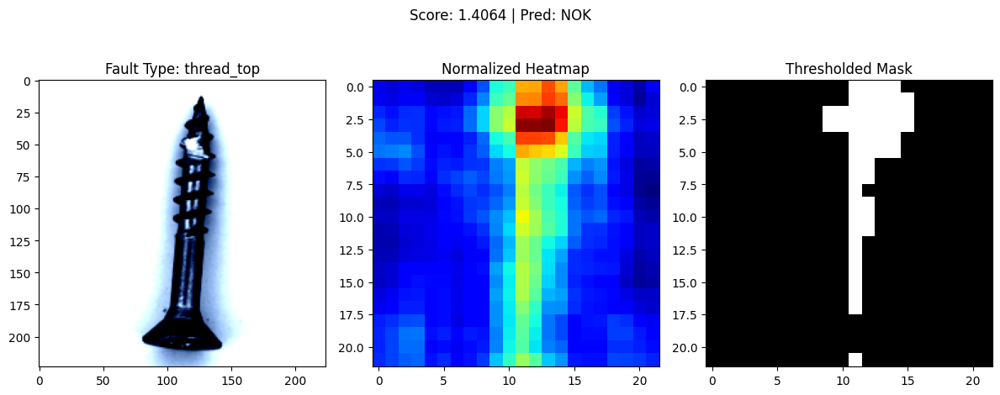


Processing: 012.png | Fault Type: thread_top
Anomaly Score: 0.1264
Heatmap stats -> min: 0.0502, max: 0.1348


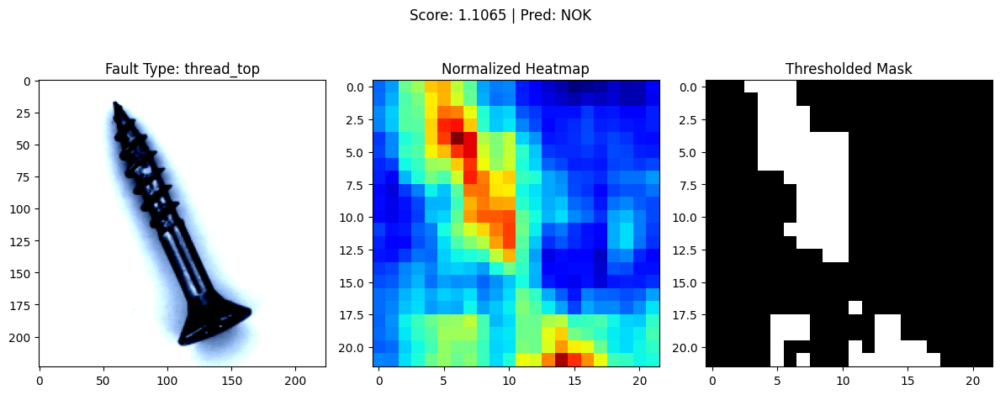


Processing: 008.png | Fault Type: scratch_neck
Anomaly Score: 0.1905
Heatmap stats -> min: 0.0540, max: 0.2210


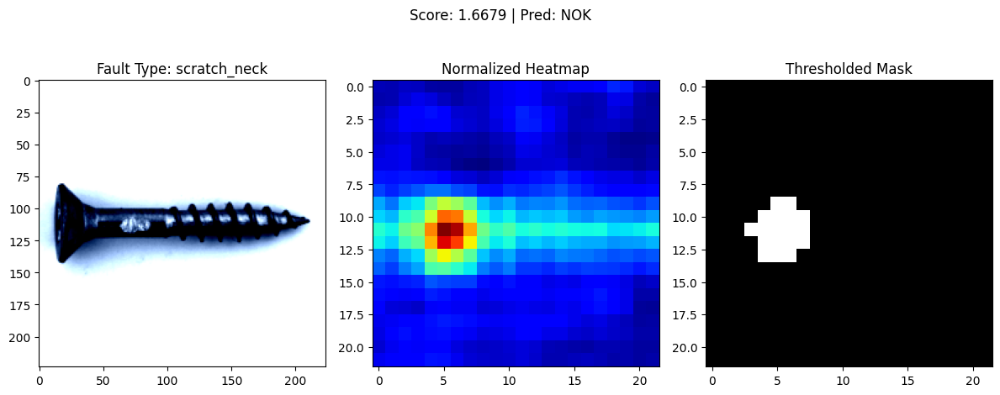


Processing: 004.png | Fault Type: scratch_neck
Anomaly Score: 0.1596
Heatmap stats -> min: 0.0518, max: 0.1847


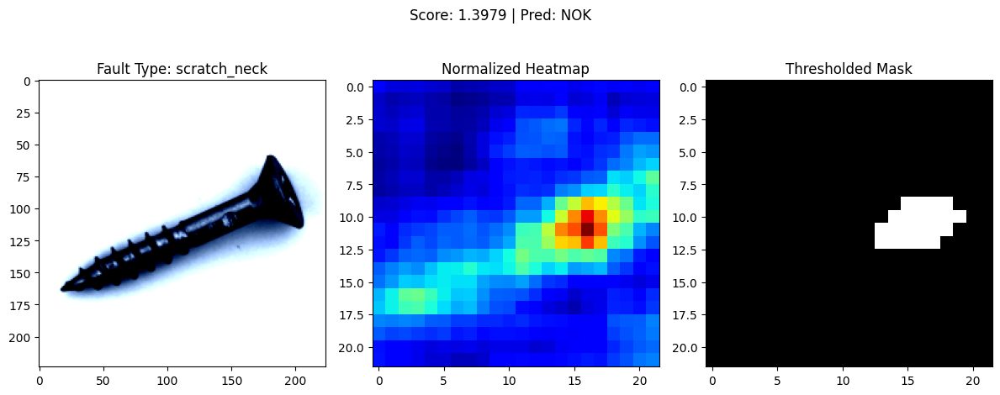


Processing: 014.png | Fault Type: scratch_neck
Anomaly Score: 0.1589
Heatmap stats -> min: 0.0504, max: 0.1772


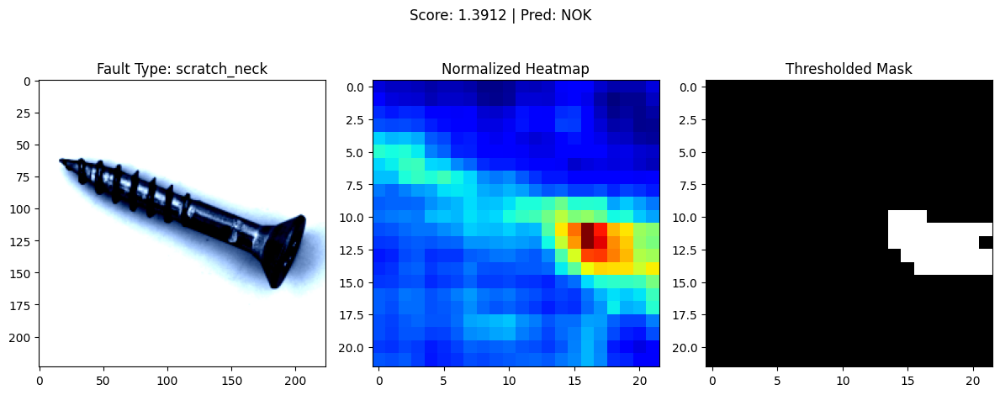


Processing: 016.png | Fault Type: scratch_neck
Anomaly Score: 0.1841
Heatmap stats -> min: 0.0536, max: 0.2028


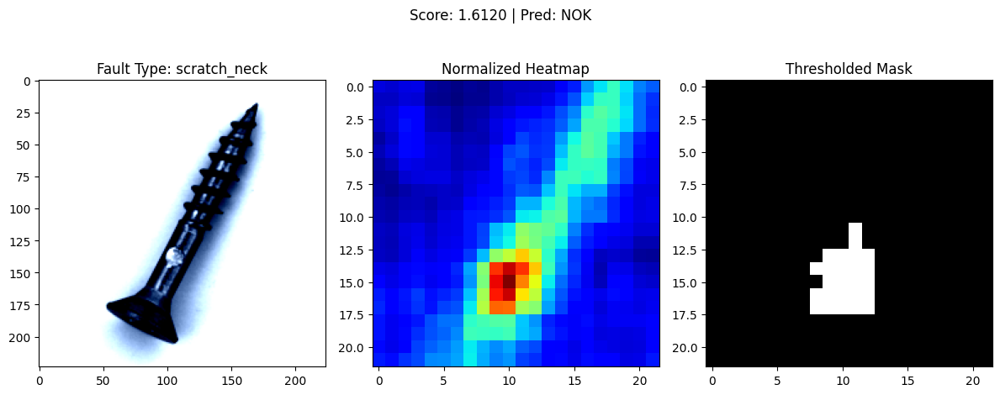


Processing: 013.png | Fault Type: scratch_neck
Anomaly Score: 0.1574
Heatmap stats -> min: 0.0538, max: 0.1778


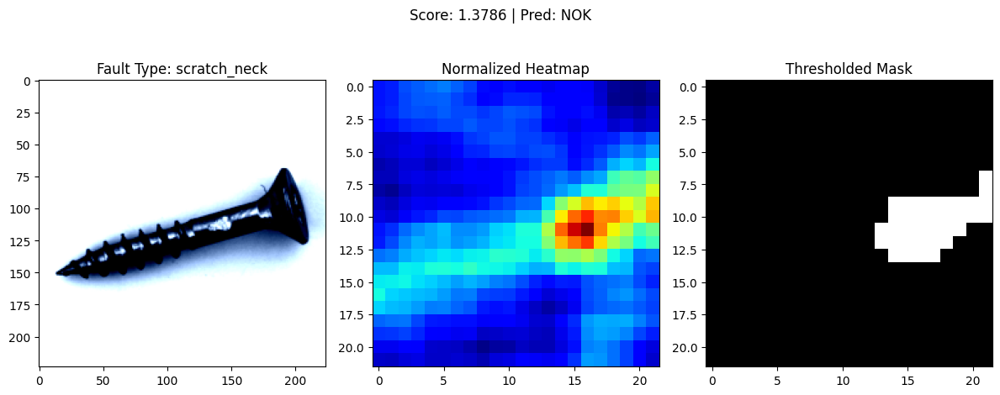


Processing: 007.png | Fault Type: scratch_neck
Anomaly Score: 0.1814
Heatmap stats -> min: 0.0527, max: 0.2062


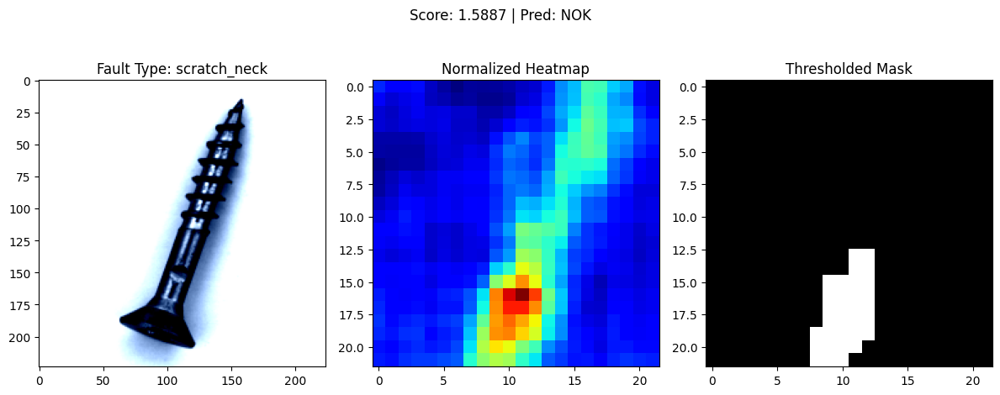


Processing: 011.png | Fault Type: scratch_neck
Anomaly Score: 0.1146
Heatmap stats -> min: 0.0569, max: 0.1184


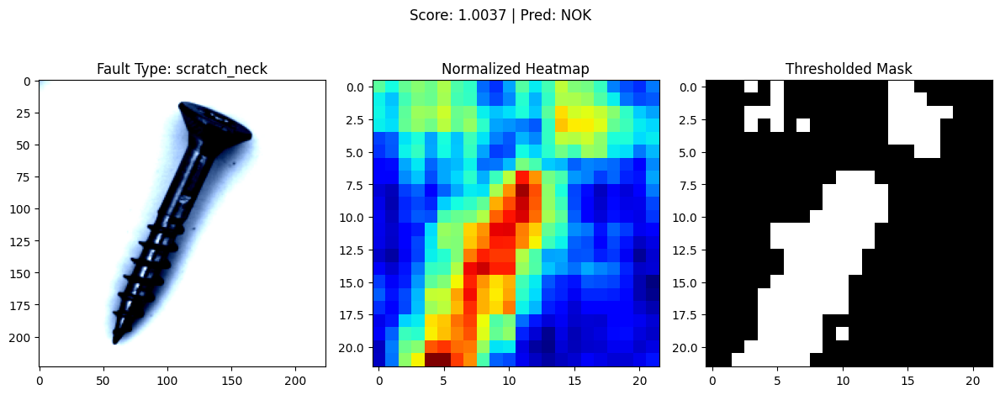


Processing: 022.png | Fault Type: scratch_neck
Anomaly Score: 0.1293
Heatmap stats -> min: 0.0493, max: 0.1462


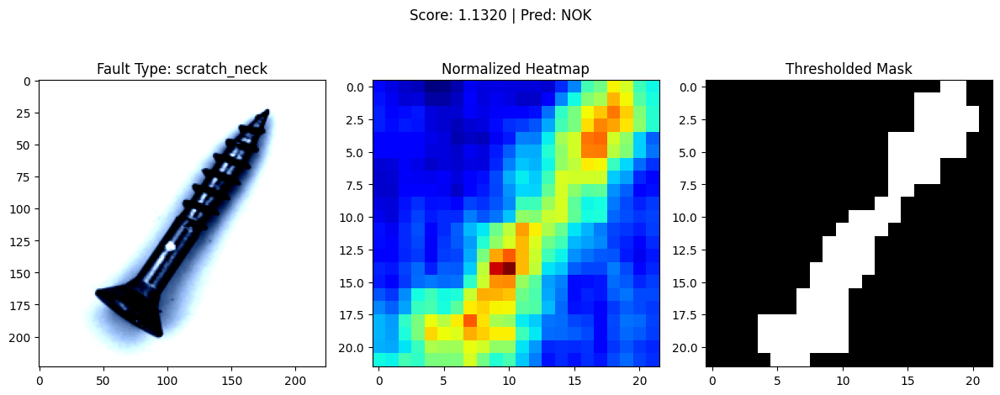


Processing: 021.png | Fault Type: scratch_neck
Anomaly Score: 0.1317
Heatmap stats -> min: 0.0523, max: 0.1481


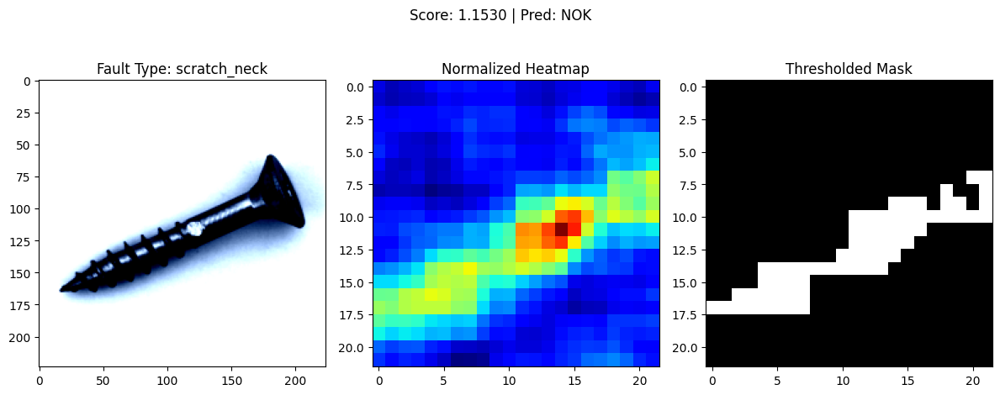


Processing: 010.png | Fault Type: scratch_neck
Anomaly Score: 0.1384
Heatmap stats -> min: 0.0593, max: 0.1600


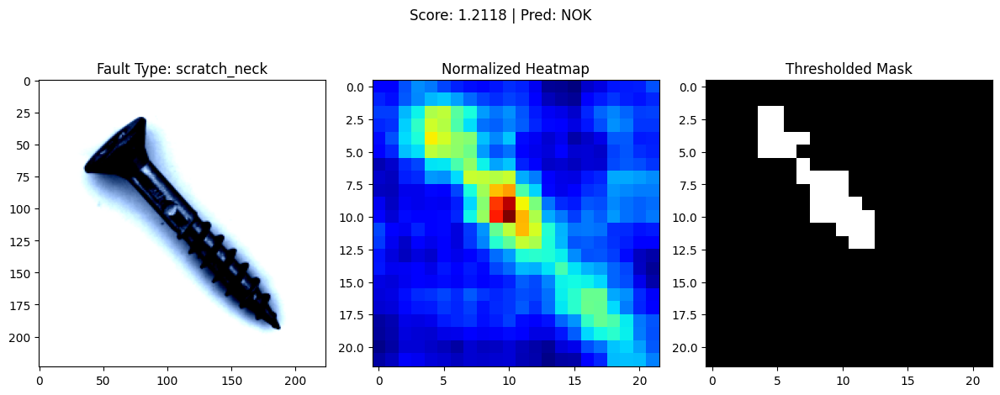


Processing: 002.png | Fault Type: scratch_neck
Anomaly Score: 0.1156
Heatmap stats -> min: 0.0533, max: 0.1222


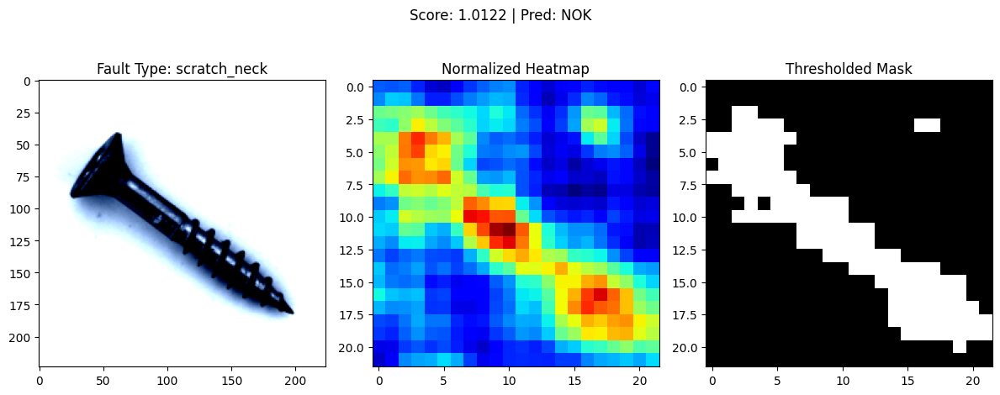


Processing: 018.png | Fault Type: scratch_neck
Anomaly Score: 0.1439
Heatmap stats -> min: 0.0464, max: 0.1629


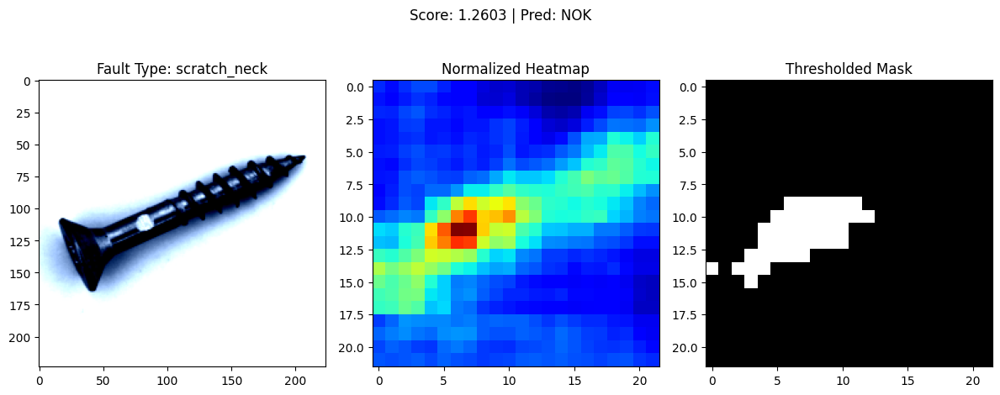


Processing: 001.png | Fault Type: scratch_neck
Anomaly Score: 0.1802
Heatmap stats -> min: 0.0528, max: 0.1890


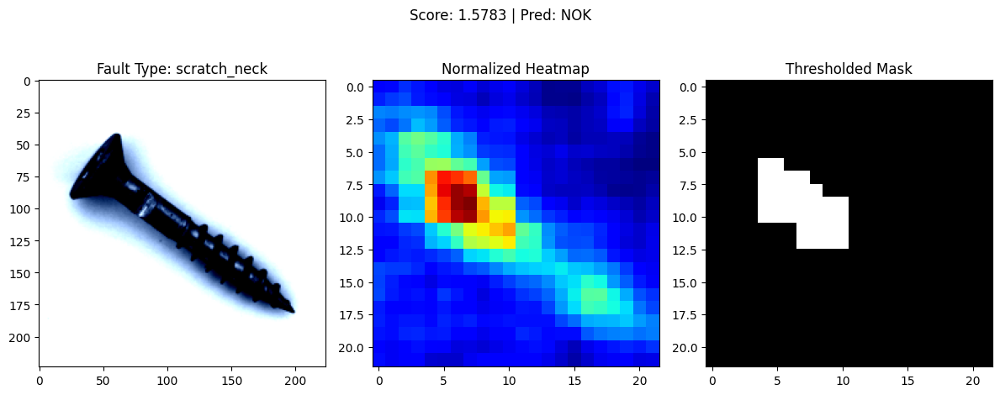


Processing: 023.png | Fault Type: scratch_neck
Anomaly Score: 0.1159
Heatmap stats -> min: 0.0553, max: 0.1246


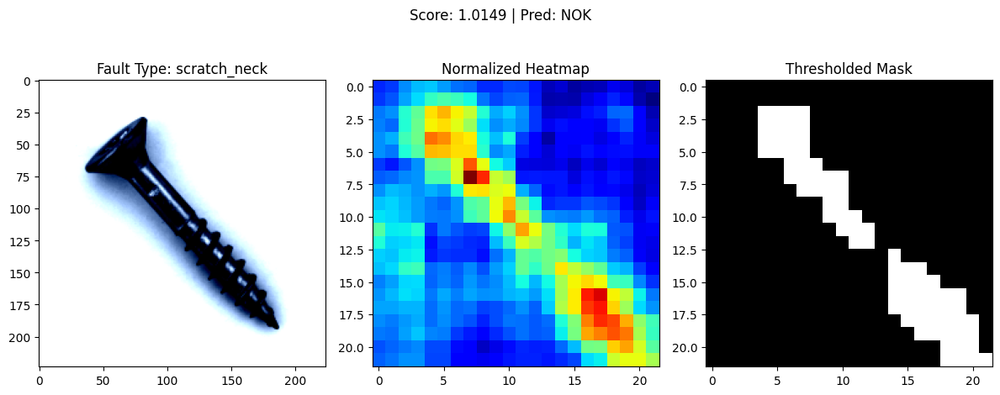


Processing: 009.png | Fault Type: scratch_neck
Anomaly Score: 0.1637
Heatmap stats -> min: 0.0555, max: 0.1853


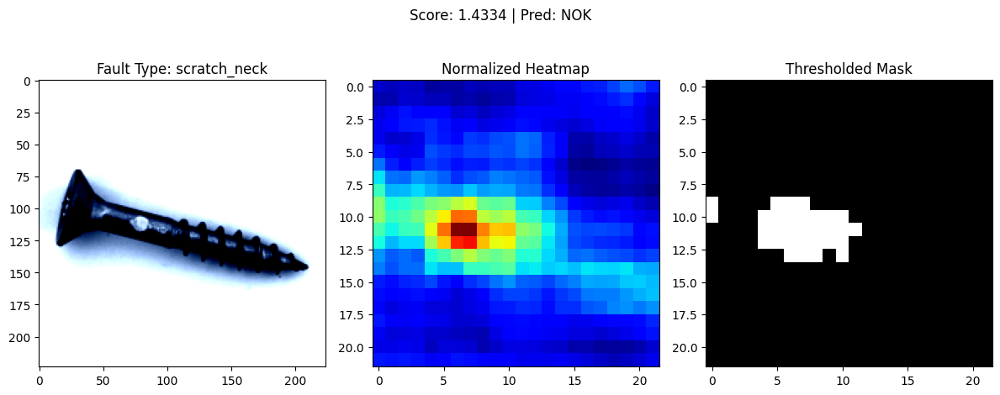


Processing: 003.png | Fault Type: scratch_neck
Anomaly Score: 0.1910
Heatmap stats -> min: 0.0528, max: 0.2172


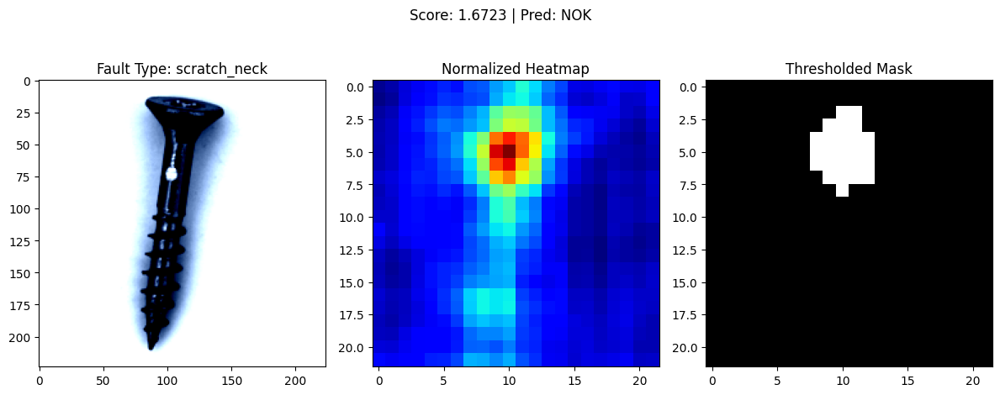


Processing: 019.png | Fault Type: scratch_neck
Anomaly Score: 0.1602
Heatmap stats -> min: 0.0499, max: 0.1737


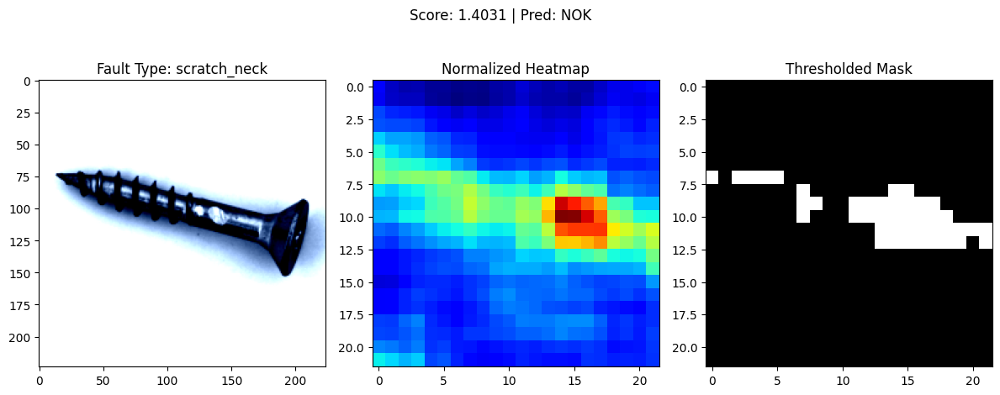


Processing: 000.png | Fault Type: scratch_neck
Anomaly Score: 0.1153
Heatmap stats -> min: 0.0510, max: 0.1204


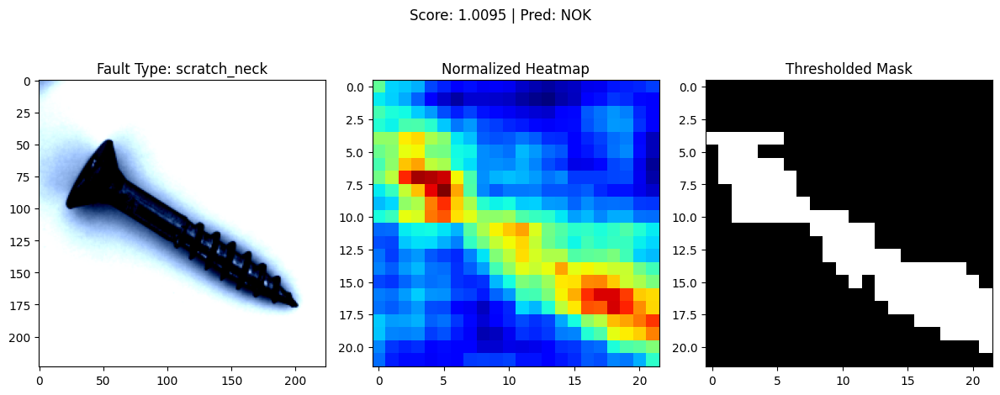


Processing: 015.png | Fault Type: scratch_neck
Anomaly Score: 0.1578
Heatmap stats -> min: 0.0569, max: 0.1800


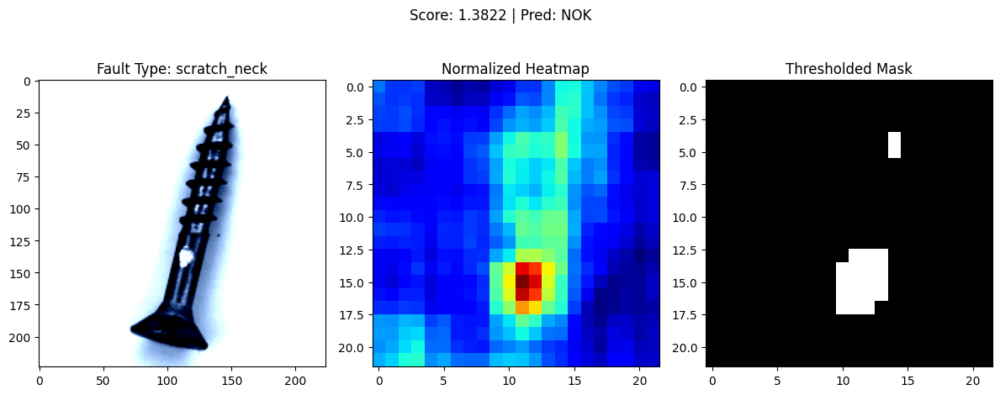


Processing: 005.png | Fault Type: scratch_neck
Anomaly Score: 0.1252
Heatmap stats -> min: 0.0516, max: 0.1298


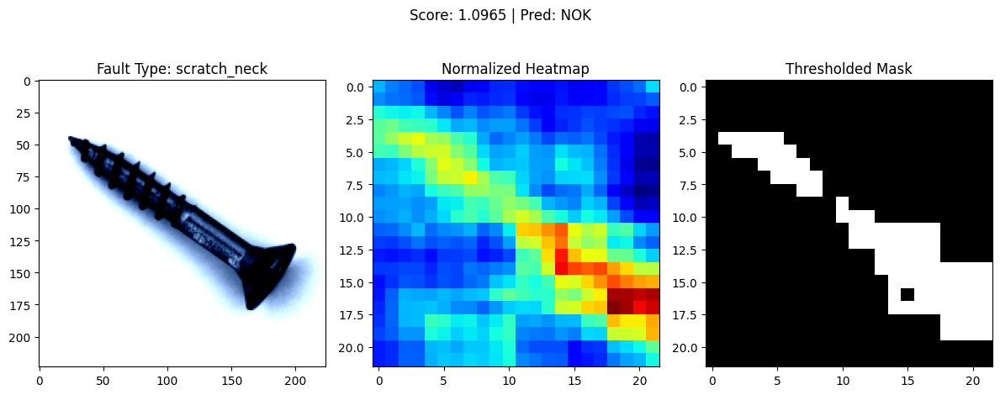


Processing: 006.png | Fault Type: scratch_neck
Anomaly Score: 0.1784
Heatmap stats -> min: 0.0530, max: 0.1951


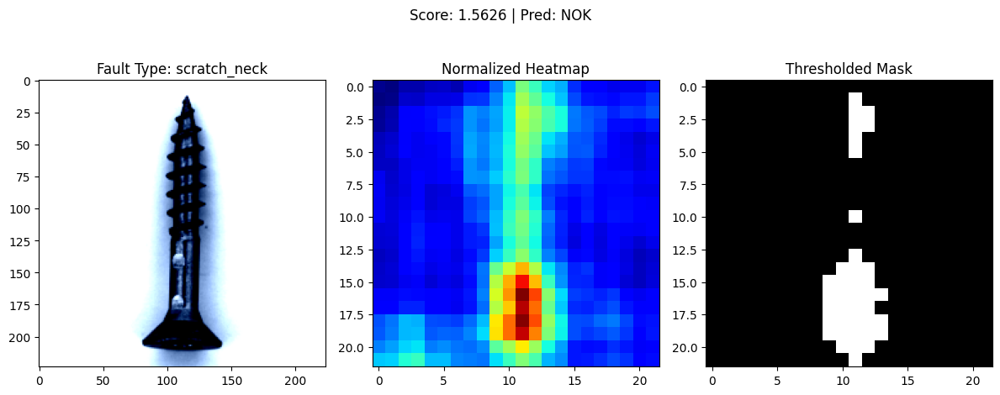


Processing: 017.png | Fault Type: scratch_neck
Anomaly Score: 0.1438
Heatmap stats -> min: 0.0559, max: 0.1543


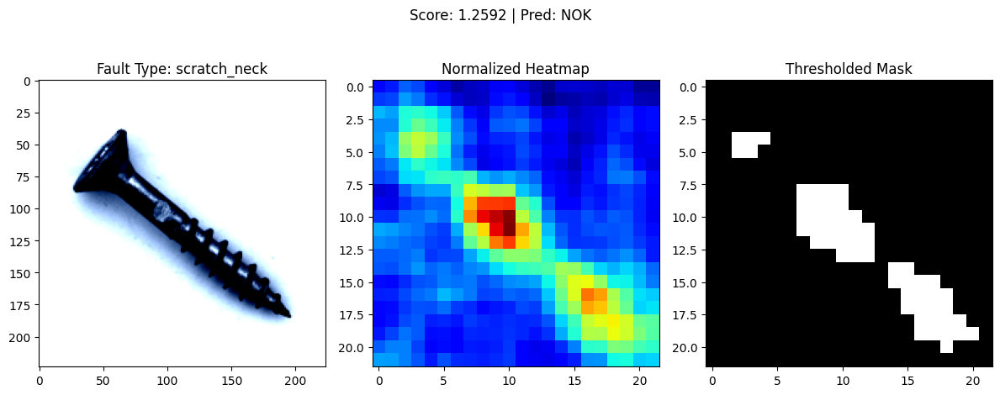


Processing: 024.png | Fault Type: scratch_neck
Anomaly Score: 0.1519
Heatmap stats -> min: 0.0533, max: 0.1712


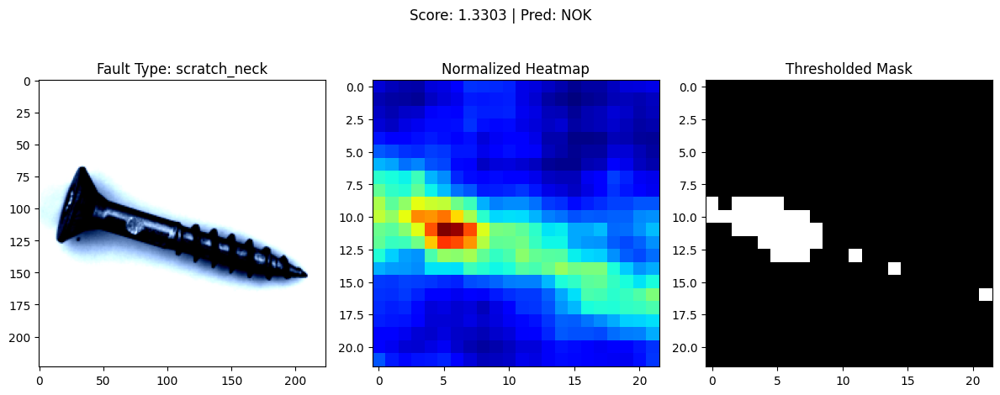


Processing: 020.png | Fault Type: scratch_neck
Anomaly Score: 0.2405
Heatmap stats -> min: 0.0554, max: 0.2810


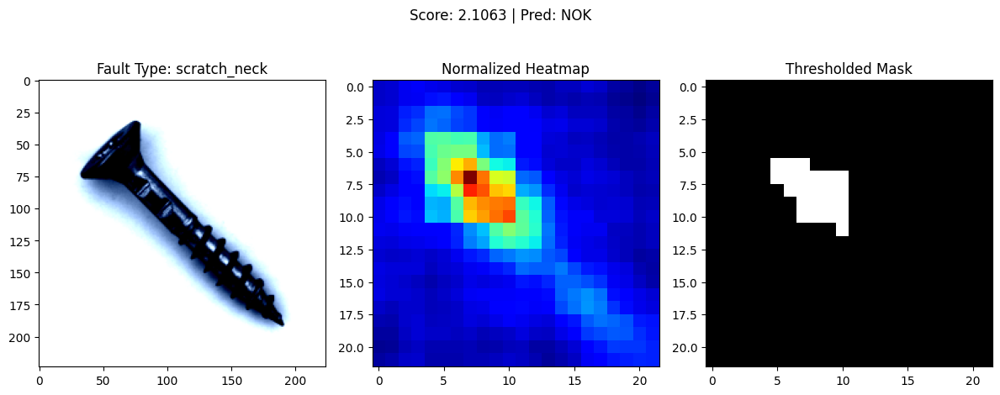


Processing: 012.png | Fault Type: scratch_neck
Anomaly Score: 0.1412
Heatmap stats -> min: 0.0507, max: 0.1557


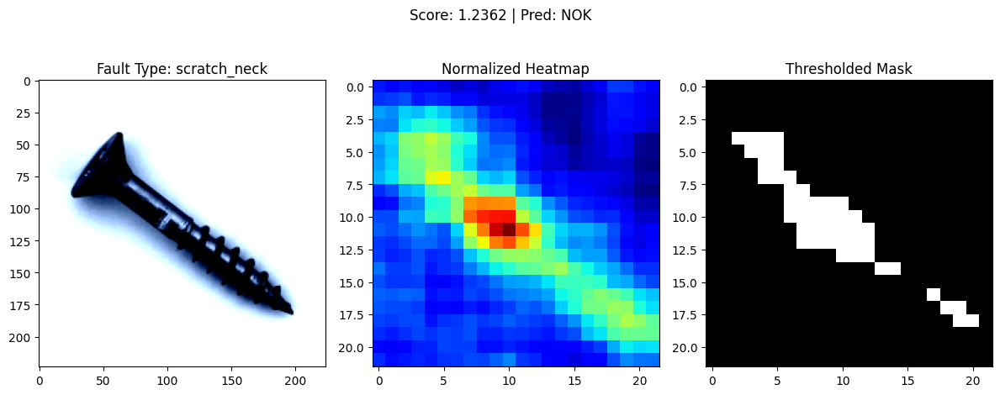

In [45]:
import torch
import cv2, time
from IPython.display import clear_output
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

model.eval()
backbone.eval()

test_path = Path('/content/screw/test')
files = list(test_path.glob('*/*.png'))

print(f"Total images found: {len(files)}")

class_label = ['OK', 'NOK']

for path in files:
    fault_type = path.parts[-2]
    print(f"\nProcessing: {path.name} | Fault Type: {fault_type}")

    image = Image.open(path).convert('RGB')
    test_image = transform(image).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        recon = model(features)

    # Generate segmentation map
    segm_map = ((features - recon)**2).mean(dim=1)[:, 3:-3, 3:-3]

    # Check if it's valid
    if torch.isnan(segm_map).any():
        print("⚠️ segm_map contains NaNs")
        continue

    y_score_image = decision_function(segm_map=segm_map)
    y_pred_image = 1 * (y_score_image >= best_threshold)

    # Get heatmap as numpy
    heat_map = segm_map.squeeze().cpu().numpy()

    print(f"Anomaly Score: {y_score_image.item():.4f}")
    print(f"Heatmap stats -> min: {heat_map.min():.4f}, max: {heat_map.max():.4f}")

    # Normalize heatmap to [0, 1] for better visibility (optional)
    norm_heat_map = (heat_map - heat_map.min()) / (heat_map.max() - heat_map.min() + 1e-8)

    plt.figure(figsize=(12, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(test_image.squeeze().permute(1, 2, 0).cpu().numpy())
    plt.title(f'Fault Type: {fault_type}')

    # Raw Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(norm_heat_map, cmap='jet')
    plt.title("Normalized Heatmap")

    # Thresholded Anomaly Mask
    plt.subplot(1, 3, 3)
    binary_map = norm_heat_map > 0.5  # adjust threshold if needed
    plt.imshow(binary_map, cmap='gray')
    plt.title("Thresholded Mask")

    plt.suptitle(f'Score: {y_score_image.item() / best_threshold:.4f} | Pred: {class_label[y_pred_image.item()]}', fontsize=12)

    plt.tight_layout()
    plt.show()

    # break  # remove if you want to process all

In [46]:
files = list(test_path.glob('*/*.png'))
print(f"Found {len(files)} images.")


Found 160 images.


Found 160 images.

Processing file: 008.png, fault_type: thread_side
Anomaly score: 0.11426975578069687, Prediction: NOK


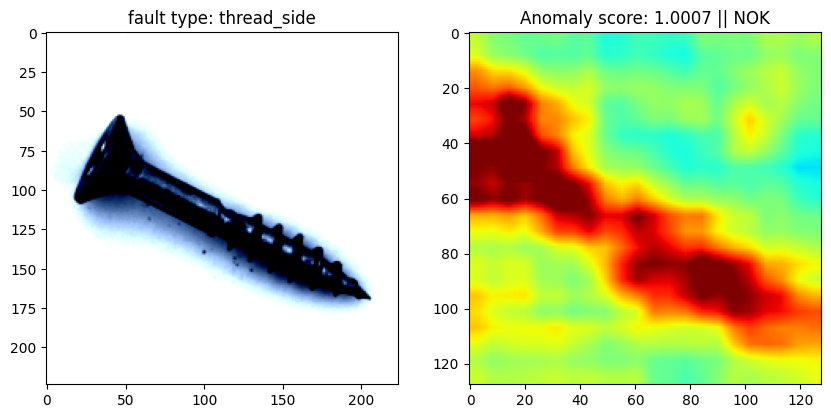

In [47]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import cv2, time

model.eval()
backbone.eval()

test_path = Path('/content/screw/test')
files = list(test_path.glob('*/*.png'))
print(f"Found {len(files)} images.")

for path in files:
    fault_type = path.parts[-2]
    print(f"\nProcessing file: {path.name}, fault_type: {fault_type}")

    image = Image.open(path).convert('RGB')
    test_image = transform(image).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))[:, 3:-3, 3:-3]
    y_score_image = decision_function(segm_map=segm_map)
    y_pred_image = 1 * (y_score_image >= best_threshold)
    class_label = ['OK', 'NOK']

    print(f"Anomaly score: {y_score_image.item()}, Prediction: {class_label[y_pred_image.item()]}")

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(test_image.squeeze().permute(1, 2, 0).cpu().numpy())
    plt.title(f'fault type: {fault_type}')

    heat_map = segm_map.squeeze().cpu().numpy()
    heat_map = cv2.resize(heat_map, (128, 128))

    plt.subplot(1, 2, 2)
    plt.imshow(heat_map, cmap='jet', vmin=heat_map_min, vmax=heat_map_max * 2)
    plt.title(f'Anomaly score: {y_score_image.item() / best_threshold:0.4f} || {class_label[y_pred_image.item()]}')

    plt.show()
    break  # Show one and break to test